In [1]:
import os
import scipy.io
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
sns.set_context('paper', font_scale=1.2)
import pandas as pd
from sklearn.model_selection import KFold
import scipy.stats
import warnings
from copy import copy

warnings.filterwarnings("ignore")
%matplotlib inline
%load_ext autoreload
%autoreload 2

In [2]:
#Plotting function
from PlotDecodingResults import ModelPredictionPlots
from RunKeras import SimpleDenseNN as SDNN
from sklearn.model_selection import train_test_split
m = ModelPredictionPlots()

Using TensorFlow backend.


Validation functions


## Get Data for training and testing

In [3]:
task_dict = {'Task1':'1 Fam Rew', 
             'Task2':'2 No Rew', 
             'Task3':'3 Fam Rew', 
             'Task4':'4 Nov Rew'}

In [4]:
FolderName = '/home/sheffieldlab/Desktop/NoReward/ImagingData/Good_behavior/NR6/'

frame_lick_stop = 5154
task_numframes = {'Task1': 20000, 
                  'Task2': 20000, 
                  'Task3': 15000, 
                  'Task4': 15000}
#Track Parameters
tracklength = 200 #2m track
trackbins = 5 #5cm bins

In [5]:
SaveResults = os.path.join(FolderName, 'DecoderResults', 'DenseNNDecoder')
if not os.path.exists(SaveResults):
    os.mkdir(SaveResults)

In [6]:
from Placecells_and_LickCorrelation_EachAnimal import GetData as gd
A = gd(FolderName=FolderName, Task_NumFrames=task_numframes, TaskDict=task_dict, lick_stop=frame_lick_stop)

Number of PlaceCells in Task1 is 92
Number of PlaceCells in Task2 is 97
Number of PlaceCells in Task2a is 87
Number of PlaceCells in Task4 is 80
Number of PlaceCells in Task3 is 82


In [7]:
# Get Xdata - calcium data and Ydata - running behavior
X = A.Fc3data_dict['Task1'][:, A.Parsed_Behavior['good_running_index'].item()['Task1']].T[:11100, :]
Y = A.Parsed_Behavior['good_running_data'].item()['Task1'][:11100]
print(np.shape(X), np.shape(Y))

(11100, 316) (11100, 1)


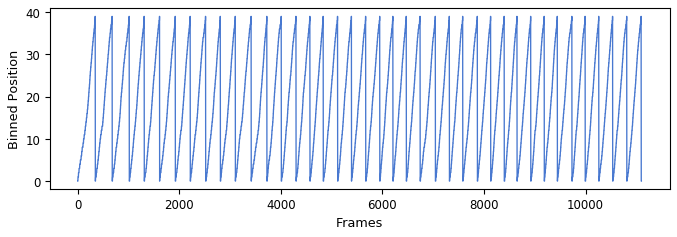

In [8]:
from RunKeras import PrepareBehaviorData as pbd
B = pbd(BehaviorData=Y, tracklength=tracklength, trackbins=trackbins)
y_cat = B.position_onehotencoded

## Run Sequential NN

### Run models with multiple parameters

In [9]:
#Split testing and training data
X_train, X_test, y_train, y_test = train_test_split(X, y_cat, test_size=0.10, random_state=None, shuffle=False)
print(np.shape(X_train), np.shape(X_test), np.shape(y_train), np.shape(y_test))

(9990, 316) (1110, 316) (9990, 40) (1110, 40)


In [10]:
# Save ground truth
np.savez(os.path.join(SaveResults, 'ground_truth.npz'), X=X, y=y_cat, 
         X_train=X_train, X_test=X_test, y_train=y_train, y_test=y_test)

#### Run different dropouts

In [11]:
#Inputs  - loop on dropout
dropouts = [0, 0.1, 0.2, 0.3, 0.4, 0.5]
epochs = 30
units = [np.size(X, 1), 500]
batch_size = 30

W0711 14:10:56.560827 139719374673728 deprecation_wrapper.py:119] From /home/sheffieldlab/anaconda3/envs/keras_tf/lib/python3.7/site-packages/keras/backend/tensorflow_backend.py:74: The name tf.get_default_graph is deprecated. Please use tf.compat.v1.get_default_graph instead.

W0711 14:10:56.577840 139719374673728 deprecation_wrapper.py:119] From /home/sheffieldlab/anaconda3/envs/keras_tf/lib/python3.7/site-packages/keras/backend/tensorflow_backend.py:517: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.

W0711 14:10:56.580521 139719374673728 deprecation_wrapper.py:119] From /home/sheffieldlab/anaconda3/envs/keras_tf/lib/python3.7/site-packages/keras/backend/tensorflow_backend.py:4138: The name tf.random_uniform is deprecated. Please use tf.random.uniform instead.

W0711 14:10:56.632954 139719374673728 deprecation_wrapper.py:119] From /home/sheffieldlab/anaconda3/envs/keras_tf/lib/python3.7/site-packages/keras/optimizers.py:790: The name tf.train.Opt

Training with dropout 0.0
Fitting Model


W0711 14:10:56.801645 139719374673728 deprecation_wrapper.py:119] From /home/sheffieldlab/anaconda3/envs/keras_tf/lib/python3.7/site-packages/keras/backend/tensorflow_backend.py:986: The name tf.assign_add is deprecated. Please use tf.compat.v1.assign_add instead.

W0711 14:10:56.929771 139719374673728 deprecation_wrapper.py:119] From /home/sheffieldlab/anaconda3/envs/keras_tf/lib/python3.7/site-packages/keras/backend/tensorflow_backend.py:973: The name tf.assign is deprecated. Please use tf.compat.v1.assign instead.



9990/9990 [==============================] - 0s 27us/step

Accuracy of training set: 98.39%
1110/1110 [==============================] - 0s 22us/step

Accuracy of test set:: 55.14%


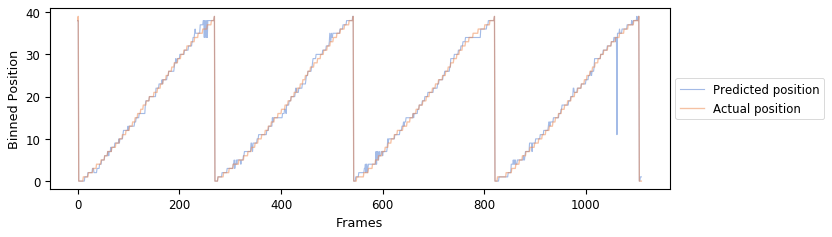

W0711 14:11:28.464155 139719374673728 deprecation.py:506] From /home/sheffieldlab/anaconda3/envs/keras_tf/lib/python3.7/site-packages/keras/backend/tensorflow_backend.py:3445: calling dropout (from tensorflow.python.ops.nn_ops) with keep_prob is deprecated and will be removed in a future version.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


Training with dropout 0.1
Fitting Model
9990/9990 [==============================] - 0s 30us/step

Accuracy of training set: 98.04%
1110/1110 [==============================] - 0s 24us/step

Accuracy of test set:: 55.23%


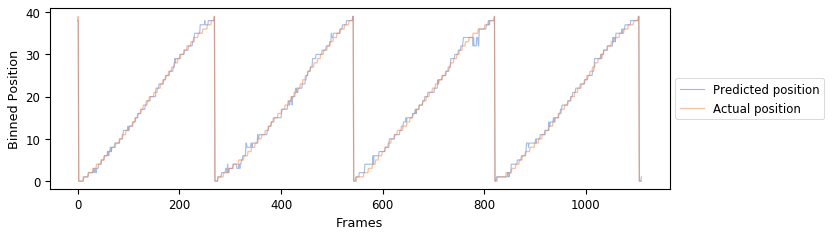

Training with dropout 0.2
Fitting Model
9990/9990 [==============================] - 1s 71us/step

Accuracy of training set: 97.43%
1110/1110 [==============================] - 0s 31us/step

Accuracy of test set:: 51.53%


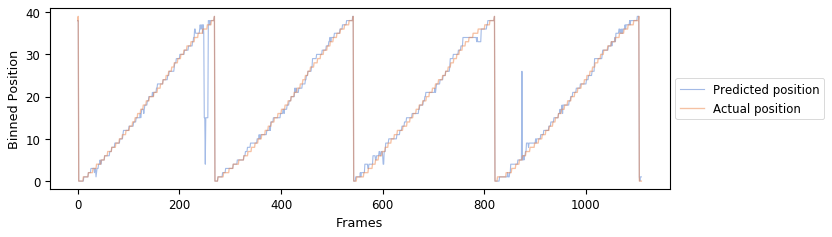

Training with dropout 0.3
Fitting Model
9990/9990 [==============================] - 0s 33us/step

Accuracy of training set: 96.30%
1110/1110 [==============================] - 0s 27us/step

Accuracy of test set:: 55.77%


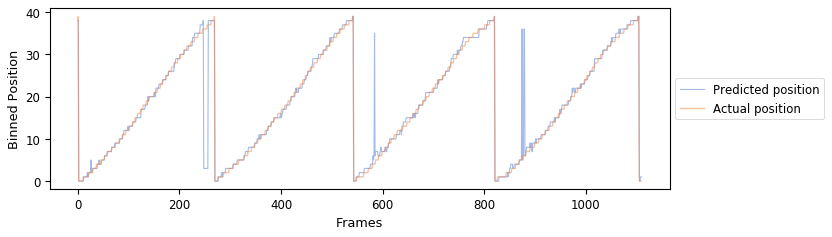

Training with dropout 0.4
Fitting Model
9990/9990 [==============================] - 0s 45us/step

Accuracy of training set: 94.46%
1110/1110 [==============================] - 0s 31us/step

Accuracy of test set:: 53.42%


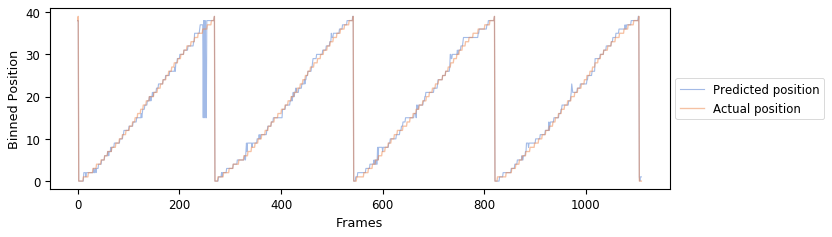

Training with dropout 0.5
Fitting Model
9990/9990 [==============================] - 0s 48us/step

Accuracy of training set: 92.64%
1110/1110 [==============================] - 0s 30us/step

Accuracy of test set:: 55.32%


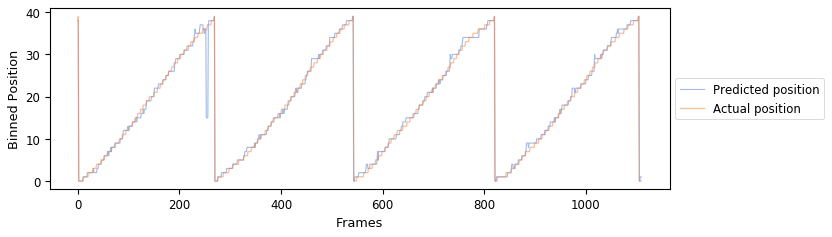

In [12]:
R2_dropout = []
rho_dropout = []
for d in dropouts:
    print(f'Training with dropout %.1f' %d)
    n = SDNN(dropout=d, epochs=epochs, hiddenlayer=1, units=units, batch_size=batch_size, verbose=0)
    densennmodel = n.fit_model(X_train, y_train)
    score, prediction = n.validate_model(densennmodel, X_test, y_test)
    # Print mean correlation and mean R2
    R2_dropout.append(m.get_R2(np.argmax(y_test, 1), prediction))
    rho_dropout.append(m.get_rho(np.argmax(y_test, 1), prediction))

In [13]:
R2_dropout

[0.9925804877921227,
 0.9955261080872766,
 0.9668217161734124,
 0.9121243819897586,
 0.9846864718965322,
 0.9845817113421022]

In [14]:
# Save ground truth
np.savez(os.path.join(SaveResults, 'changedropouts.npz'), R2=R2_dropout, rho=rho_dropout, dropout=dropouts)

#### Run different batch sizes

In [15]:
#Inputs
dropout = 0
epochs = 30
units = [np.size(X, 1), 500]
batch_sizes = [10, 30, 100, 500, 1000, 2000, 5000]

Training with batch size 10.0
Fitting Model
9990/9990 [==============================] - 1s 85us/step

Accuracy of training set: 97.97%
1110/1110 [==============================] - 0s 61us/step

Accuracy of test set:: 54.41%


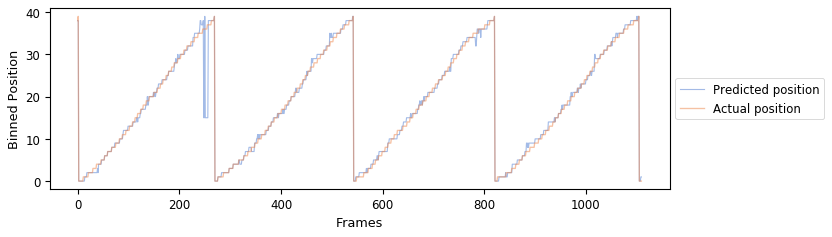

Training with batch size 30.0
Fitting Model
9990/9990 [==============================] - 1s 58us/step

Accuracy of training set: 98.27%
1110/1110 [==============================] - 0s 41us/step

Accuracy of test set:: 54.23%


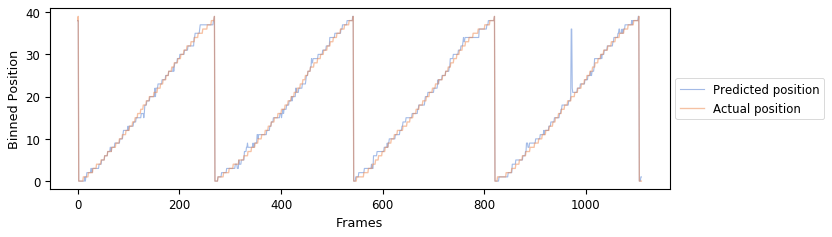

Training with batch size 100.0
Fitting Model
9990/9990 [==============================] - 0s 23us/step

Accuracy of training set: 98.04%
1110/1110 [==============================] - 0s 20us/step

Accuracy of test set:: 55.05%


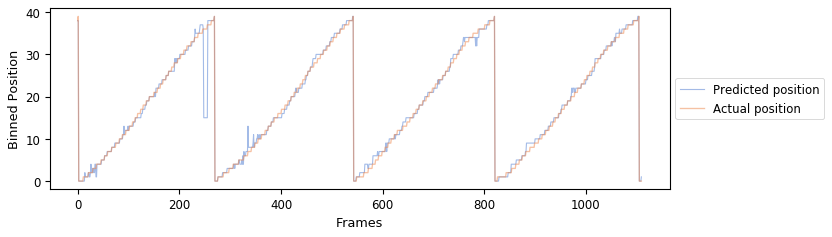

Training with batch size 500.0
Fitting Model
9990/9990 [==============================] - 0s 20us/step

Accuracy of training set: 94.04%
1110/1110 [==============================] - 0s 8us/step

Accuracy of test set:: 54.41%


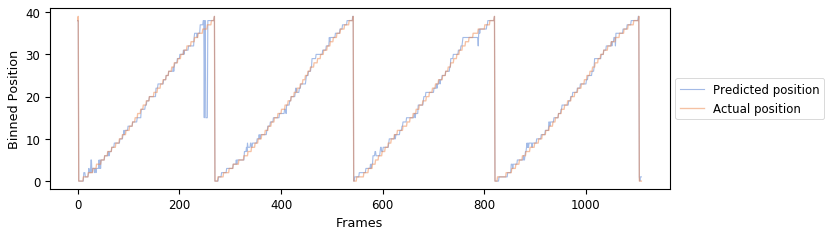

Training with batch size 1000.0
Fitting Model
9990/9990 [==============================] - 0s 33us/step

Accuracy of training set: 89.98%
1110/1110 [==============================] - 0s 8us/step

Accuracy of test set:: 55.14%


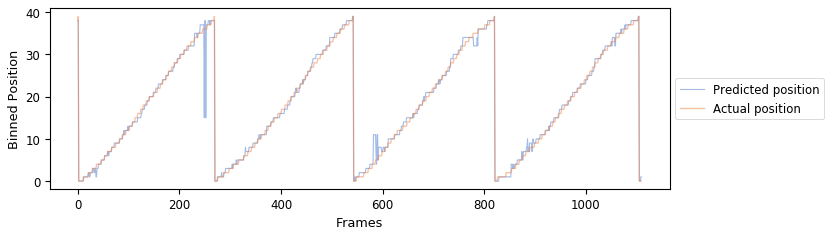

Training with batch size 2000.0
Fitting Model
9990/9990 [==============================] - 0s 35us/step

Accuracy of training set: 84.78%
1110/1110 [==============================] - 0s 7us/step

Accuracy of test set:: 50.81%


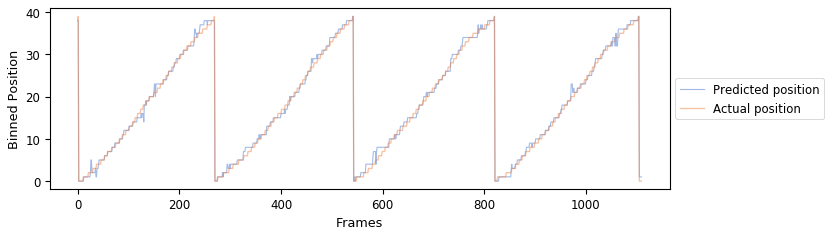

Training with batch size 5000.0
Fitting Model
9990/9990 [==============================] - 0s 21us/step

Accuracy of training set: 74.40%
1110/1110 [==============================] - 0s 6us/step

Accuracy of test set:: 52.97%


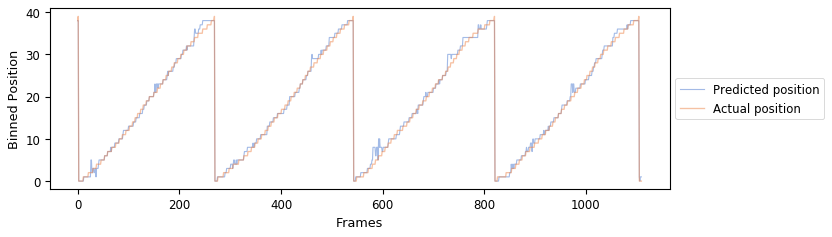

In [16]:
R2_batchsize = []
rho_batchsize = []
for b in batch_sizes:
    print(f'Training with batch size %.1f' %b)
    n = SDNN(dropout=dropout, epochs=epochs, hiddenlayer=1, units=units, batch_size=b, verbose=0)
    densennmodel = n.fit_model(X_train, y_train)
    score, prediction = n.validate_model(densennmodel, X_test, y_test)
    # Print mean correlation and mean R2
    R2_batchsize.append(m.get_R2(np.argmax(y_test, 1), prediction))
    rho_batchsize.append(m.get_rho(np.argmax(y_test, 1), prediction))

In [17]:
R2_batchsize

[0.9738160237780144,
 0.9928886070698585,
 0.9736126650547088,
 0.9819195607824651,
 0.9885379628682294,
 0.9946263997962882,
 0.9942936309763336]

In [18]:
# Save ground truth
np.savez(os.path.join(SaveResults, 'changebatchsize.npz'), R2=R2_batchsize, rho=rho_batchsize, batchsize=batch_sizes)

#### Run different hidden layer units

In [19]:
#Inputs
dropout = 0.1
epochs = 30
hiddenlayerunits = [20, 50, 100, 500, 800, 1000]
batch_sizes = 1000

Training with different units 20.0
Fitting Model
9990/9990 [==============================] - 0s 24us/step

Accuracy of training set: 63.02%
1110/1110 [==============================] - 0s 5us/step

Accuracy of test set:: 44.59%


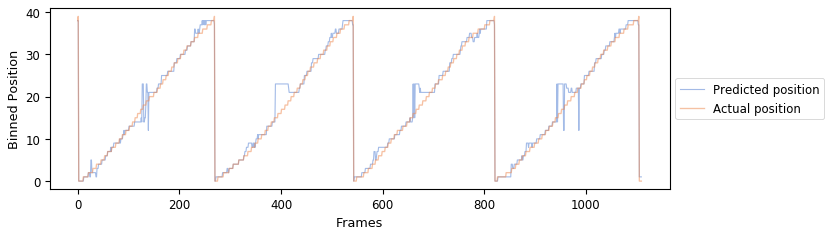

Training with different units 50.0
Fitting Model
9990/9990 [==============================] - 0s 24us/step

Accuracy of training set: 79.14%
1110/1110 [==============================] - 0s 5us/step

Accuracy of test set:: 51.53%


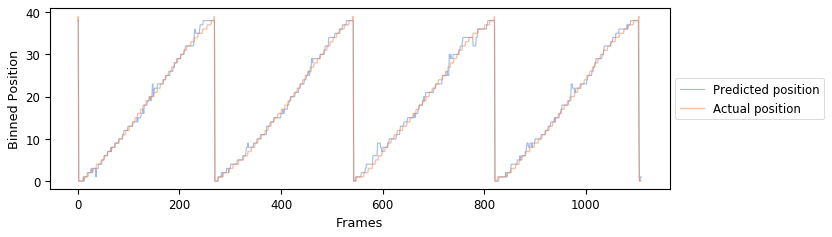

Training with different units 100.0
Fitting Model
9990/9990 [==============================] - 0s 27us/step

Accuracy of training set: 84.26%
1110/1110 [==============================] - 0s 6us/step

Accuracy of test set:: 53.42%


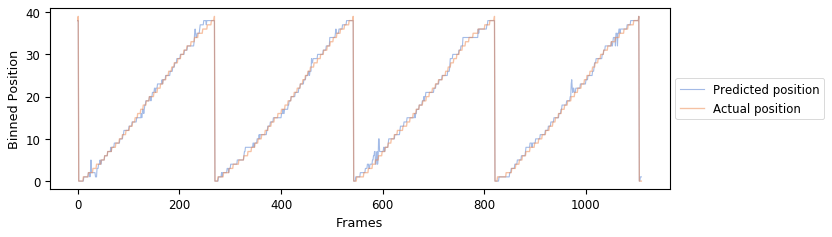

Training with different units 500.0
Fitting Model
9990/9990 [==============================] - 0s 35us/step

Accuracy of training set: 88.92%
1110/1110 [==============================] - 0s 13us/step

Accuracy of test set:: 54.14%


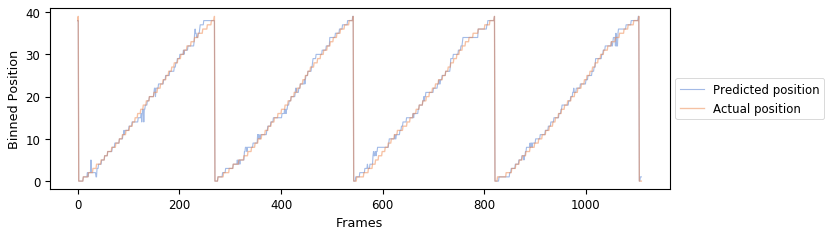

Training with different units 800.0
Fitting Model
9990/9990 [==============================] - 1s 54us/step

Accuracy of training set: 90.08%
1110/1110 [==============================] - 0s 8us/step

Accuracy of test set:: 53.78%


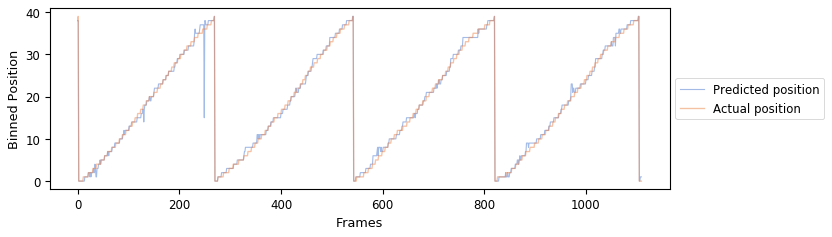

Training with different units 1000.0
Fitting Model
9990/9990 [==============================] - 1s 69us/step

Accuracy of training set: 90.79%
1110/1110 [==============================] - 0s 25us/step

Accuracy of test set:: 54.05%


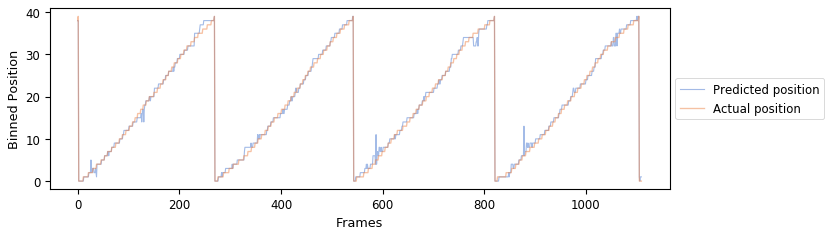

In [20]:
R2_hlunits = []
rho_hlunits = []
for u in hiddenlayerunits:
    print(f'Training with different units %.1f' %u)
    n = SDNN(dropout=dropout, epochs=epochs, hiddenlayer=1, units=[np.size(X, 1), u], batch_size=batch_sizes, verbose=0)
    densennmodel = n.fit_model(X_train, y_train)
    score, prediction = n.validate_model(densennmodel, X_test, y_test)
    # Print mean correlation and mean R2
    R2_hlunits.append(m.get_R2(np.argmax(y_test, 1), prediction))
    rho_hlunits.append(m.get_rho(np.argmax(y_test, 1), prediction))

In [21]:
R2_hlunits

[0.9780310954974397,
 0.9903743537635346,
 0.9954213475328465,
 0.9953350741350805,
 0.9928639575276396,
 0.9947558098929372]

In [22]:
# Save ground truth
np.savez(os.path.join(SaveResults, 'hiddenlayerunits.npz'), R2=R2_hlunits, rho=rho_hlunits, hiddenlayerunits=hiddenlayerunits)

#### Run different input layer units

In [23]:
#Inputs
dropout = 0.1
epochs = 30
inputlayerunits = [20, 50, 316, 500, 800, 1000]
batch_sizes = 1000

Training with different units 20.0
Fitting Model
9990/9990 [==============================] - 0s 43us/step

Accuracy of training set: 76.52%
1110/1110 [==============================] - 0s 5us/step

Accuracy of test set:: 54.23%


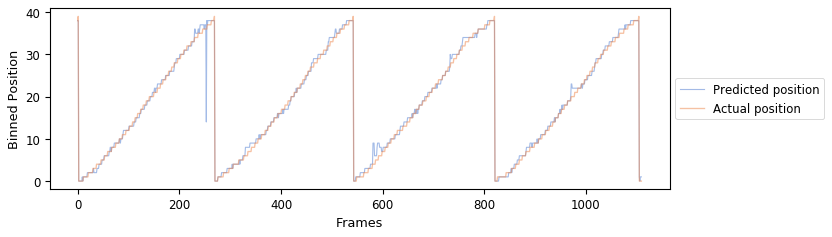

Training with different units 50.0
Fitting Model
9990/9990 [==============================] - 0s 34us/step

Accuracy of training set: 80.79%
1110/1110 [==============================] - 0s 7us/step

Accuracy of test set:: 52.52%


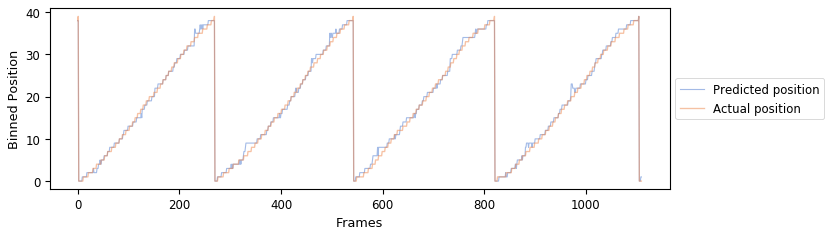

Training with different units 316.0
Fitting Model
9990/9990 [==============================] - 0s 36us/step

Accuracy of training set: 89.08%
1110/1110 [==============================] - 0s 7us/step

Accuracy of test set:: 55.32%


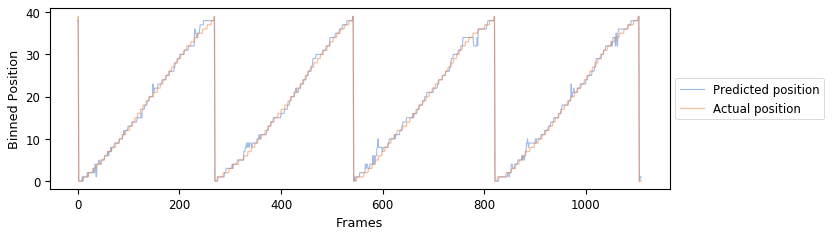

Training with different units 500.0
Fitting Model
9990/9990 [==============================] - 0s 42us/step

Accuracy of training set: 91.30%
1110/1110 [==============================] - 0s 8us/step

Accuracy of test set:: 55.95%


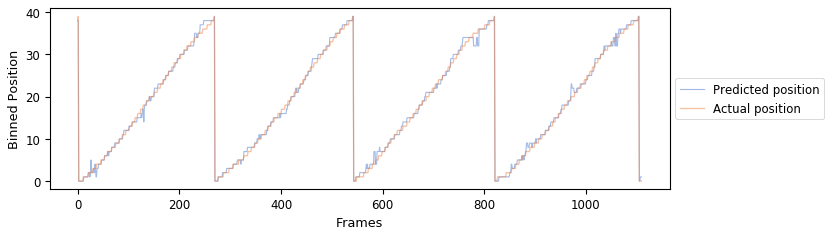

Training with different units 800.0
Fitting Model
9990/9990 [==============================] - 0s 46us/step

Accuracy of training set: 92.68%
1110/1110 [==============================] - 0s 13us/step

Accuracy of test set:: 54.68%


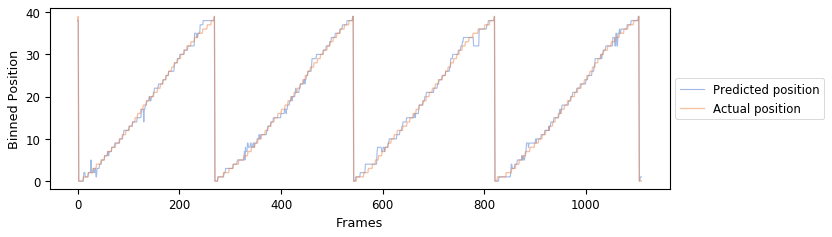

Training with different units 1000.0
Fitting Model
9990/9990 [==============================] - 0s 47us/step

Accuracy of training set: 93.58%
1110/1110 [==============================] - 0s 12us/step

Accuracy of test set:: 54.23%


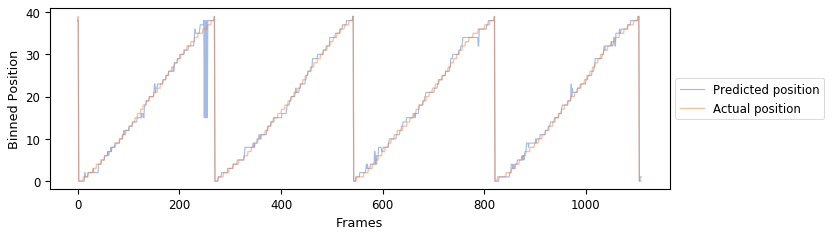

In [24]:
R2_ilunits = []
rho_ilunits = []
for u in inputlayerunits:
    print(f'Training with different units %.1f' %u)
    n = SDNN(dropout=dropout, epochs=epochs, hiddenlayer=1, units=[u, 500], batch_size=batch_sizes, verbose=0)
    densennmodel = n.fit_model(X_train, y_train)
    score, prediction = n.validate_model(densennmodel, X_test, y_test)
    # Print mean correlation and mean R2
    R2_ilunits.append(m.get_R2(np.argmax(y_test, 1), prediction))
    rho_ilunits.append(m.get_rho(np.argmax(y_test, 1), prediction))

In [25]:
R2_ilunits

[0.9921737703455115,
 0.9951625273395485,
 0.994823596134039,
 0.9950947410984465,
 0.9948975447606957,
 0.9842859168354757]

In [26]:
# Save ground truth
np.savez(os.path.join(SaveResults, 'inputlayerunits.npz'), R2=R2_ilunits, rho=rho_ilunits, inputlayerunits=inputlayerunits)

#### Run different epochs

In [27]:
#Inputs
dropout = 0
epochs = [30, 50, 100, 500]
units = [np.size(X, 1), 500]
batch_size = 1000

Training with different epochs 30.0
Fitting Model
9990/9990 [==============================] - 0s 41us/step

Accuracy of training set: 90.26%
1110/1110 [==============================] - 0s 7us/step

Accuracy of test set:: 53.78%


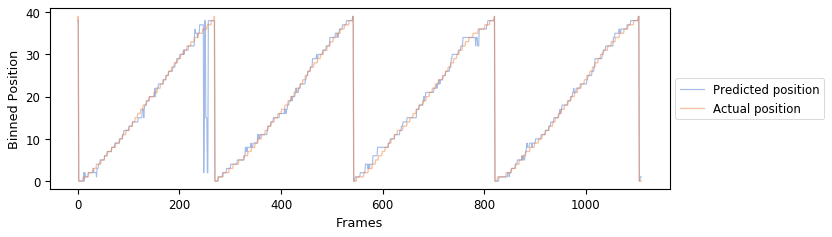

Training with different epochs 50.0
Fitting Model
9990/9990 [==============================] - 0s 43us/step

Accuracy of training set: 94.63%
1110/1110 [==============================] - 0s 7us/step

Accuracy of test set:: 54.59%


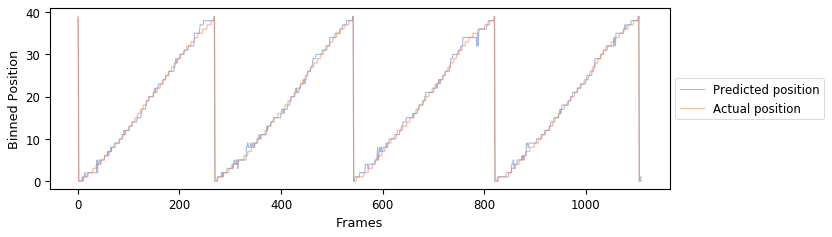

Training with different epochs 100.0
Fitting Model
9990/9990 [==============================] - 0s 44us/step

Accuracy of training set: 98.72%
1110/1110 [==============================] - 0s 11us/step

Accuracy of test set:: 52.61%


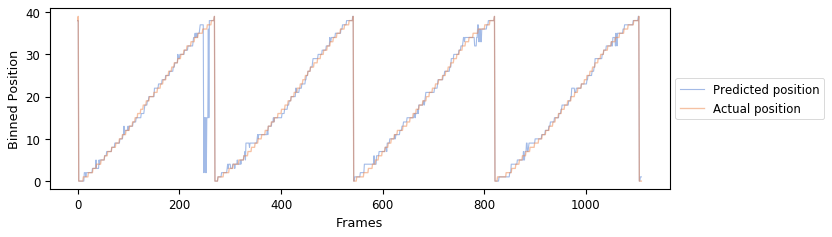

Training with different epochs 500.0
Fitting Model
9990/9990 [==============================] - 1s 82us/step

Accuracy of training set: 99.96%
1110/1110 [==============================] - 0s 7us/step

Accuracy of test set:: 47.84%


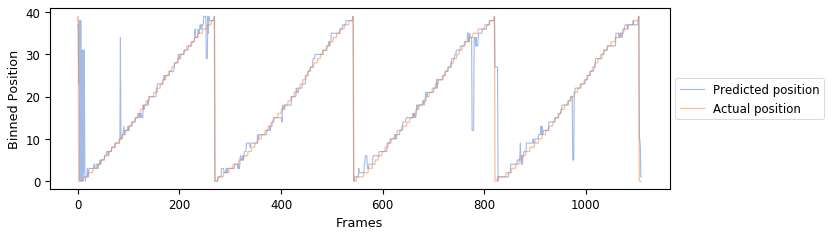

In [28]:
R2_epochs = []
rho_epochs = []
for e in epochs:
    print(f'Training with different epochs %.1f' %e)
    n = SDNN(dropout=dropout, epochs=e, hiddenlayer=1, units=units, batch_size=batch_size, verbose=0)
    densennmodel = n.fit_model(X_train, y_train)
    score, prediction = n.validate_model(densennmodel, X_test, y_test)
    # Print mean correlation and mean R2
    R2_epochs.append(m.get_R2(np.argmax(y_test, 1), prediction))
    rho_epochs.append(m.get_rho(np.argmax(y_test, 1), prediction))

In [29]:
R2_epochs

[0.9622553884773682,
 0.9957479539672464,
 0.9541148771595893,
 0.9066460212316167]

In [30]:
# Save ground truth
np.savez(os.path.join(SaveResults, 'changeepochs.npz'), R2=R2_epochs, rho=rho_epochs, epochs=epochs)

### Final Model

In [31]:
#Model Inputs
dropout = 0
epochs = 30
units = [np.size(X, 1), 500]
batch_size = 1000

In [32]:
n = SDNN(dropout=dropout, epochs=epochs, hiddenlayer=1, units=units, batch_size=batch_size, verbose=1)

Fitting Model
Epoch 1/30
9990/9990 [==============================] - 1s 120us/step - loss: 0.0242 - acc: 0.2238
Epoch 2/30
9990/9990 [==============================] - 0s 13us/step - loss: 0.0193 - acc: 0.4929
Epoch 3/30
9990/9990 [==============================] - 0s 14us/step - loss: 0.0174 - acc: 0.5853
Epoch 4/30
9990/9990 [==============================] - 0s 13us/step - loss: 0.0161 - acc: 0.6391
Epoch 5/30
9990/9990 [==============================] - 0s 15us/step - loss: 0.0151 - acc: 0.6685
Epoch 6/30
9990/9990 [==============================] - 0s 14us/step - loss: 0.0142 - acc: 0.6957
Epoch 7/30
9990/9990 [==============================] - 0s 14us/step - loss: 0.0135 - acc: 0.7211
Epoch 8/30
9990/9990 [==============================] - 0s 16us/step - loss: 0.0129 - acc: 0.7367
Epoch 9/30
9990/9990 [==============================] - 0s 16us/step - loss: 0.0124 - acc: 0.7511
Epoch 10/30
9990/9990 [==============================] - 0s 14us/step - loss: 0.0119 - acc: 0.7669
Epoc

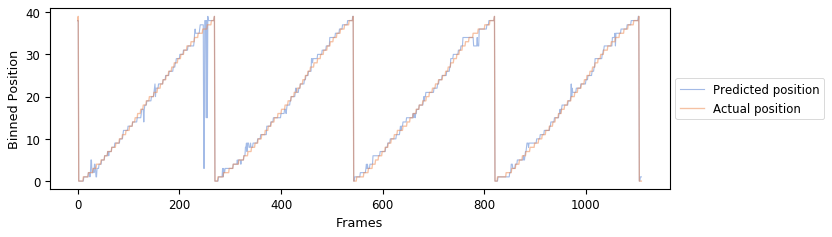

R2: 0.98
rho: 0.99


In [33]:
#Test on data
densennmodel = n.fit_model(X_train, y_train)
score, prediction = n.validate_model(densennmodel, X_test, y_test, plot_figure=1)
R2 = m.get_R2(np.argmax(y_test, 1), prediction)
rho = m.get_rho(np.argmax(y_test, 1), prediction)
print(f'R2: %.2f' %R2)
print(f'rho: %.2f' %rho)

In [34]:
# serialize model to JSON
model_json = densennmodel.to_json()
with open(os.path.join(SaveResults, "Trainandvalidatedmodel.json"), "w") as json_file:
    json_file.write(model_json)
# serialize weights to HDF5
densennmodel.save_weights(os.path.join(SaveResults, "Trainandvalidatedmodel.h5"))

In [35]:
np.savez(os.path.join(SaveResults, 'Trainandvalidatedmodelparams.npz'), 
         X_train=X_train, X_test=X_test, y_train=y_train, y_test=y_test,
        dropout = dropout, epochs = epochs, units = units, batch_size = batch_size, R2=R2, rho=rho)

### K-fold validation of model

In [36]:
from sklearn.model_selection import KFold
from PlotDecodingResults import ModelPredictionPlots

In [37]:
#Define k-fold validation
k = KFold(n_splits=5, random_state=None, shuffle=False)

In [38]:
#Define model
n = SDNN(dropout=dropout, epochs=epochs, hiddenlayer=1, units=units, batch_size=batch_size, verbose=0)

Performing 5-fold validation
Validation 1
(8880, 316) (8880, 40) (2220, 316) (2220, 40)
Fitting Model
8880/8880 [==============================] - 1s 56us/step

Accuracy of training set: 90.23%
2220/2220 [==============================] - 0s 6us/step

Accuracy of test set:: 50.27%


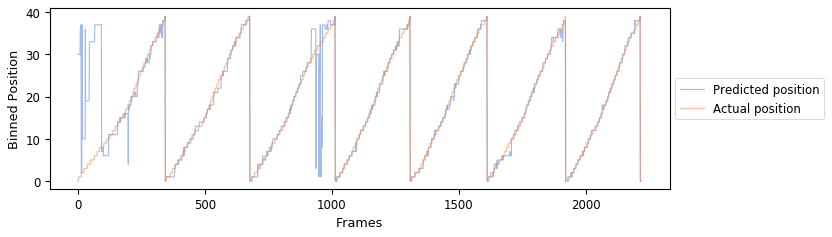

Validation 2
(8880, 316) (8880, 40) (2220, 316) (2220, 40)
Fitting Model
8880/8880 [==============================] - 1s 57us/step

Accuracy of training set: 90.15%
2220/2220 [==============================] - 0s 6us/step

Accuracy of test set:: 49.50%


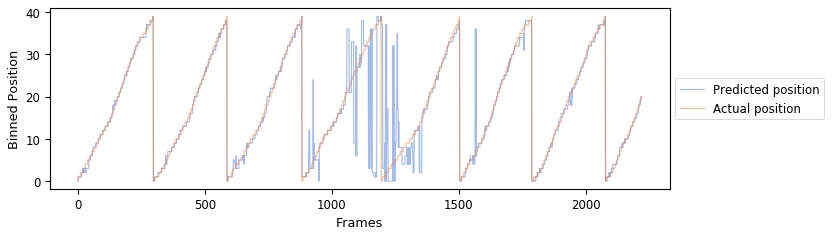

Validation 3
(8880, 316) (8880, 40) (2220, 316) (2220, 40)
Fitting Model
8880/8880 [==============================] - 1s 103us/step

Accuracy of training set: 89.89%
2220/2220 [==============================] - 0s 6us/step

Accuracy of test set:: 57.48%


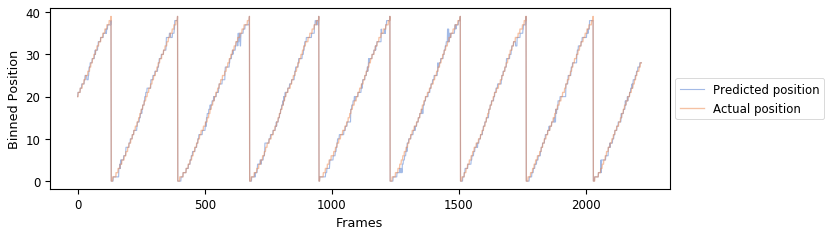

Validation 4
(8880, 316) (8880, 40) (2220, 316) (2220, 40)
Fitting Model
8880/8880 [==============================] - 1s 57us/step

Accuracy of training set: 89.81%
2220/2220 [==============================] - 0s 6us/step

Accuracy of test set:: 55.99%


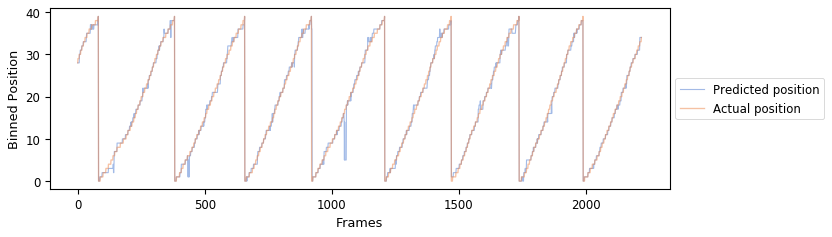

Validation 5
(8880, 316) (8880, 40) (2220, 316) (2220, 40)
Fitting Model
8880/8880 [==============================] - 1s 60us/step

Accuracy of training set: 90.30%
2220/2220 [==============================] - 0s 7us/step

Accuracy of test set:: 48.92%


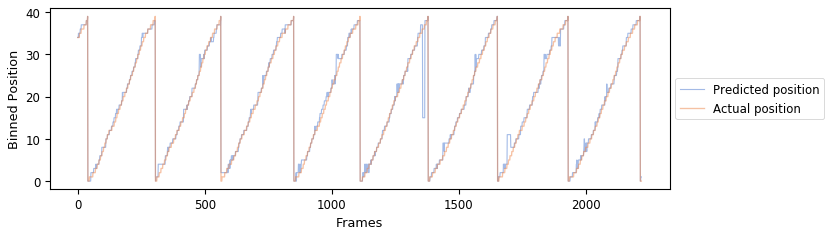

In [39]:
print(f'Performing %d-fold validation' % k.n_splits)
count_cv = 1
dnncv_dataframe = pd.DataFrame(
    columns=['CVIndex', 'ModelAccuracy', 'Y_test', 'Y_predict', 'Y_diff'])
for train_index, test_index in k.split(X):
    print(f'Validation %d' % count_cv)
    xcv_train, xcv_test = X[train_index], X[test_index]
    ycv_train, ycv_test = y_cat[train_index], y_cat[test_index]

    print(np.shape(xcv_train), np.shape(ycv_train),
          np.shape(xcv_test), np.shape(ycv_test))
    cvsdensennmodel = n.fit_model(xcv_train, ycv_train)

    # evaluate the model and save evalautions
    scores, ycv_predict = n.validate_model(cvsdensennmodel, xcv_test, ycv_test)
    dnncv_dataframe = dnncv_dataframe.append({'CVIndex': count_cv,
                                              'ModelAccuracy': scores,
                                              'Y_test': np.argmax(ycv_test, 1),
                                              'Y_predict': ycv_predict,
                                              'Y_diff': np.abs(np.argmax(ycv_test, 1)-ycv_predict)}, ignore_index=True)
    count_cv += 1

Validation functions
R2: 0.90 +/- 0.101345
Rho: 0.95 +/- 0.049236


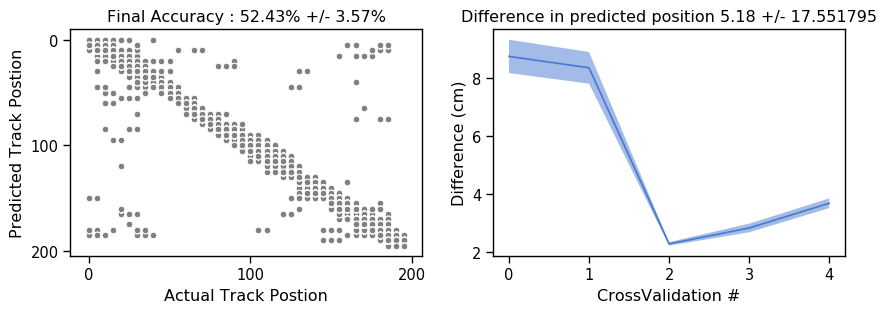

In [40]:
m = ModelPredictionPlots()
m.PlotCVResult(cv_dataframe=dnncv_dataframe, trackbins=trackbins, numsplits=k.n_splits)

In [41]:
#Save CSV
dnncv_dataframe.to_pickle(os.path.join(SaveResults, f'%d-foldevaluation.pkl'%k.n_splits))

### Error rate versus cells

#### Leave one cell out 

In [42]:
X_lo_train, X_lo_test, y_lo_train, y_lo_test = train_test_split(X, y_cat, test_size=0.10, random_state=None, shuffle=False)
print(np.shape(X_lo_train), np.shape(X_lo_test), np.shape(y_lo_train), np.shape(y_lo_test))

(9990, 316) (1110, 316) (9990, 40) (1110, 40)


In [43]:
densennmodel = n.fit_model(X_lo_train, y_lo_train)

Fitting Model
9990/9990 [==============================] - 1s 54us/step

Accuracy of training set: 90.25%


Training without cell 0
1110/1110 [==============================] - 0s 8us/step

Accuracy of test set:: 53.33%


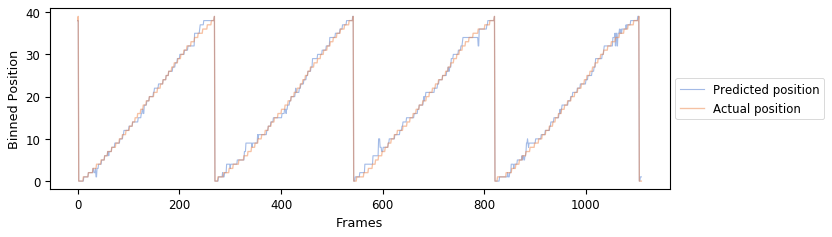

Training without cell 1
1110/1110 [==============================] - 0s 12us/step

Accuracy of test set:: 53.33%


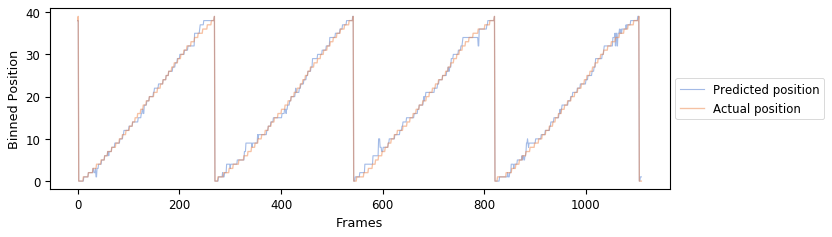

Training without cell 2
1110/1110 [==============================] - 0s 17us/step

Accuracy of test set:: 53.33%


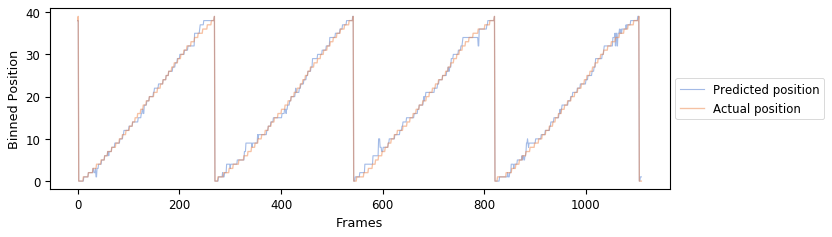

Training without cell 3
1110/1110 [==============================] - 0s 12us/step

Accuracy of test set:: 53.33%


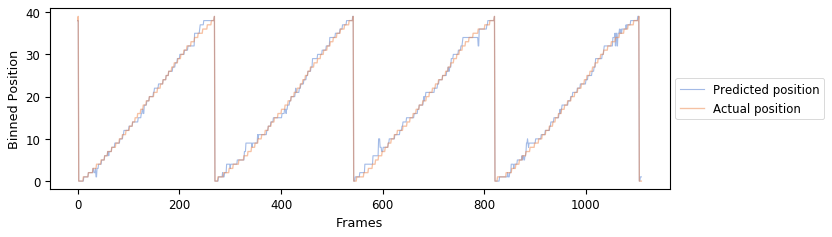

Training without cell 4
1110/1110 [==============================] - 0s 9us/step

Accuracy of test set:: 53.33%


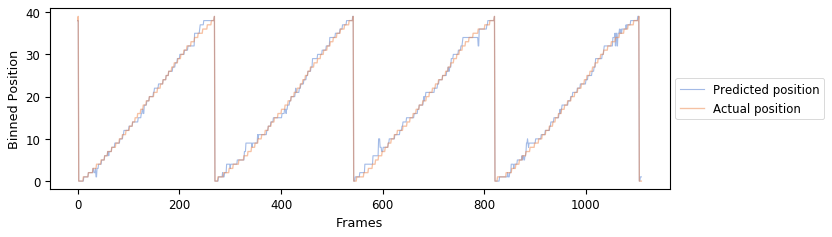

Training without cell 5
1110/1110 [==============================] - 0s 8us/step

Accuracy of test set:: 53.42%


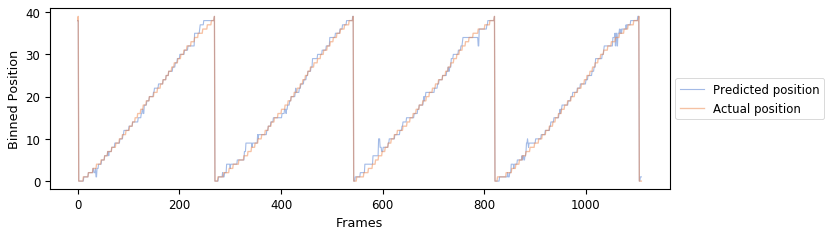

Training without cell 6
1110/1110 [==============================] - 0s 12us/step

Accuracy of test set:: 53.33%


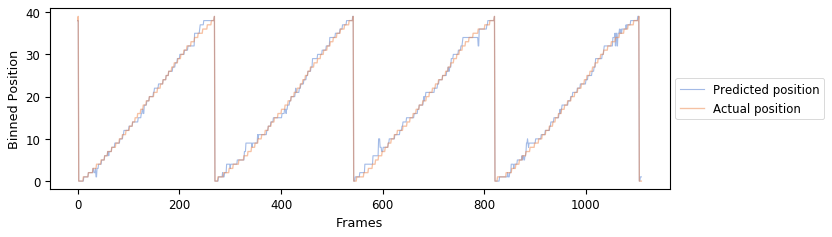

Training without cell 7
1110/1110 [==============================] - 0s 15us/step

Accuracy of test set:: 53.33%


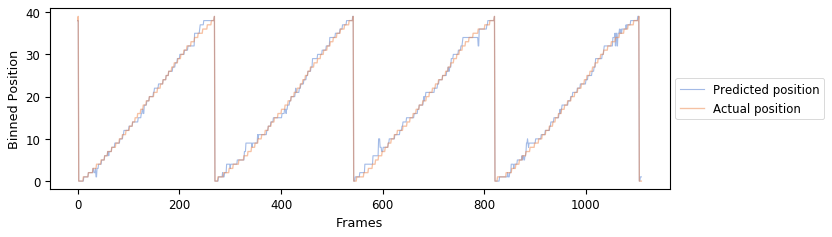

Training without cell 8
1110/1110 [==============================] - 0s 14us/step

Accuracy of test set:: 53.33%


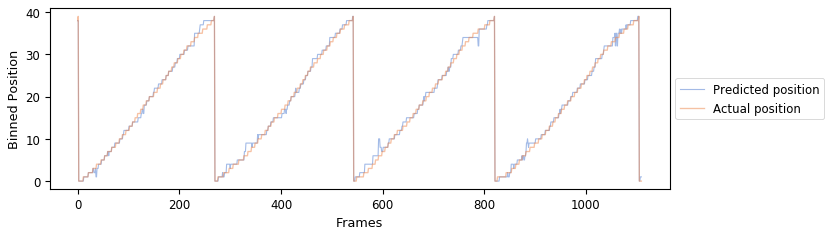

Training without cell 9
1110/1110 [==============================] - 0s 13us/step

Accuracy of test set:: 53.69%


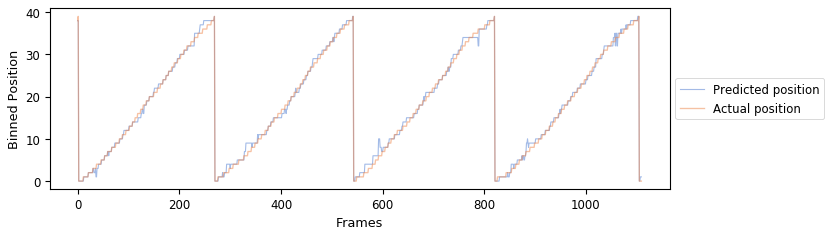

Training without cell 10
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 53.33%


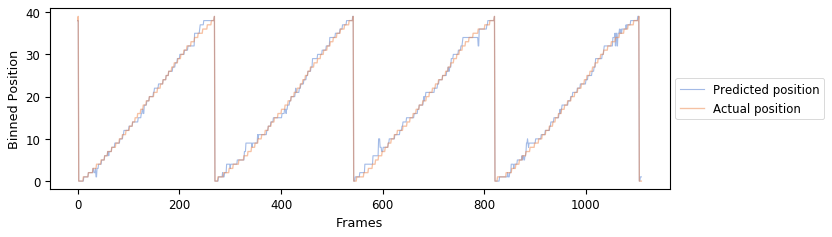

Training without cell 11
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 53.33%


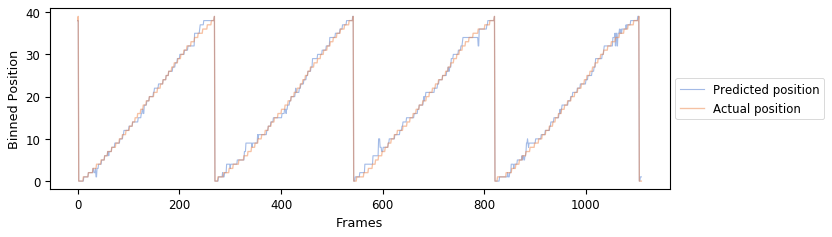

Training without cell 12
1110/1110 [==============================] - 0s 7us/step

Accuracy of test set:: 53.33%


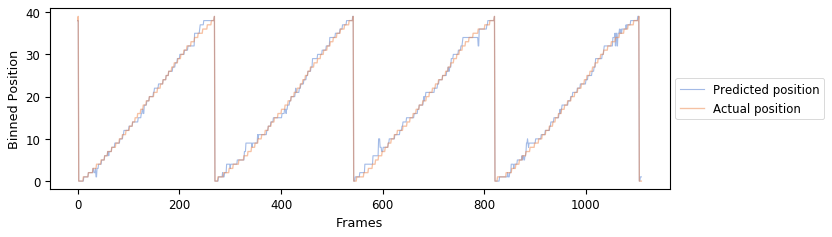

Training without cell 13
1110/1110 [==============================] - 0s 12us/step

Accuracy of test set:: 53.33%


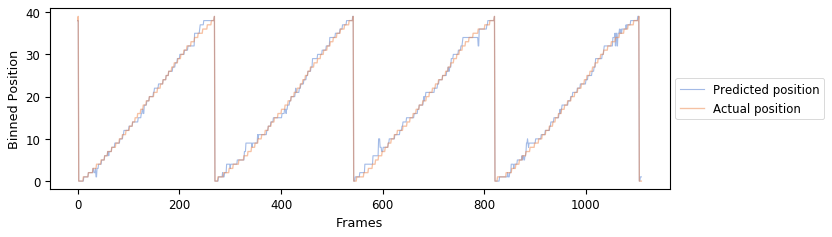

Training without cell 14
1110/1110 [==============================] - 0s 9us/step

Accuracy of test set:: 53.60%


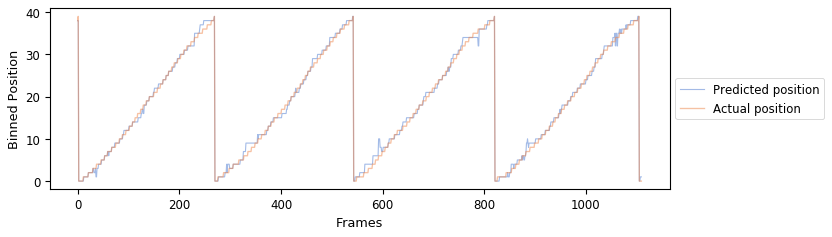

Training without cell 15
1110/1110 [==============================] - 0s 8us/step

Accuracy of test set:: 53.42%


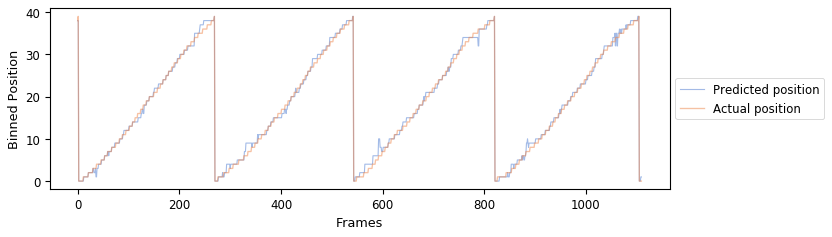

Training without cell 16
1110/1110 [==============================] - 0s 8us/step

Accuracy of test set:: 53.78%


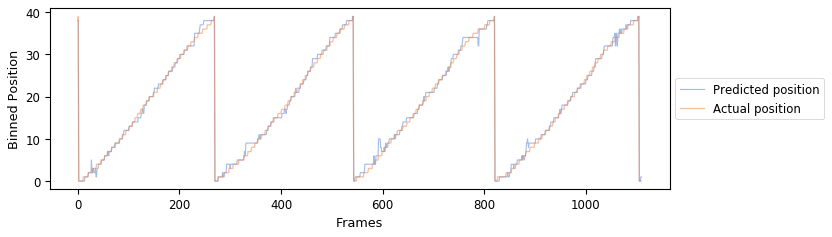

Training without cell 17
1110/1110 [==============================] - 0s 9us/step

Accuracy of test set:: 52.61%


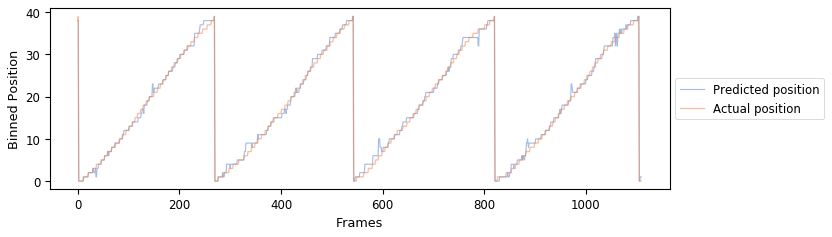

Training without cell 18
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 53.24%


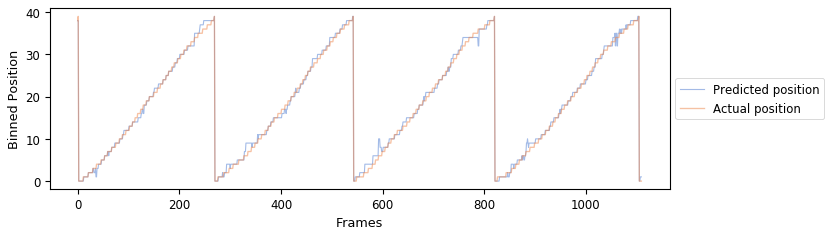

Training without cell 19
1110/1110 [==============================] - 0s 13us/step

Accuracy of test set:: 53.33%


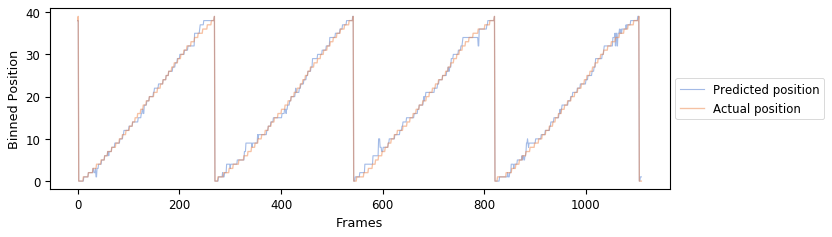

Training without cell 20
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 53.33%


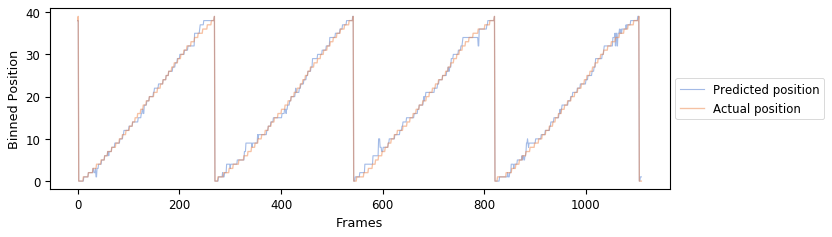

Training without cell 21
1110/1110 [==============================] - 0s 12us/step

Accuracy of test set:: 53.33%


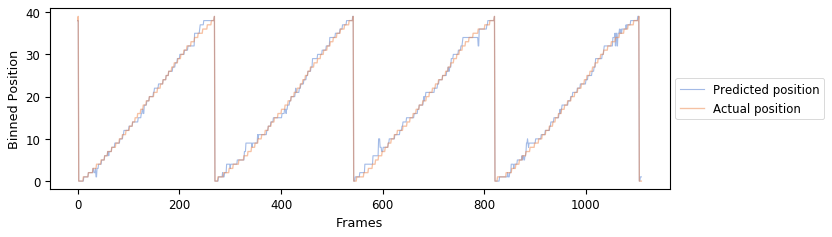

Training without cell 22
1110/1110 [==============================] - 0s 8us/step

Accuracy of test set:: 53.33%


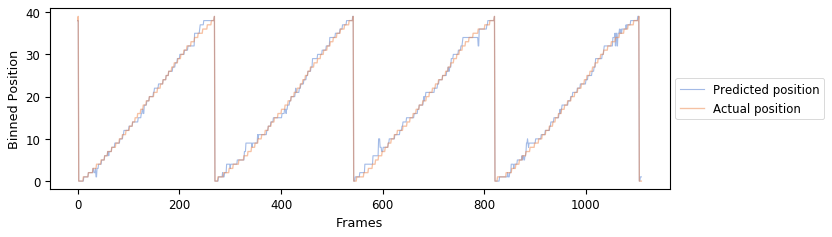

Training without cell 23
1110/1110 [==============================] - 0s 17us/step

Accuracy of test set:: 53.33%


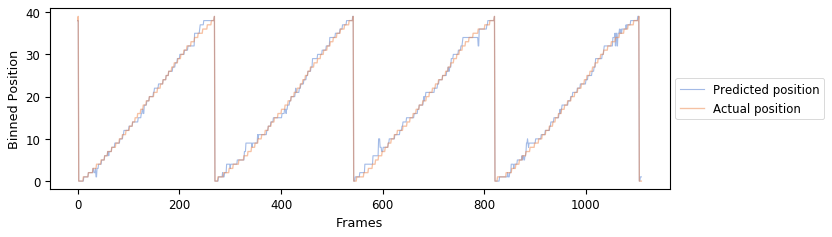

Training without cell 24
1110/1110 [==============================] - 0s 11us/step

Accuracy of test set:: 53.33%


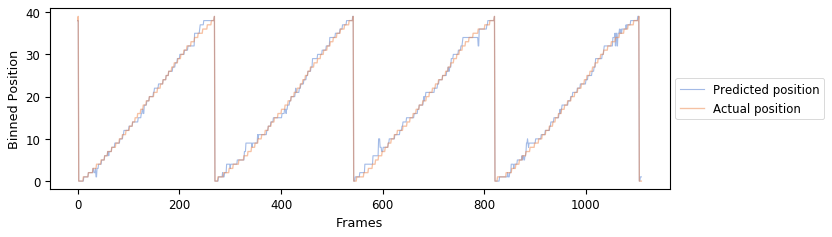

Training without cell 25
1110/1110 [==============================] - 0s 11us/step

Accuracy of test set:: 53.33%


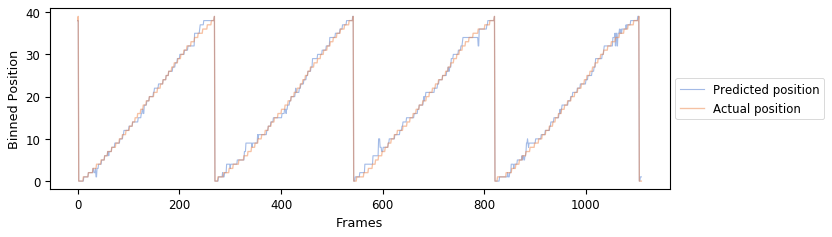

Training without cell 26
1110/1110 [==============================] - 0s 21us/step

Accuracy of test set:: 53.33%


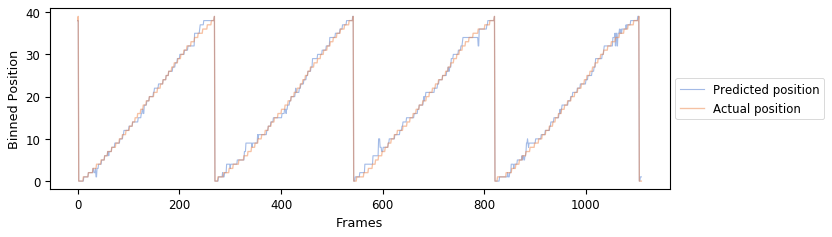

Training without cell 27
1110/1110 [==============================] - 0s 9us/step

Accuracy of test set:: 53.33%


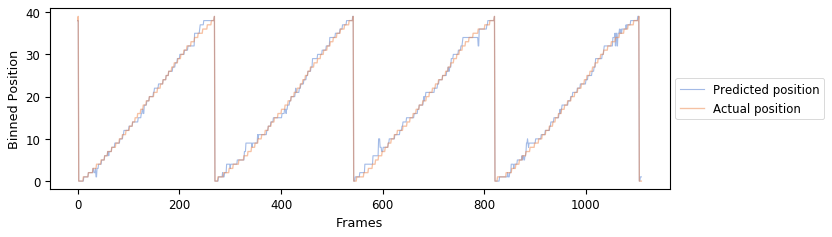

Training without cell 28
1110/1110 [==============================] - 0s 9us/step

Accuracy of test set:: 53.33%


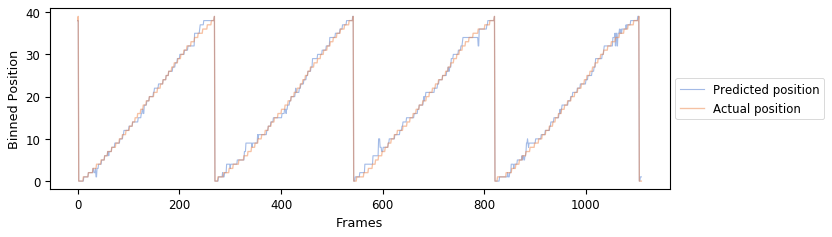

Training without cell 29
1110/1110 [==============================] - 0s 13us/step

Accuracy of test set:: 53.33%


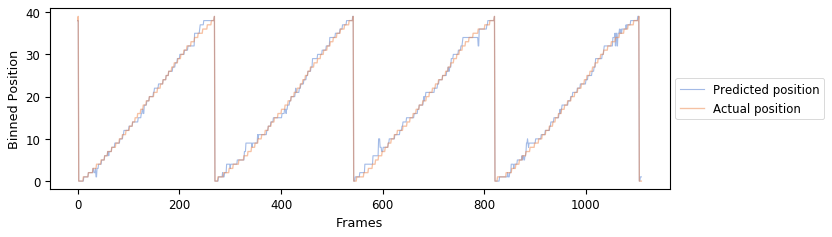

Training without cell 30
1110/1110 [==============================] - 0s 11us/step

Accuracy of test set:: 53.87%


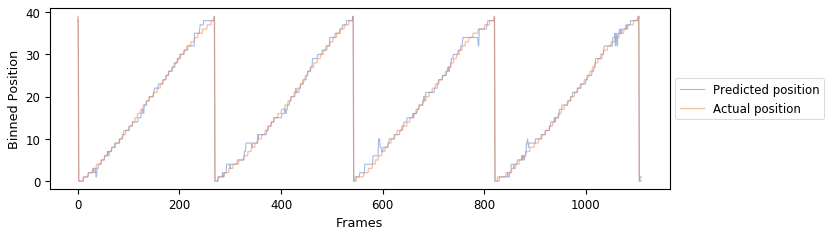

Training without cell 31
1110/1110 [==============================] - 0s 14us/step

Accuracy of test set:: 52.61%


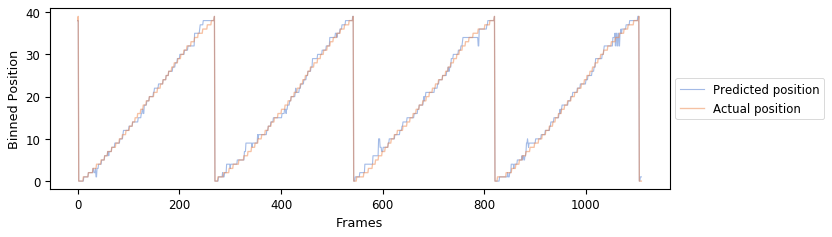

Training without cell 32
1110/1110 [==============================] - 0s 11us/step

Accuracy of test set:: 53.33%


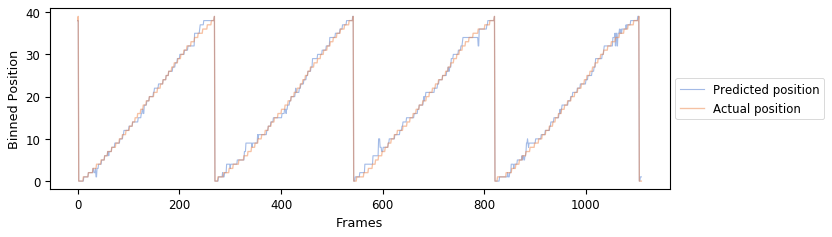

Training without cell 33
1110/1110 [==============================] - 0s 20us/step

Accuracy of test set:: 53.33%


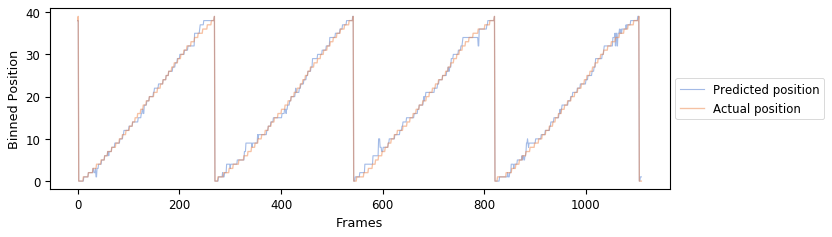

Training without cell 34
1110/1110 [==============================] - 0s 22us/step

Accuracy of test set:: 53.33%


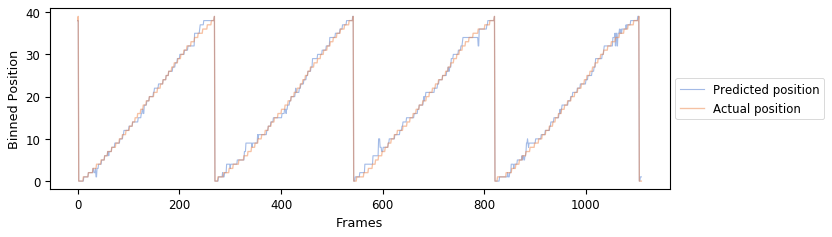

Training without cell 35
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 53.33%


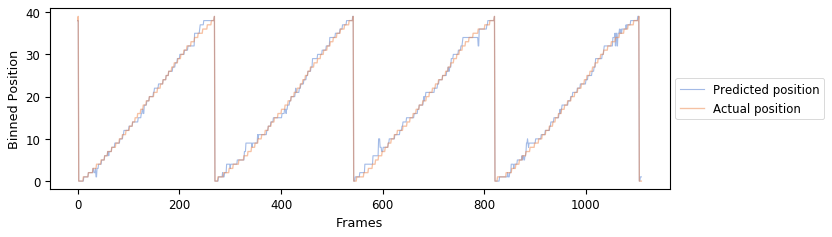

Training without cell 36
1110/1110 [==============================] - 0s 11us/step

Accuracy of test set:: 52.79%


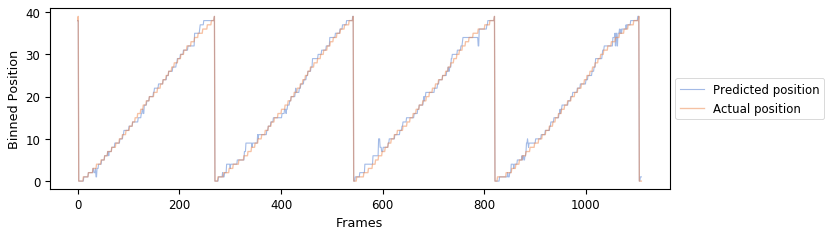

Training without cell 37
1110/1110 [==============================] - 0s 12us/step

Accuracy of test set:: 53.33%


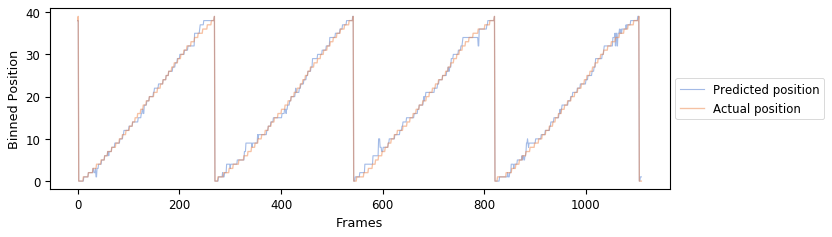

Training without cell 38
1110/1110 [==============================] - 0s 13us/step

Accuracy of test set:: 53.33%


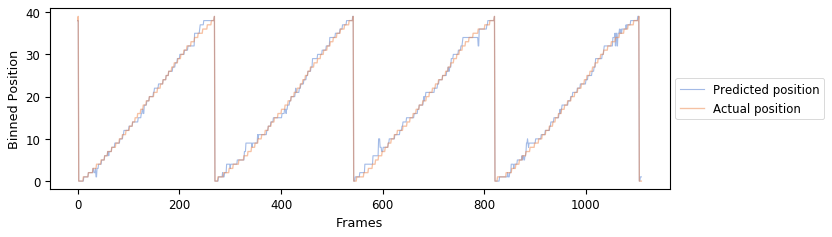

Training without cell 39
1110/1110 [==============================] - 0s 11us/step

Accuracy of test set:: 53.33%


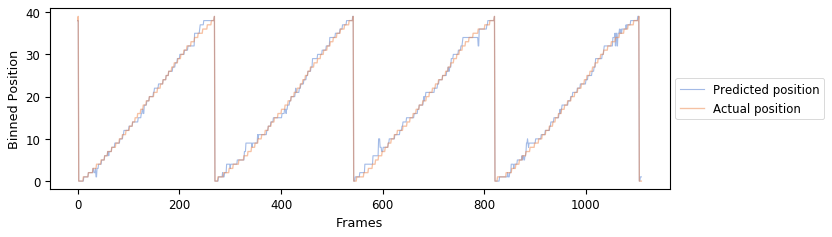

Training without cell 40
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 52.88%


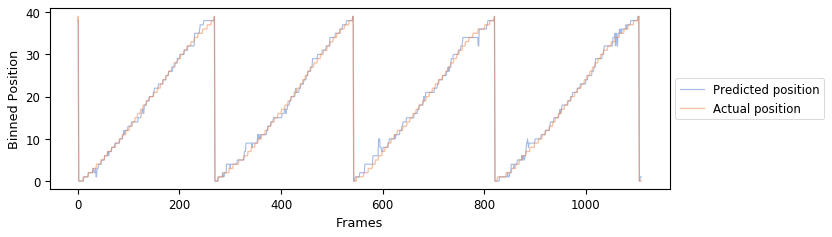

Training without cell 41
1110/1110 [==============================] - 0s 8us/step

Accuracy of test set:: 51.62%


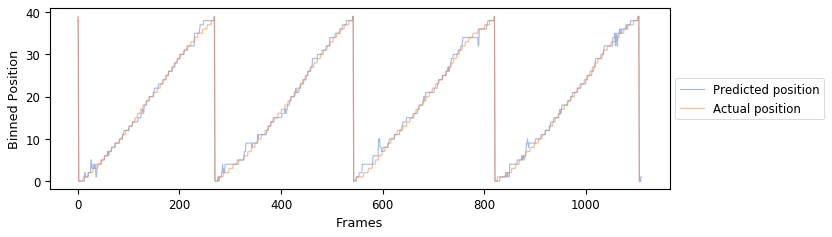

Training without cell 42
1110/1110 [==============================] - 0s 15us/step

Accuracy of test set:: 53.15%


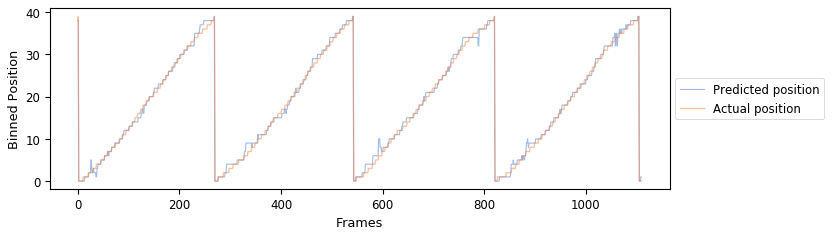

Training without cell 43
1110/1110 [==============================] - 0s 12us/step

Accuracy of test set:: 53.33%


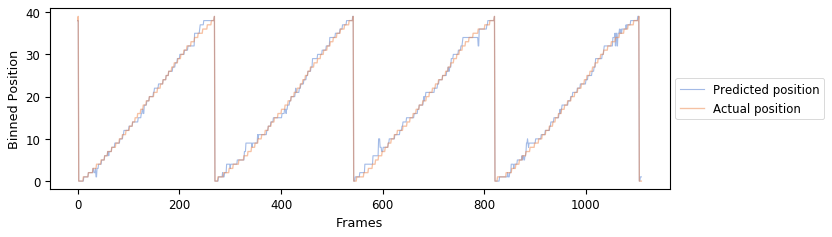

Training without cell 44
1110/1110 [==============================] - 0s 13us/step

Accuracy of test set:: 52.61%


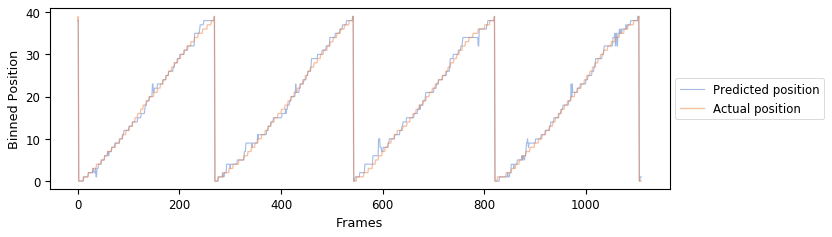

Training without cell 45
1110/1110 [==============================] - 0s 35us/step

Accuracy of test set:: 53.33%


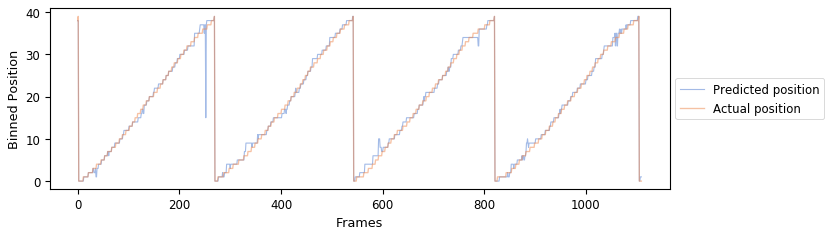

Training without cell 46
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 53.96%


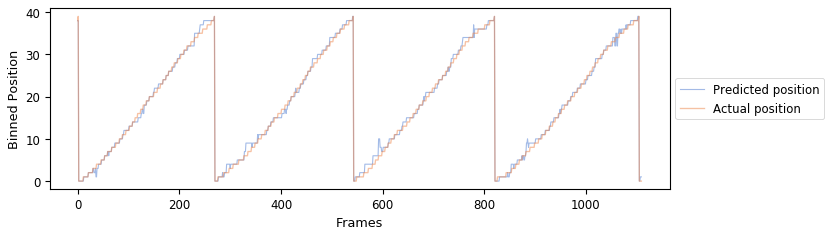

Training without cell 47
1110/1110 [==============================] - 0s 9us/step

Accuracy of test set:: 53.33%


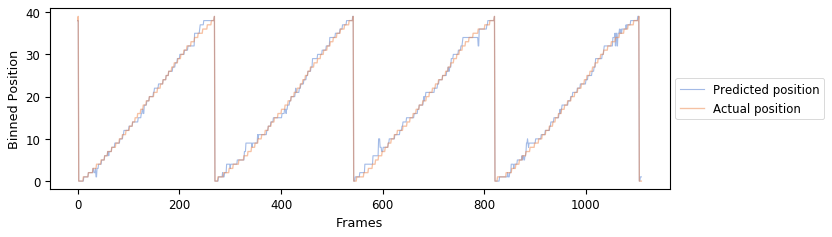

Training without cell 48
1110/1110 [==============================] - 0s 12us/step

Accuracy of test set:: 53.06%


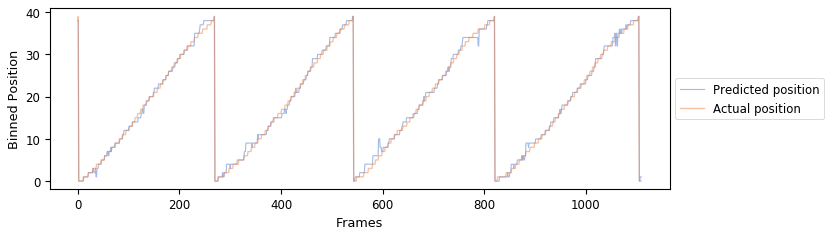

Training without cell 49
1110/1110 [==============================] - 0s 11us/step

Accuracy of test set:: 53.33%


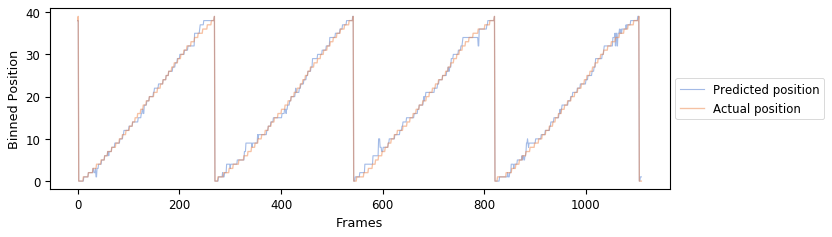

Training without cell 50
1110/1110 [==============================] - 0s 24us/step

Accuracy of test set:: 53.42%


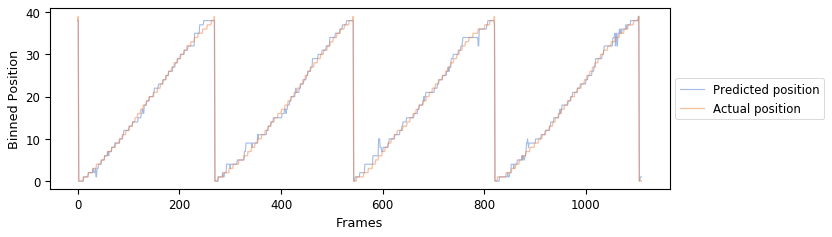

Training without cell 51
1110/1110 [==============================] - 0s 9us/step

Accuracy of test set:: 53.24%


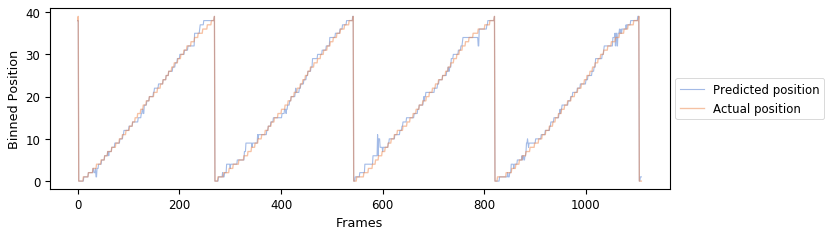

Training without cell 52
1110/1110 [==============================] - 0s 12us/step

Accuracy of test set:: 53.33%


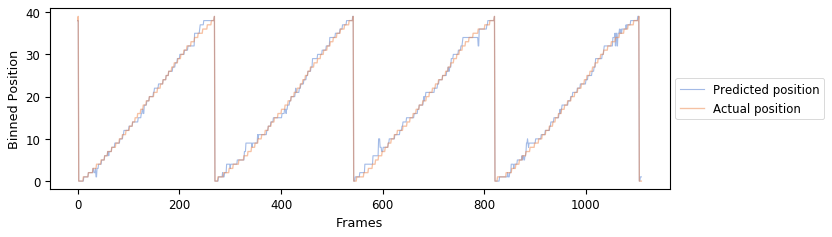

Training without cell 53
1110/1110 [==============================] - 0s 9us/step

Accuracy of test set:: 51.89%


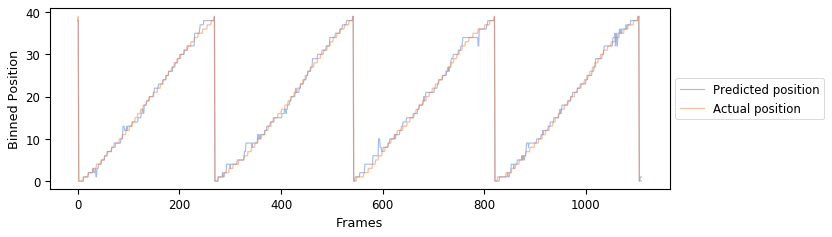

Training without cell 54
1110/1110 [==============================] - 0s 8us/step

Accuracy of test set:: 53.60%


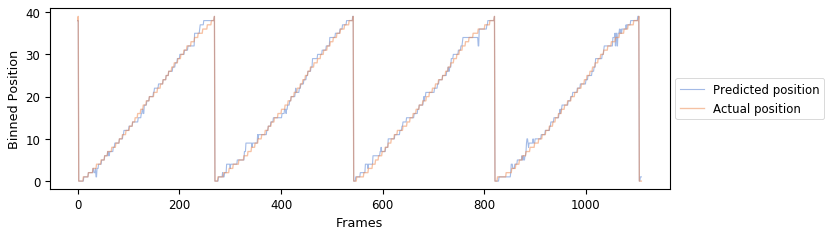

Training without cell 55
1110/1110 [==============================] - 0s 20us/step

Accuracy of test set:: 52.34%


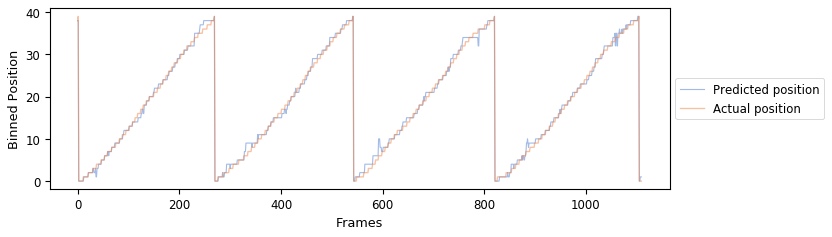

Training without cell 56
1110/1110 [==============================] - 0s 16us/step

Accuracy of test set:: 52.79%


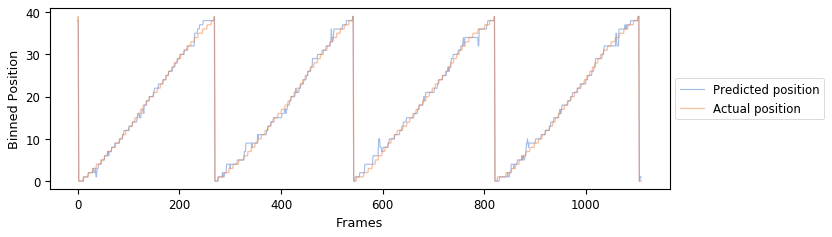

Training without cell 57
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 53.24%


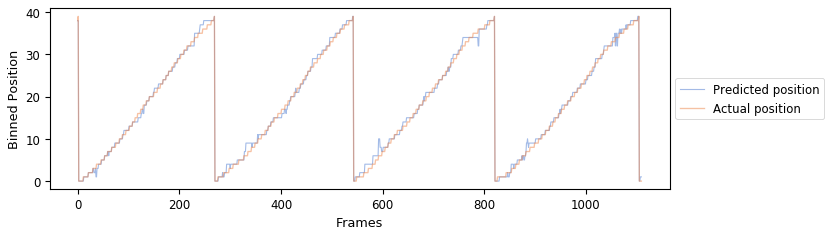

Training without cell 58
1110/1110 [==============================] - 0s 11us/step

Accuracy of test set:: 53.24%


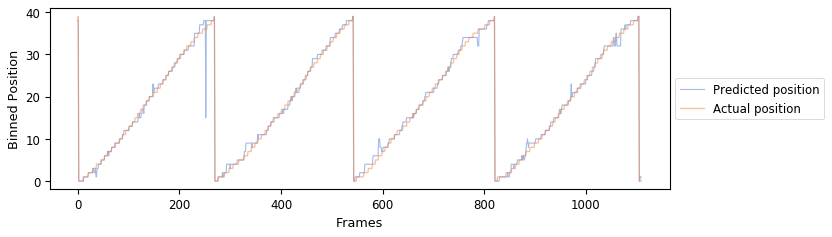

Training without cell 59
1110/1110 [==============================] - 0s 12us/step

Accuracy of test set:: 53.33%


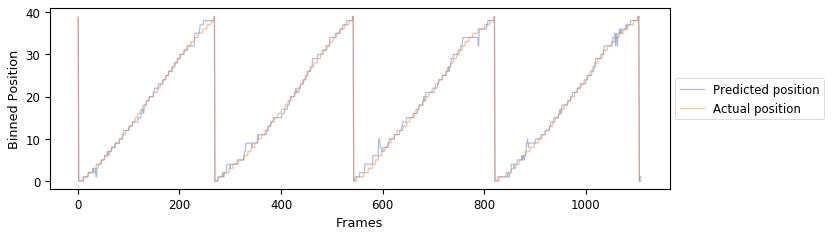

Training without cell 60
1110/1110 [==============================] - 0s 9us/step

Accuracy of test set:: 53.33%


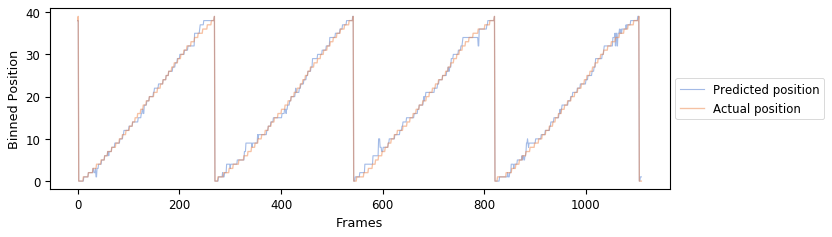

Training without cell 61
1110/1110 [==============================] - 0s 13us/step

Accuracy of test set:: 53.33%


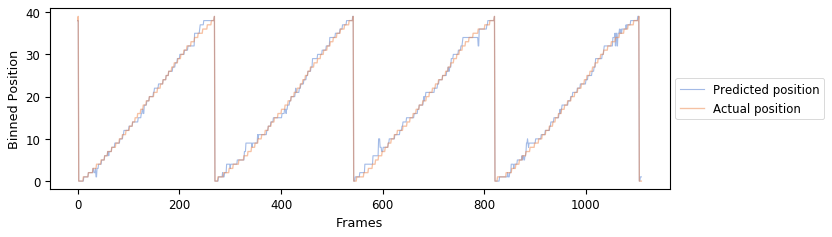

Training without cell 62
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 53.15%


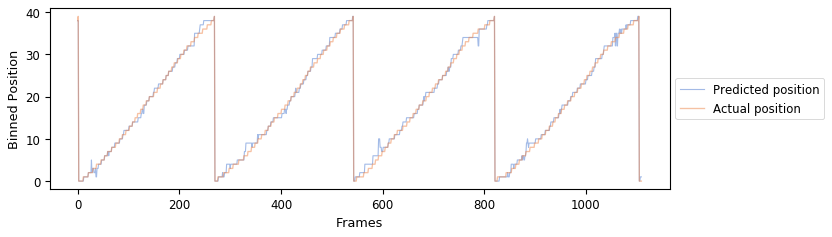

Training without cell 63
1110/1110 [==============================] - 0s 12us/step

Accuracy of test set:: 53.33%


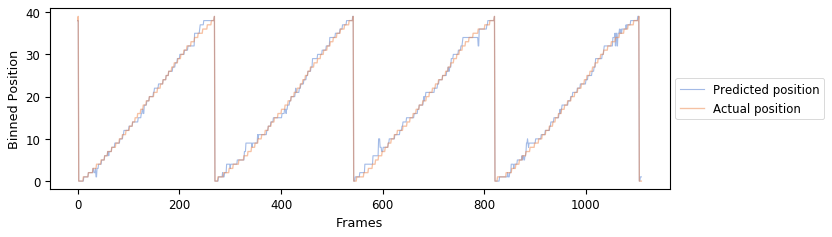

Training without cell 64
1110/1110 [==============================] - 0s 12us/step

Accuracy of test set:: 53.78%


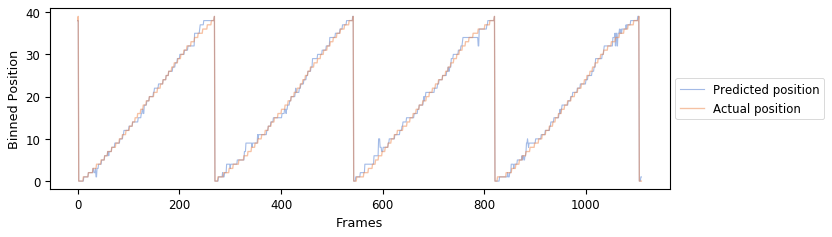

Training without cell 65
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 53.33%


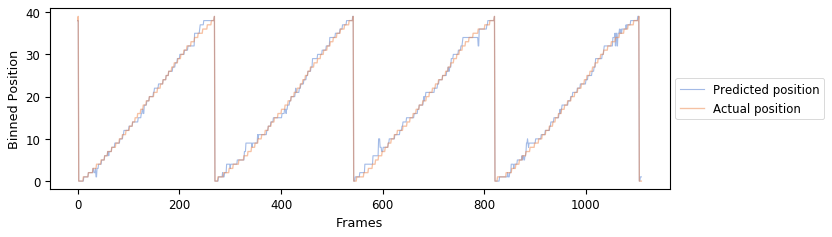

Training without cell 66
1110/1110 [==============================] - 0s 11us/step

Accuracy of test set:: 53.33%


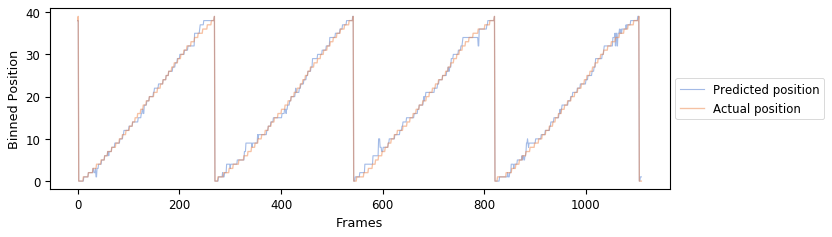

Training without cell 67
1110/1110 [==============================] - 0s 14us/step

Accuracy of test set:: 53.33%


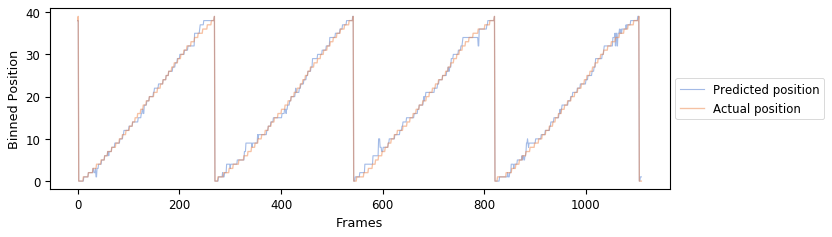

Training without cell 68
1110/1110 [==============================] - 0s 13us/step

Accuracy of test set:: 53.33%


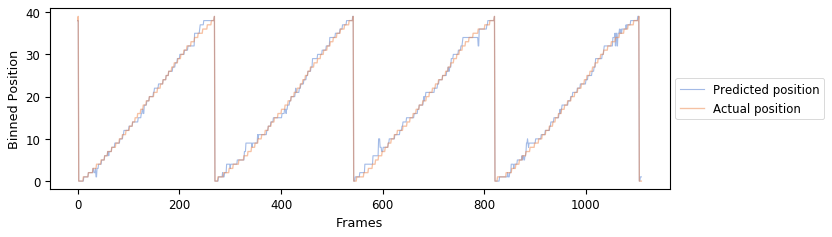

Training without cell 69
1110/1110 [==============================] - 0s 23us/step

Accuracy of test set:: 53.33%


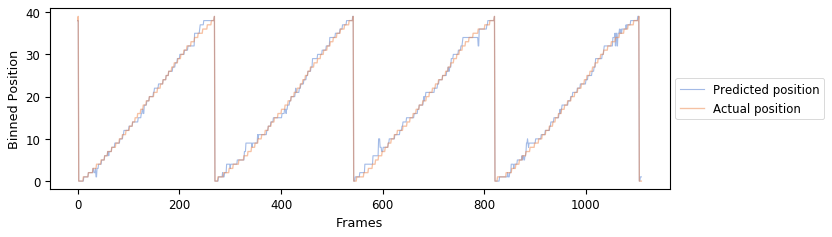

Training without cell 70
1110/1110 [==============================] - 0s 21us/step

Accuracy of test set:: 53.15%


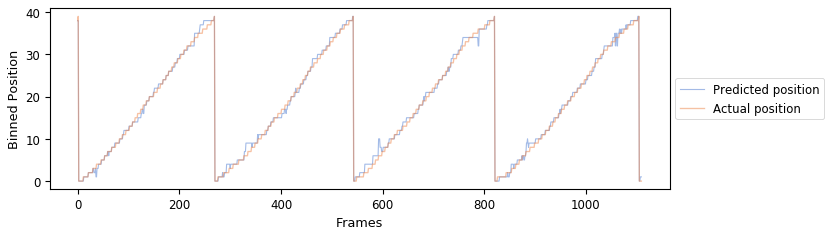

Training without cell 71
1110/1110 [==============================] - 0s 16us/step

Accuracy of test set:: 53.24%


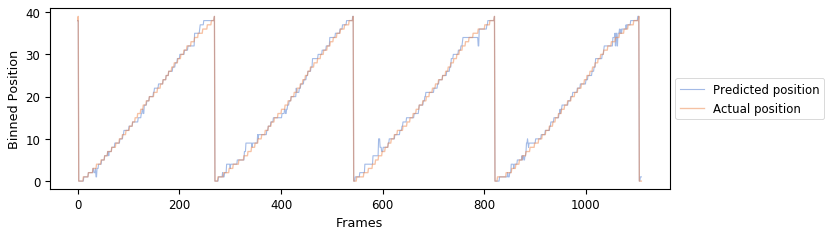

Training without cell 72
1110/1110 [==============================] - 0s 15us/step

Accuracy of test set:: 53.33%


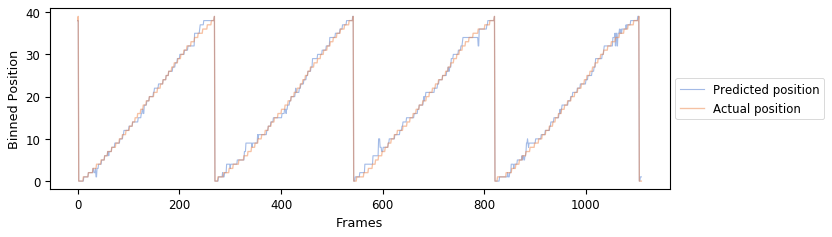

Training without cell 73
1110/1110 [==============================] - 0s 13us/step

Accuracy of test set:: 53.69%


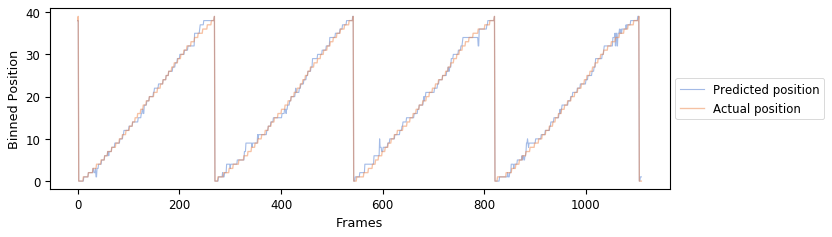

Training without cell 74
1110/1110 [==============================] - 0s 11us/step

Accuracy of test set:: 53.24%


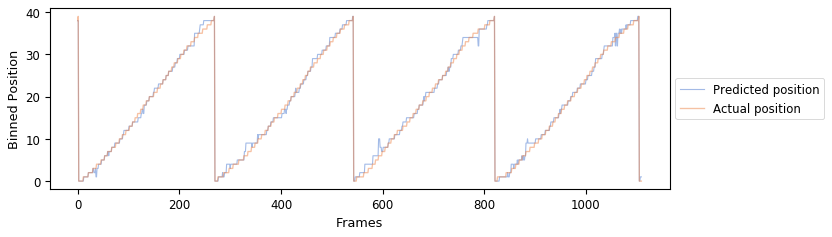

Training without cell 75
1110/1110 [==============================] - 0s 18us/step

Accuracy of test set:: 53.33%


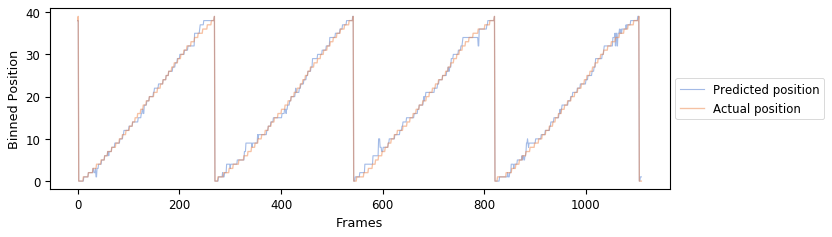

Training without cell 76
1110/1110 [==============================] - 0s 13us/step

Accuracy of test set:: 53.15%


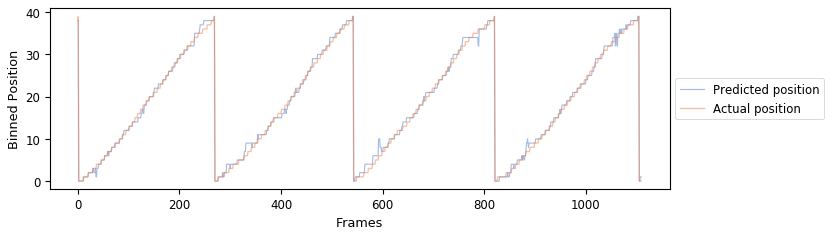

Training without cell 77
1110/1110 [==============================] - 0s 17us/step

Accuracy of test set:: 53.33%


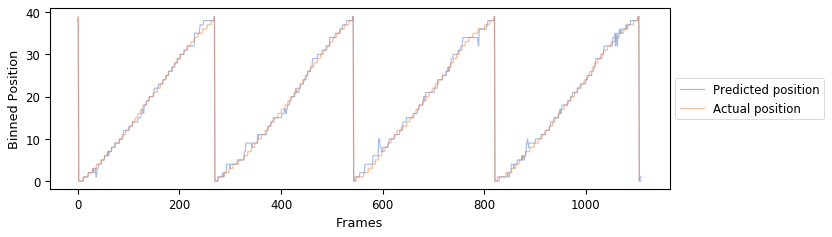

Training without cell 78
1110/1110 [==============================] - 0s 9us/step

Accuracy of test set:: 53.24%


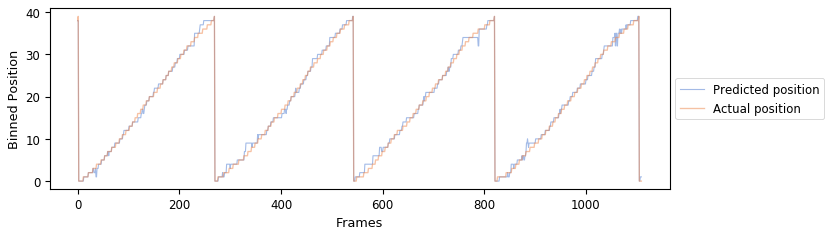

Training without cell 79
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 52.70%


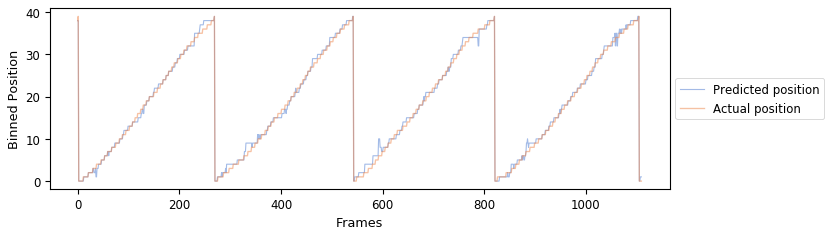

Training without cell 80
1110/1110 [==============================] - 0s 9us/step

Accuracy of test set:: 53.33%


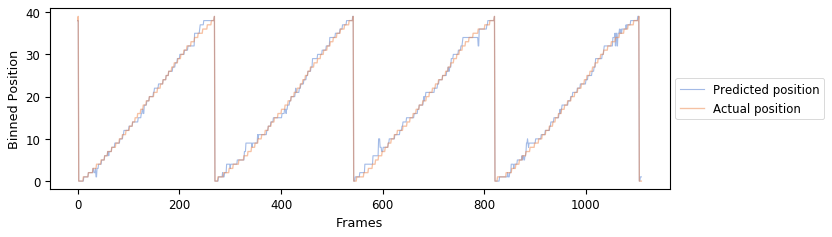

Training without cell 81
1110/1110 [==============================] - 0s 9us/step

Accuracy of test set:: 53.33%


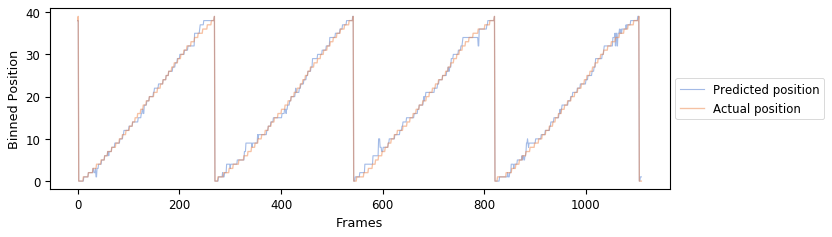

Training without cell 82
1110/1110 [==============================] - 0s 20us/step

Accuracy of test set:: 52.16%


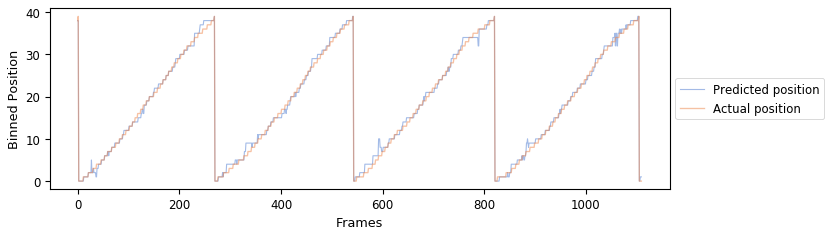

Training without cell 83
1110/1110 [==============================] - 0s 22us/step

Accuracy of test set:: 55.05%


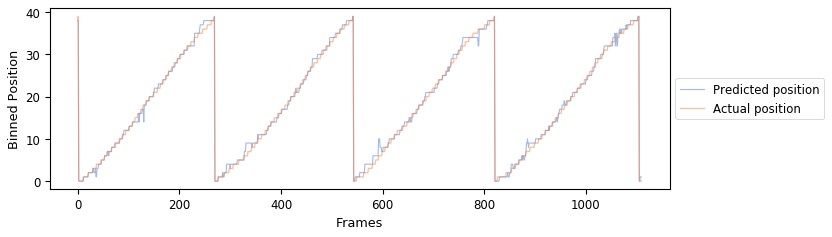

Training without cell 84
1110/1110 [==============================] - 0s 21us/step

Accuracy of test set:: 53.33%


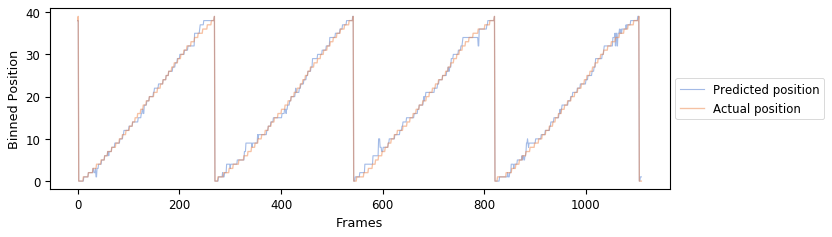

Training without cell 85
1110/1110 [==============================] - 0s 21us/step

Accuracy of test set:: 52.88%


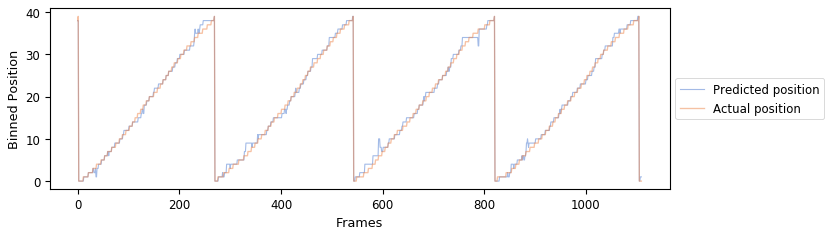

Training without cell 86
1110/1110 [==============================] - 0s 11us/step

Accuracy of test set:: 53.33%


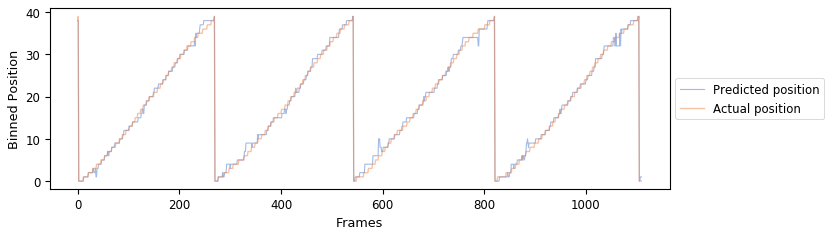

Training without cell 87
1110/1110 [==============================] - 0s 9us/step

Accuracy of test set:: 52.79%


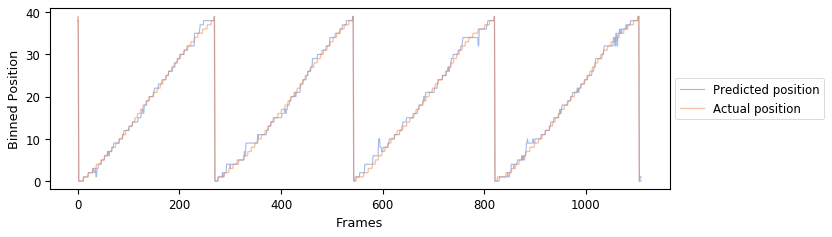

Training without cell 88
1110/1110 [==============================] - 0s 8us/step

Accuracy of test set:: 52.97%


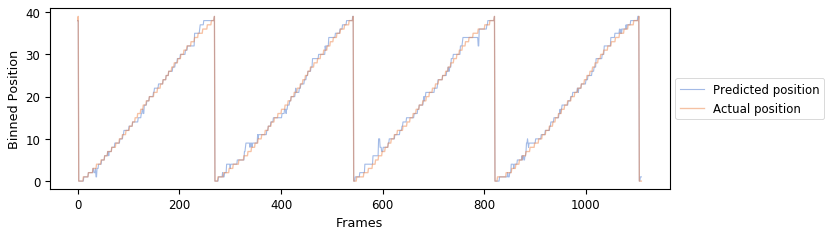

Training without cell 89
1110/1110 [==============================] - 0s 11us/step

Accuracy of test set:: 53.33%


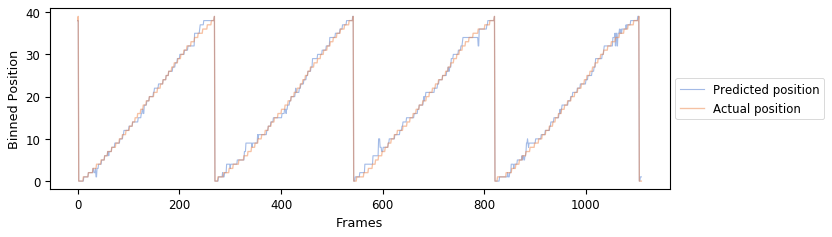

Training without cell 90
1110/1110 [==============================] - 0s 11us/step

Accuracy of test set:: 53.42%


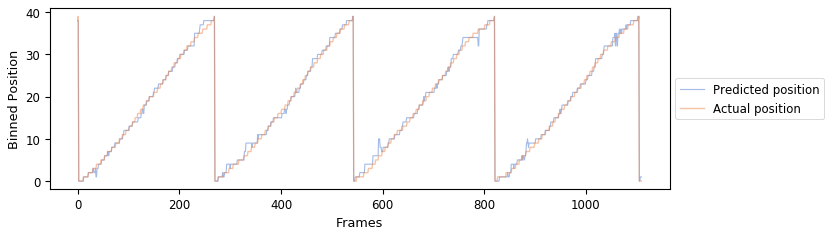

Training without cell 91
1110/1110 [==============================] - 0s 12us/step

Accuracy of test set:: 53.33%


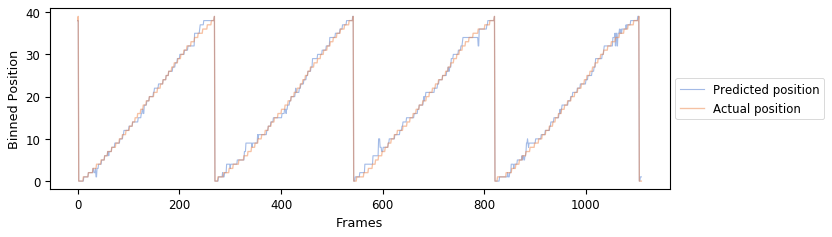

Training without cell 92
1110/1110 [==============================] - 0s 19us/step

Accuracy of test set:: 54.05%


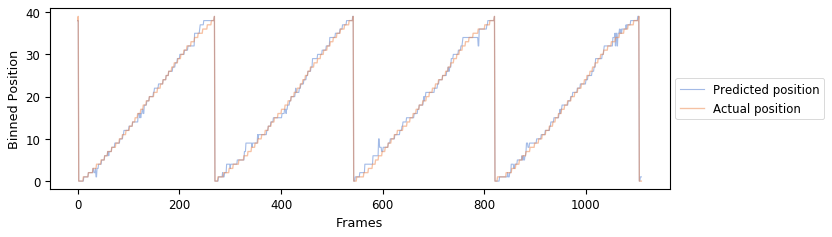

Training without cell 93
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 53.15%


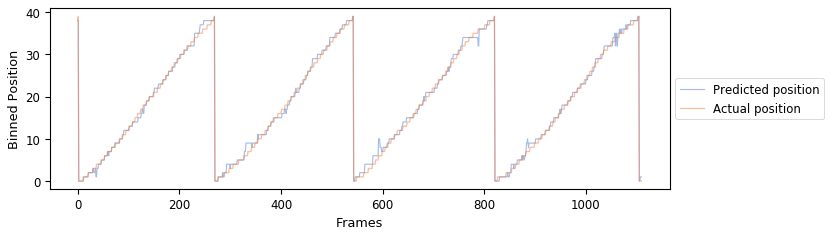

Training without cell 94
1110/1110 [==============================] - 0s 13us/step

Accuracy of test set:: 51.08%


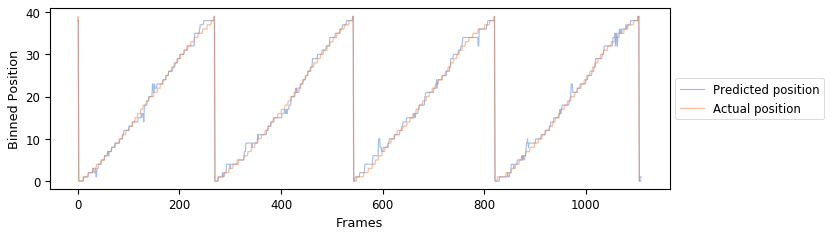

Training without cell 95
1110/1110 [==============================] - 0s 16us/step

Accuracy of test set:: 54.05%


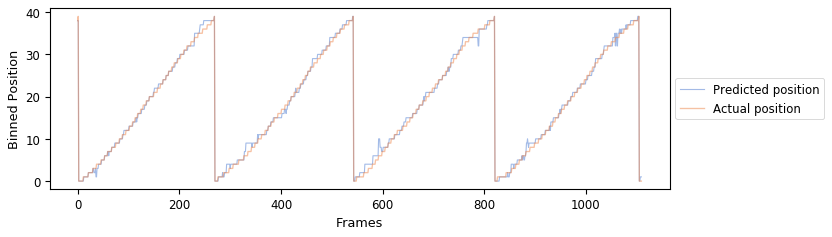

Training without cell 96
1110/1110 [==============================] - 0s 13us/step

Accuracy of test set:: 53.06%


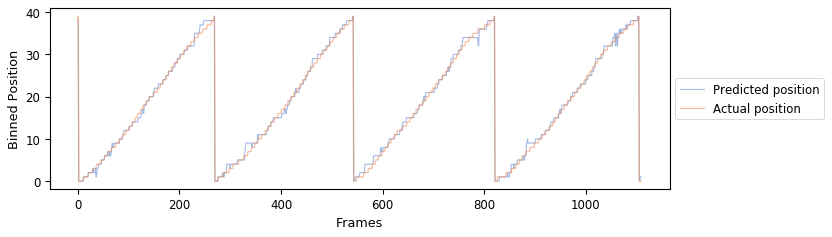

Training without cell 97
1110/1110 [==============================] - 0s 9us/step

Accuracy of test set:: 53.33%


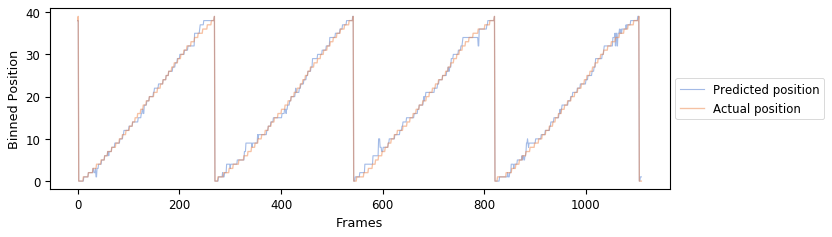

Training without cell 98
1110/1110 [==============================] - 0s 18us/step

Accuracy of test set:: 53.42%


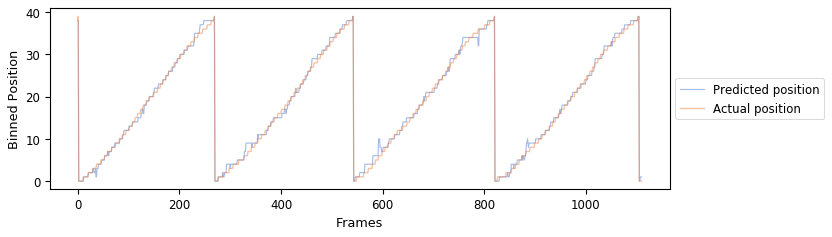

Training without cell 99
1110/1110 [==============================] - 0s 15us/step

Accuracy of test set:: 53.33%


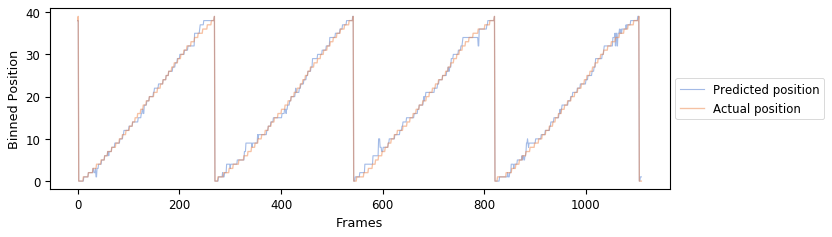

Training without cell 100
1110/1110 [==============================] - 0s 32us/step

Accuracy of test set:: 53.33%


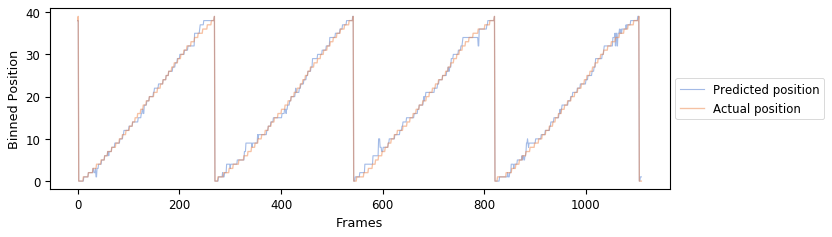

Training without cell 101
1110/1110 [==============================] - 0s 22us/step

Accuracy of test set:: 53.33%


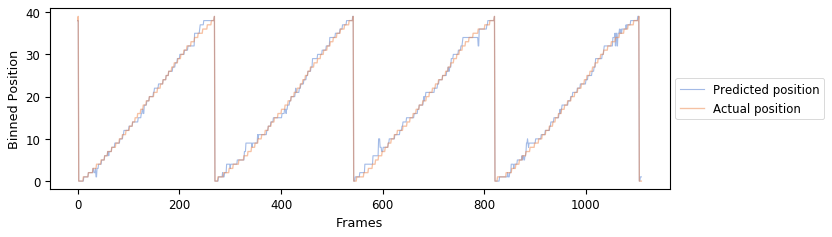

Training without cell 102
1110/1110 [==============================] - 0s 22us/step

Accuracy of test set:: 53.33%


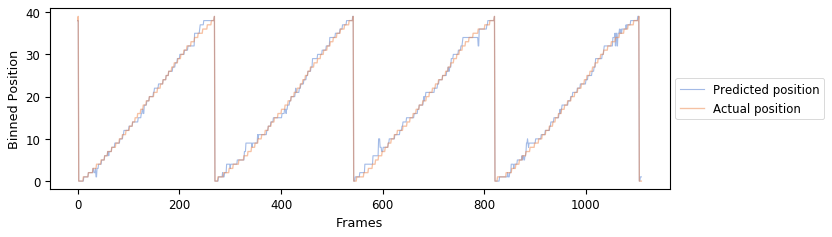

Training without cell 103
1110/1110 [==============================] - 0s 13us/step

Accuracy of test set:: 53.33%


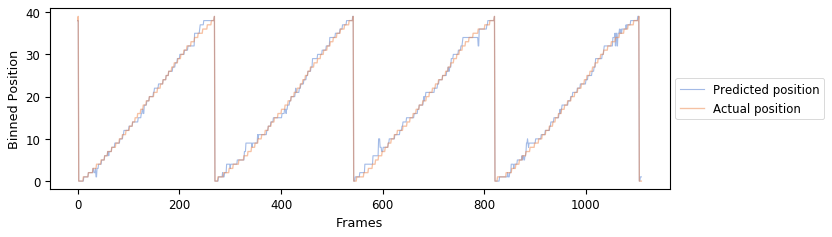

Training without cell 104
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 53.33%


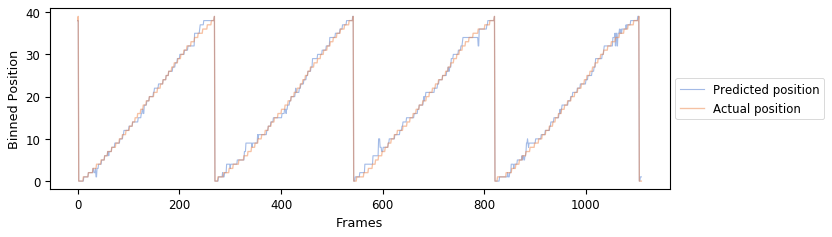

Training without cell 105
1110/1110 [==============================] - 0s 12us/step

Accuracy of test set:: 53.33%


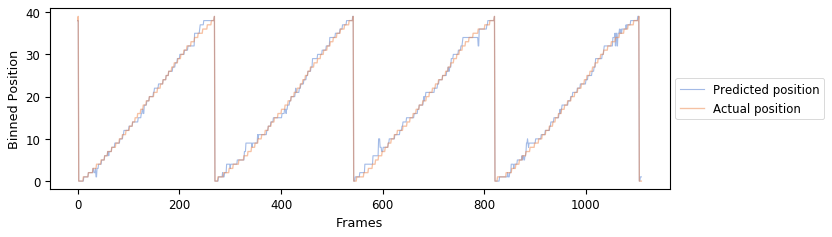

Training without cell 106
1110/1110 [==============================] - 0s 27us/step

Accuracy of test set:: 53.33%


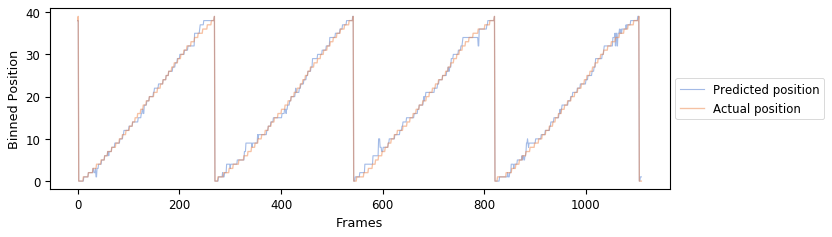

Training without cell 107
1110/1110 [==============================] - 0s 11us/step

Accuracy of test set:: 53.33%


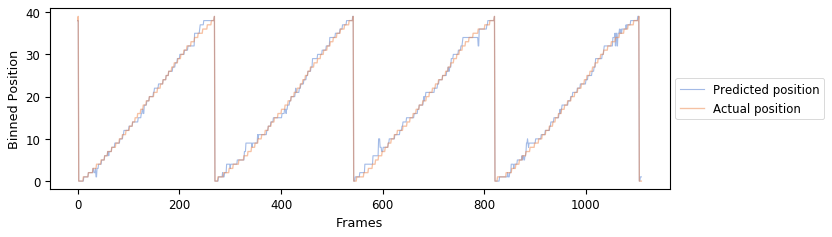

Training without cell 108
1110/1110 [==============================] - 0s 12us/step

Accuracy of test set:: 53.24%


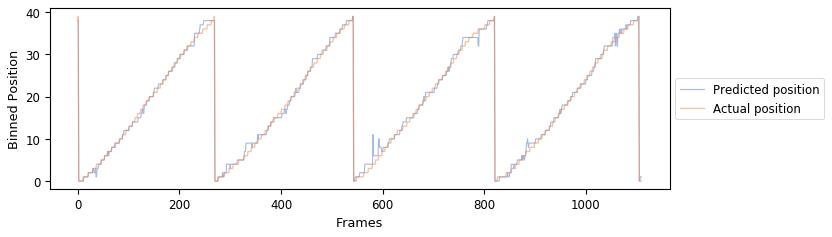

Training without cell 109
1110/1110 [==============================] - 0s 9us/step

Accuracy of test set:: 53.33%


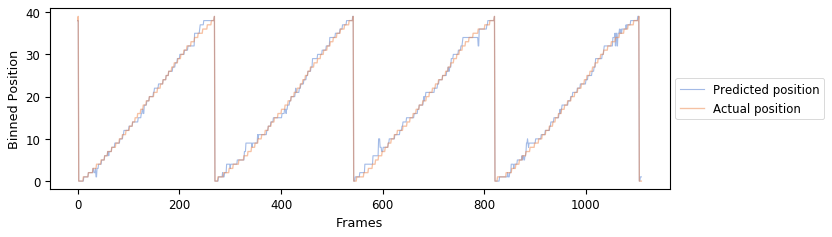

Training without cell 110
1110/1110 [==============================] - 0s 11us/step

Accuracy of test set:: 52.52%


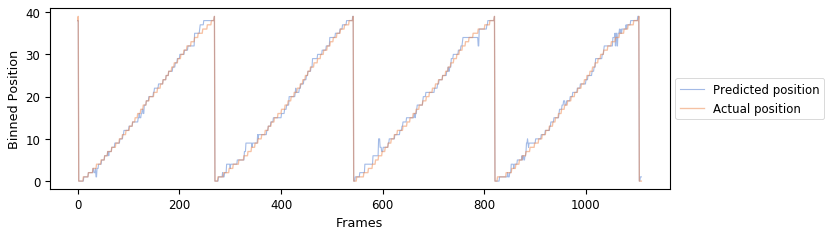

Training without cell 111
1110/1110 [==============================] - 0s 9us/step

Accuracy of test set:: 52.70%


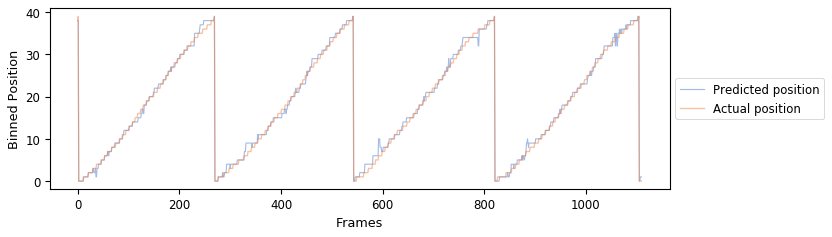

Training without cell 112
1110/1110 [==============================] - 0s 17us/step

Accuracy of test set:: 53.42%


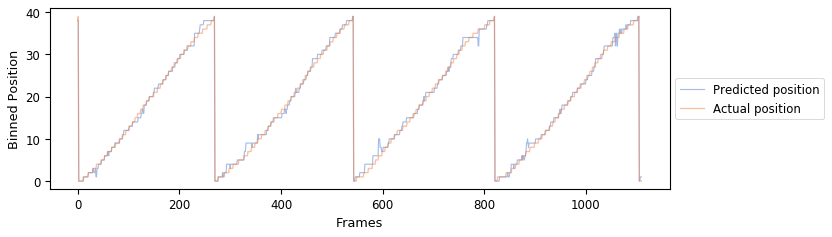

Training without cell 113
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 54.77%


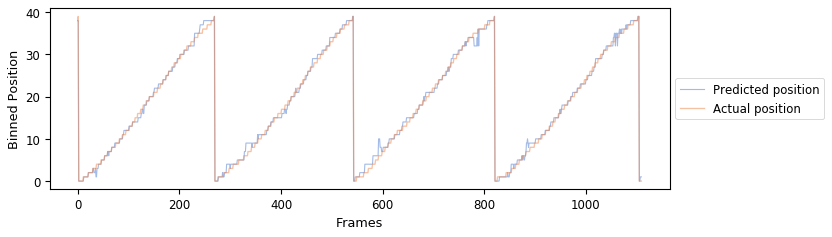

Training without cell 114
1110/1110 [==============================] - 0s 13us/step

Accuracy of test set:: 53.42%


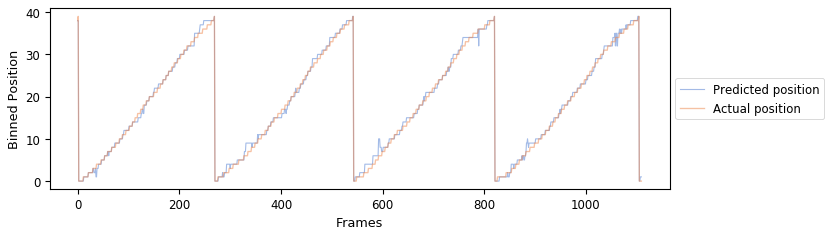

Training without cell 115
1110/1110 [==============================] - 0s 25us/step

Accuracy of test set:: 53.33%


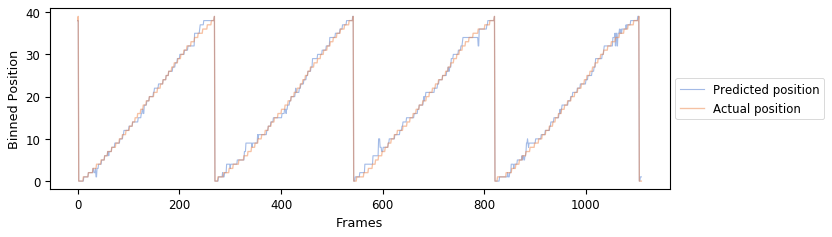

Training without cell 116
1110/1110 [==============================] - 0s 21us/step

Accuracy of test set:: 53.33%


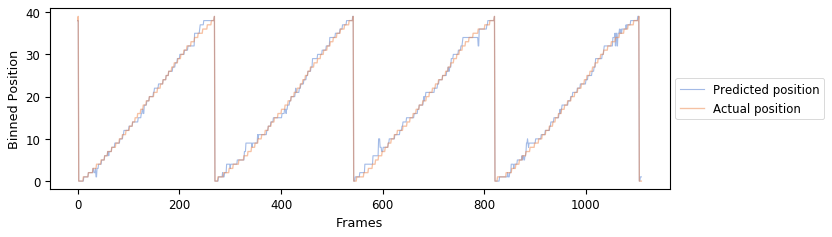

Training without cell 117
1110/1110 [==============================] - 0s 24us/step

Accuracy of test set:: 53.33%


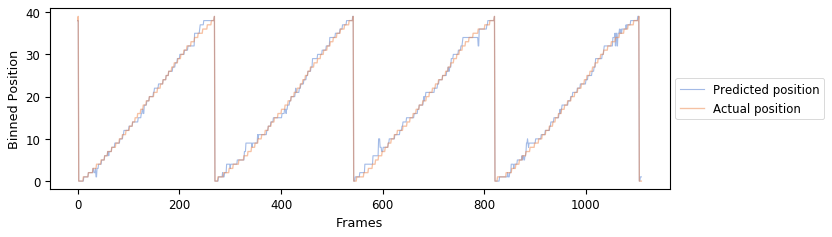

Training without cell 118
1110/1110 [==============================] - 0s 20us/step

Accuracy of test set:: 53.33%


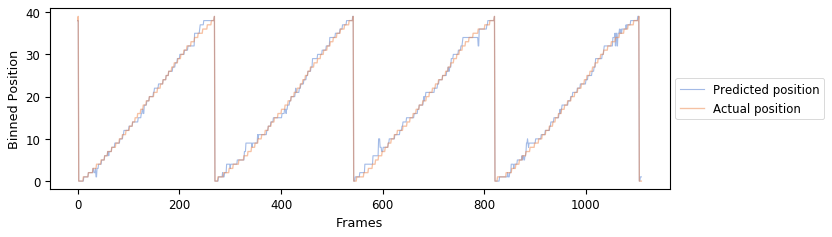

Training without cell 119
1110/1110 [==============================] - 0s 20us/step

Accuracy of test set:: 53.33%


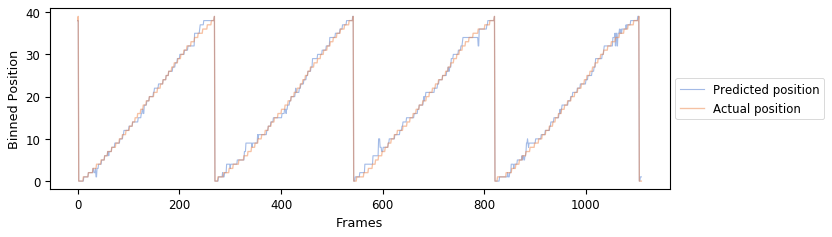

Training without cell 120
1110/1110 [==============================] - 0s 19us/step

Accuracy of test set:: 53.33%


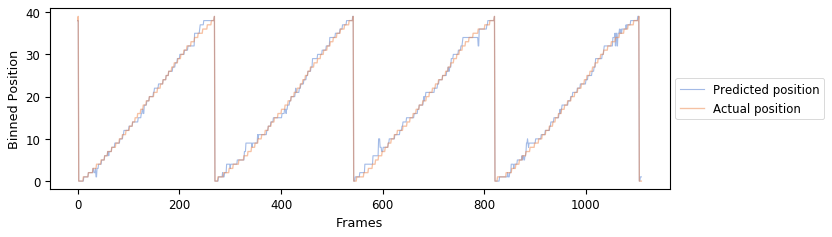

Training without cell 121
1110/1110 [==============================] - 0s 22us/step

Accuracy of test set:: 53.33%


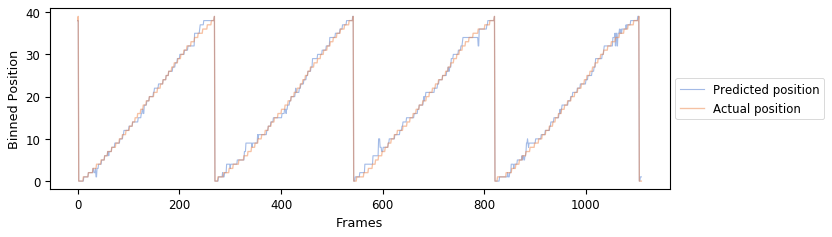

Training without cell 122
1110/1110 [==============================] - 0s 9us/step

Accuracy of test set:: 53.33%


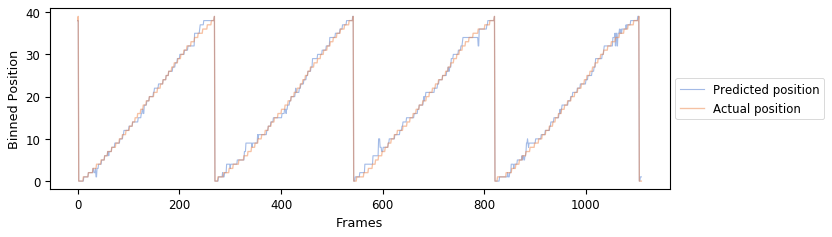

Training without cell 123
1110/1110 [==============================] - 0s 11us/step

Accuracy of test set:: 52.61%


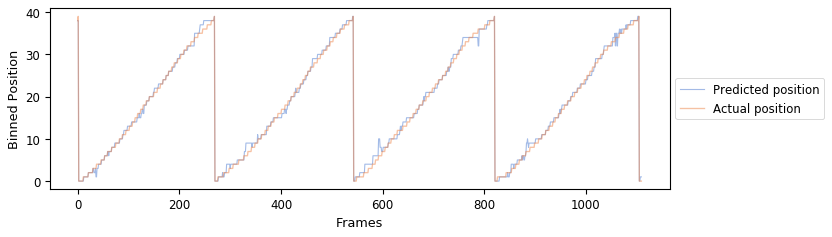

Training without cell 124
1110/1110 [==============================] - 0s 16us/step

Accuracy of test set:: 53.33%


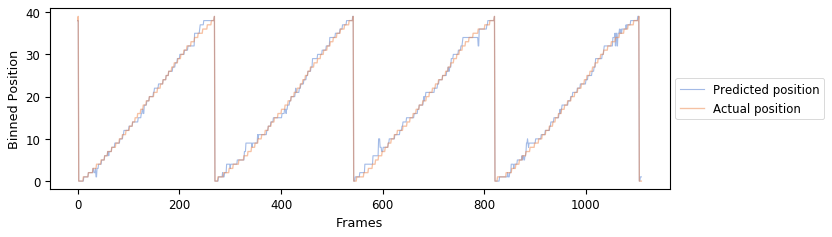

Training without cell 125
1110/1110 [==============================] - 0s 11us/step

Accuracy of test set:: 53.15%


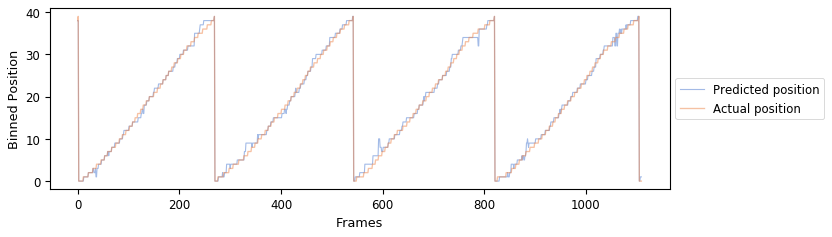

Training without cell 126
1110/1110 [==============================] - 0s 16us/step

Accuracy of test set:: 53.33%


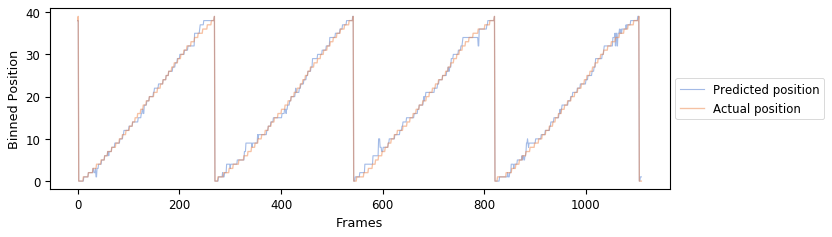

Training without cell 127
1110/1110 [==============================] - 0s 16us/step

Accuracy of test set:: 52.79%


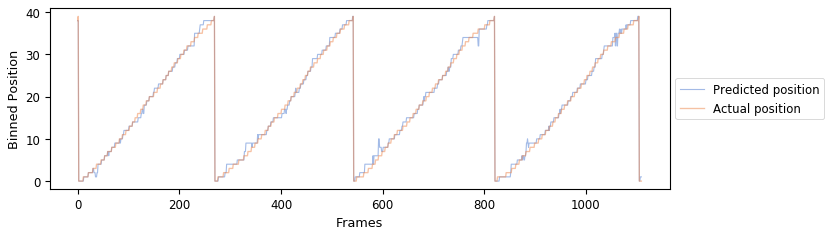

Training without cell 128
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 53.24%


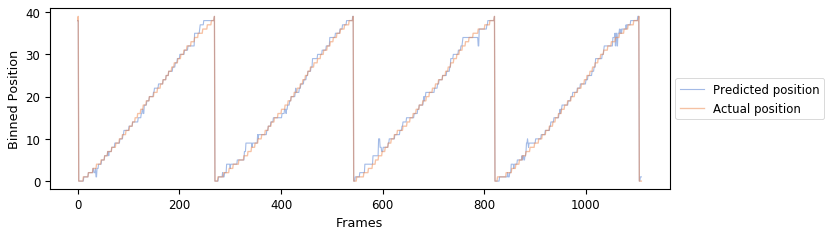

Training without cell 129
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 52.70%


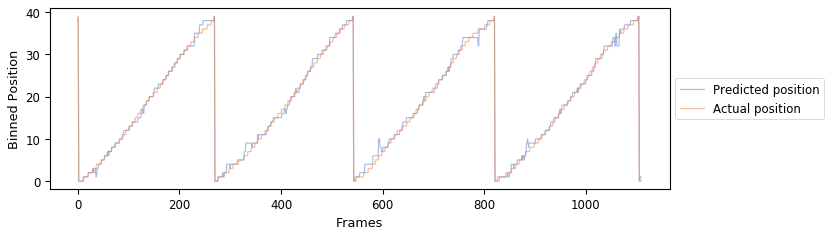

Training without cell 130
1110/1110 [==============================] - 0s 9us/step

Accuracy of test set:: 53.33%


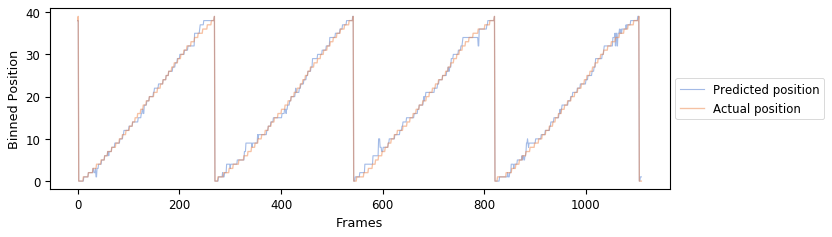

Training without cell 131
1110/1110 [==============================] - 0s 16us/step

Accuracy of test set:: 53.33%


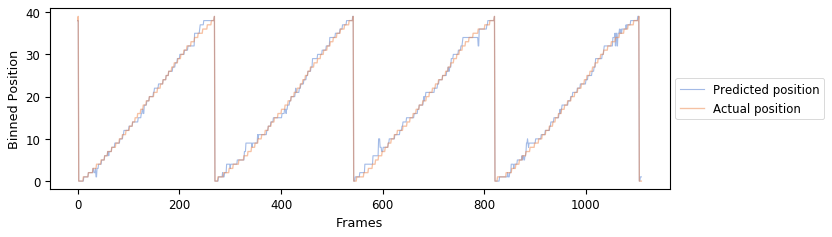

Training without cell 132
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 53.51%


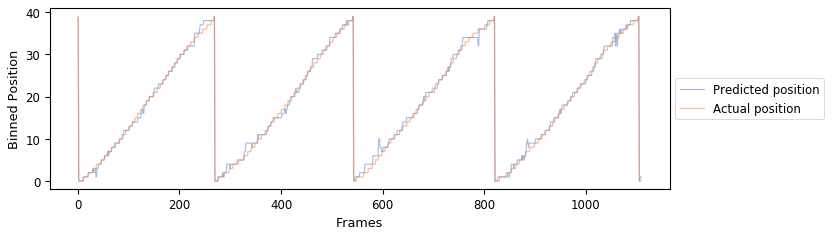

Training without cell 133
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 53.33%


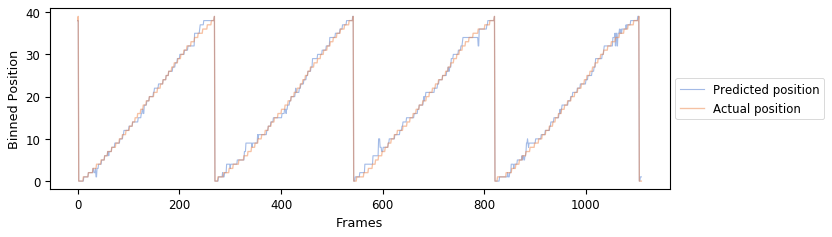

Training without cell 134
1110/1110 [==============================] - 0s 7us/step

Accuracy of test set:: 53.33%


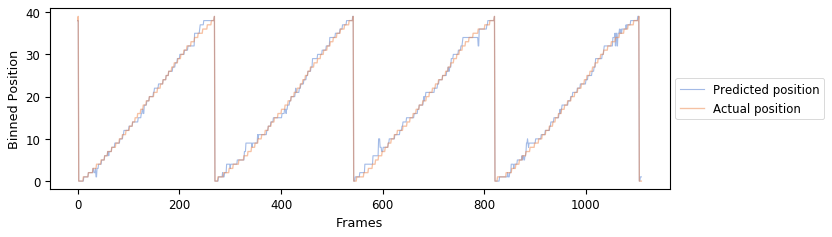

Training without cell 135
1110/1110 [==============================] - 0s 9us/step

Accuracy of test set:: 51.98%


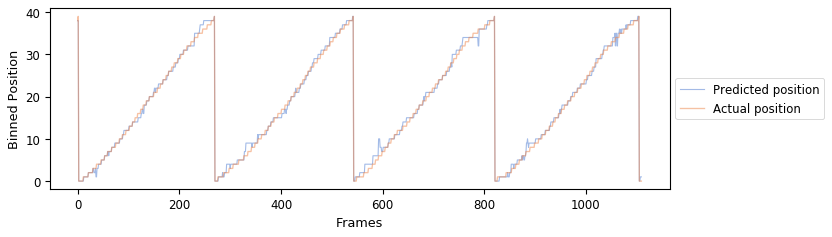

Training without cell 136
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 53.33%


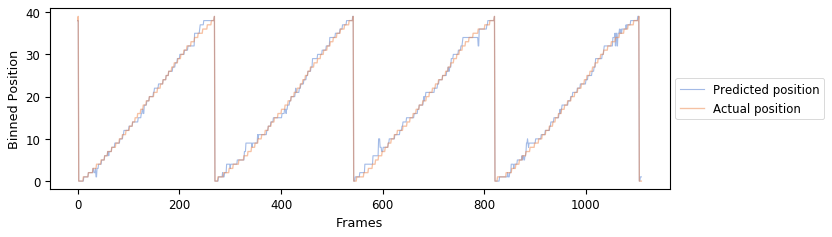

Training without cell 137
1110/1110 [==============================] - 0s 9us/step

Accuracy of test set:: 53.06%


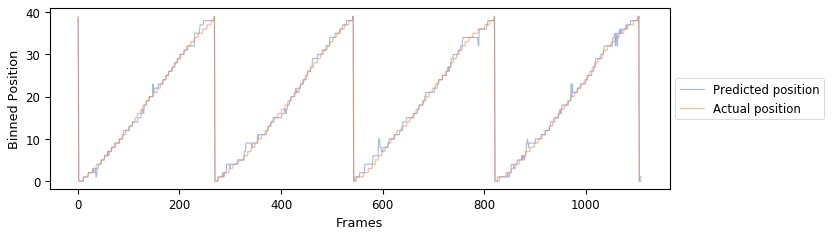

Training without cell 138
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 53.87%


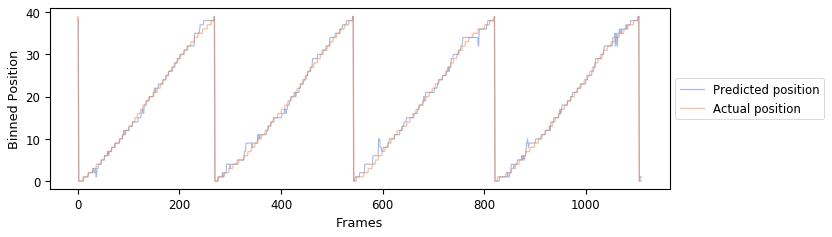

Training without cell 139
1110/1110 [==============================] - 0s 12us/step

Accuracy of test set:: 54.50%


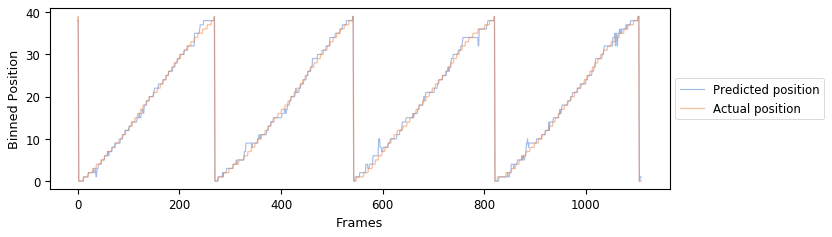

Training without cell 140
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 53.42%


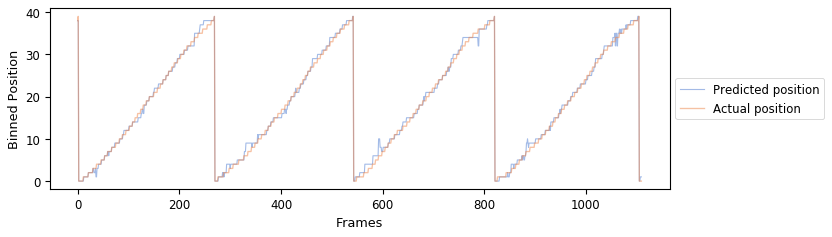

Training without cell 141
1110/1110 [==============================] - 0s 9us/step

Accuracy of test set:: 52.70%


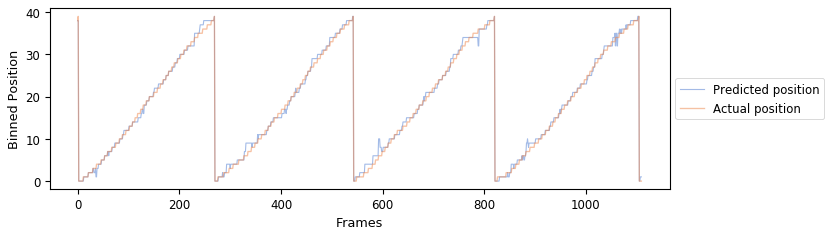

Training without cell 142
1110/1110 [==============================] - 0s 8us/step

Accuracy of test set:: 52.52%


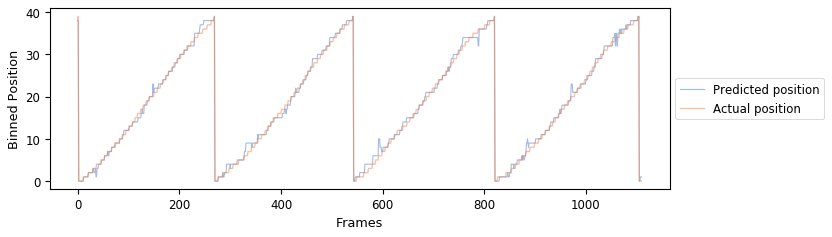

Training without cell 143
1110/1110 [==============================] - 0s 12us/step

Accuracy of test set:: 53.24%


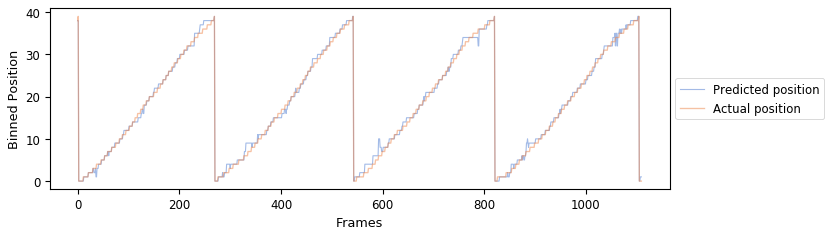

Training without cell 144
1110/1110 [==============================] - 0s 9us/step

Accuracy of test set:: 53.33%


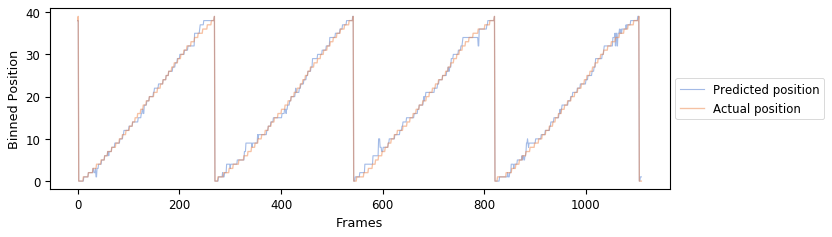

Training without cell 145
1110/1110 [==============================] - 0s 11us/step

Accuracy of test set:: 53.33%


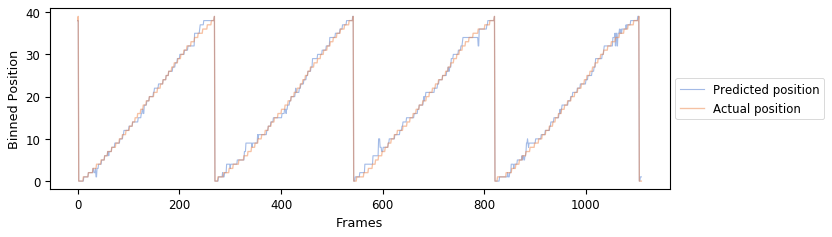

Training without cell 146
1110/1110 [==============================] - 0s 12us/step

Accuracy of test set:: 53.33%


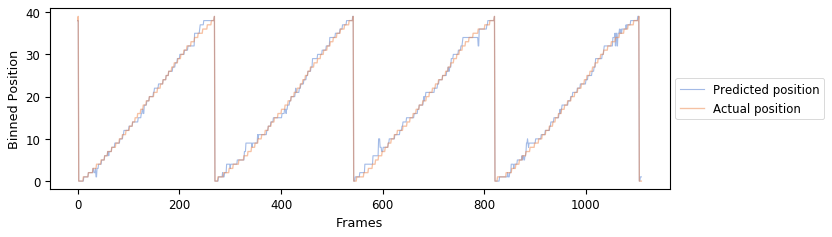

Training without cell 147
1110/1110 [==============================] - 0s 15us/step

Accuracy of test set:: 52.79%


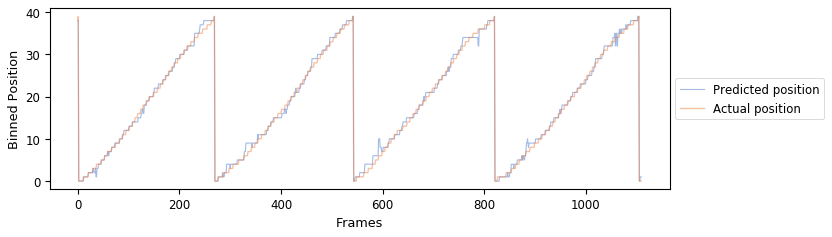

Training without cell 148
1110/1110 [==============================] - 0s 14us/step

Accuracy of test set:: 52.34%


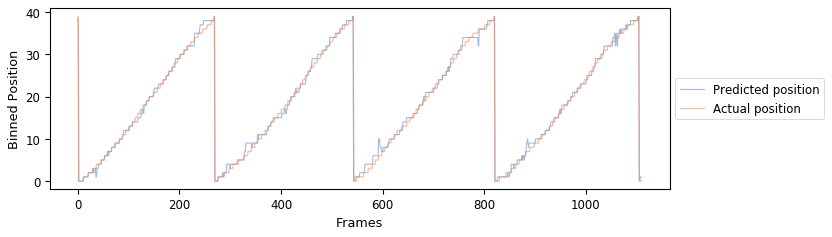

Training without cell 149
1110/1110 [==============================] - 0s 30us/step

Accuracy of test set:: 53.33%


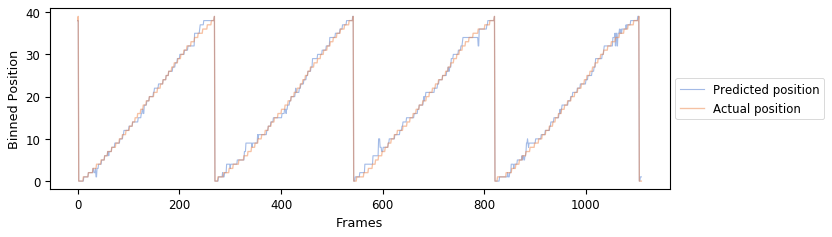

Training without cell 150
1110/1110 [==============================] - 0s 15us/step

Accuracy of test set:: 51.62%


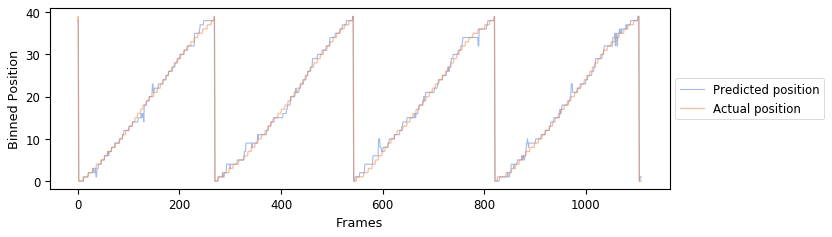

Training without cell 151
1110/1110 [==============================] - 0s 24us/step

Accuracy of test set:: 53.33%


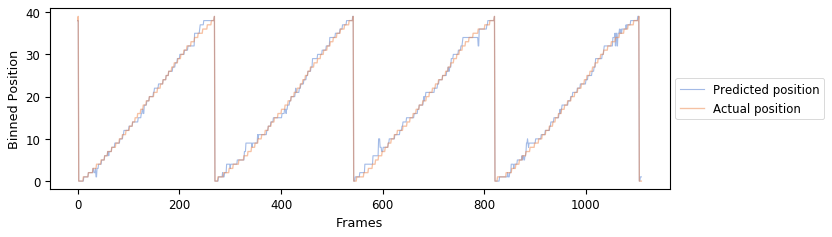

Training without cell 152
1110/1110 [==============================] - 0s 11us/step

Accuracy of test set:: 53.69%


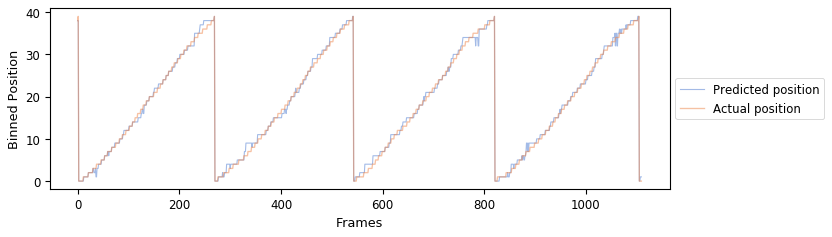

Training without cell 153
1110/1110 [==============================] - 0s 30us/step

Accuracy of test set:: 53.24%


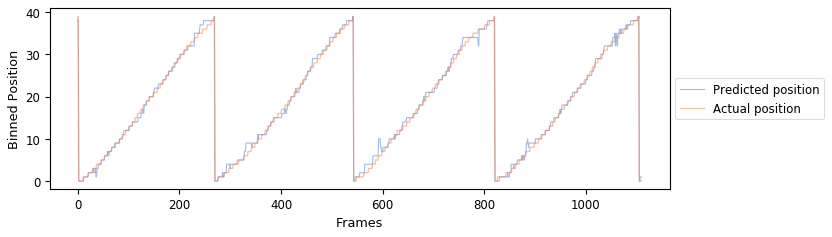

Training without cell 154
1110/1110 [==============================] - 0s 22us/step

Accuracy of test set:: 52.79%


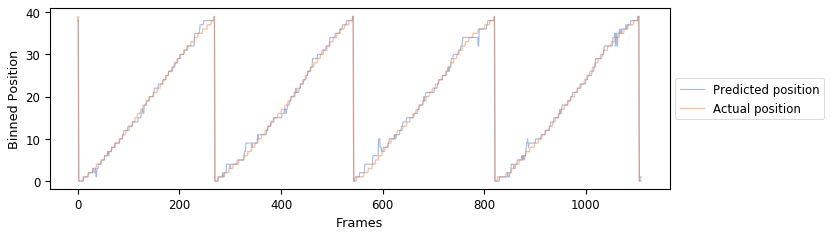

Training without cell 155
1110/1110 [==============================] - 0s 15us/step

Accuracy of test set:: 53.33%


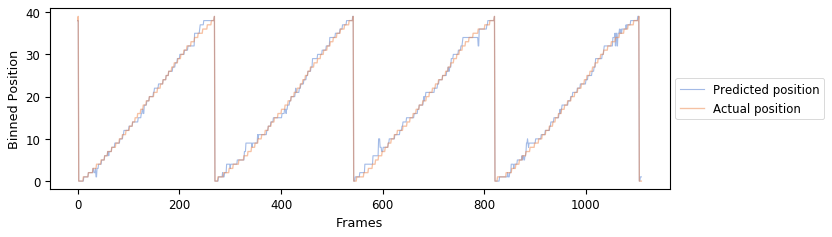

Training without cell 156
1110/1110 [==============================] - 0s 15us/step

Accuracy of test set:: 53.33%


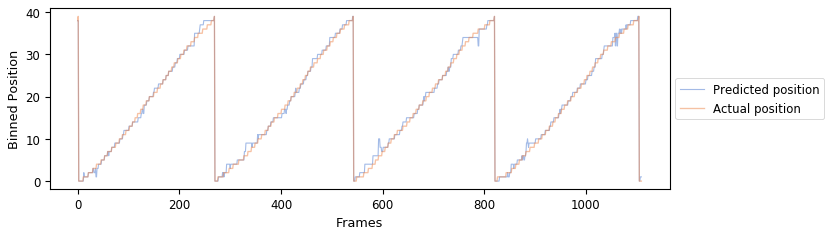

Training without cell 157
1110/1110 [==============================] - 0s 11us/step

Accuracy of test set:: 53.33%


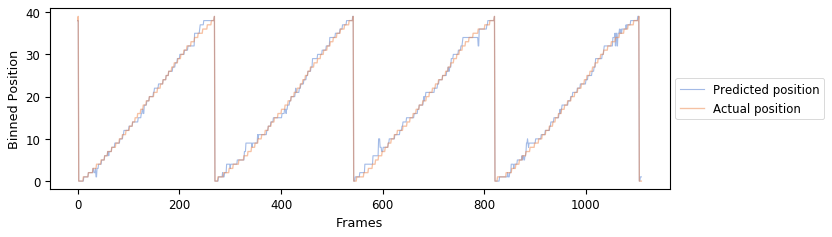

Training without cell 158
1110/1110 [==============================] - 0s 11us/step

Accuracy of test set:: 52.88%


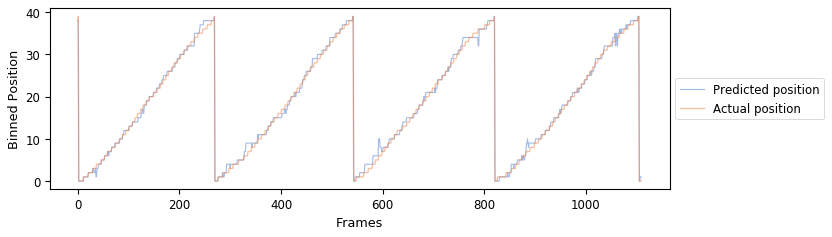

Training without cell 159
1110/1110 [==============================] - 0s 16us/step

Accuracy of test set:: 53.15%


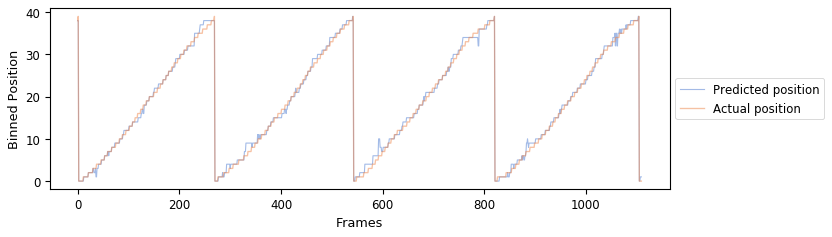

Training without cell 160
1110/1110 [==============================] - 0s 8us/step

Accuracy of test set:: 52.25%


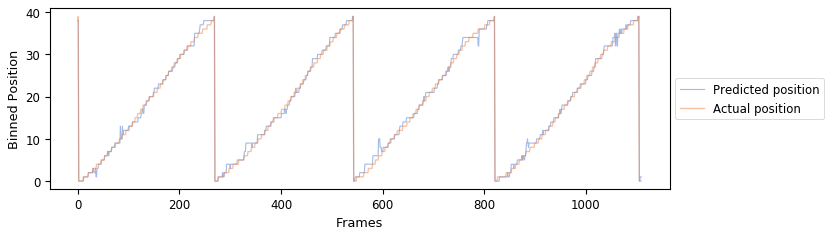

Training without cell 161
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 53.15%


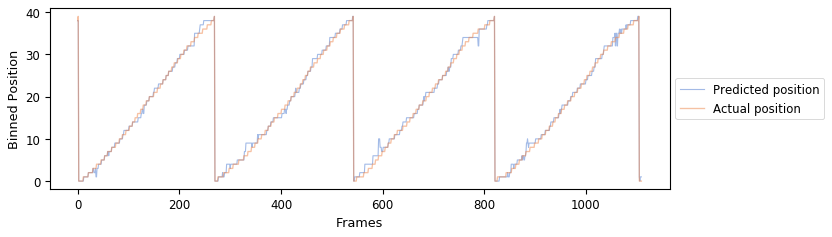

Training without cell 162
1110/1110 [==============================] - 0s 11us/step

Accuracy of test set:: 55.23%


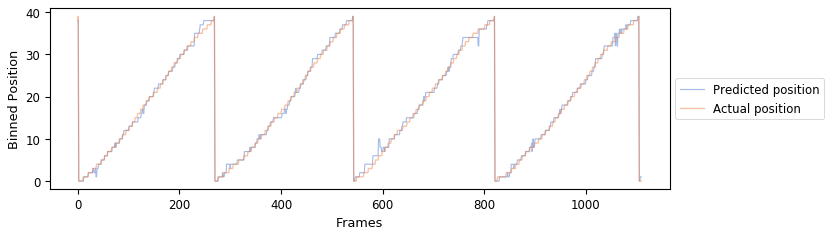

Training without cell 163
1110/1110 [==============================] - 0s 12us/step

Accuracy of test set:: 53.42%


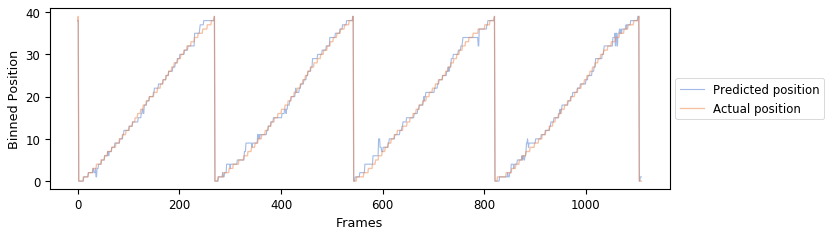

Training without cell 164
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 50.63%


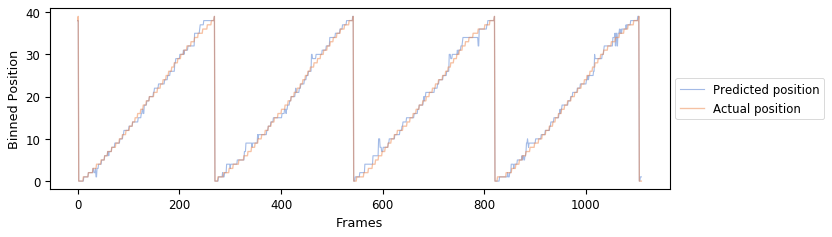

Training without cell 165
1110/1110 [==============================] - 0s 12us/step

Accuracy of test set:: 53.15%


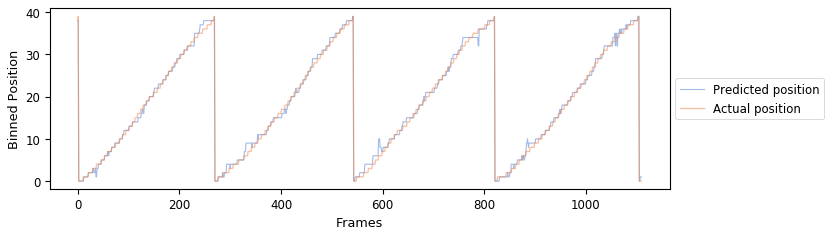

Training without cell 166
1110/1110 [==============================] - 0s 12us/step

Accuracy of test set:: 55.05%


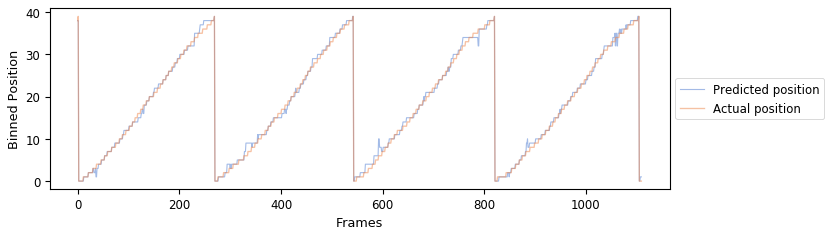

Training without cell 167
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 53.33%


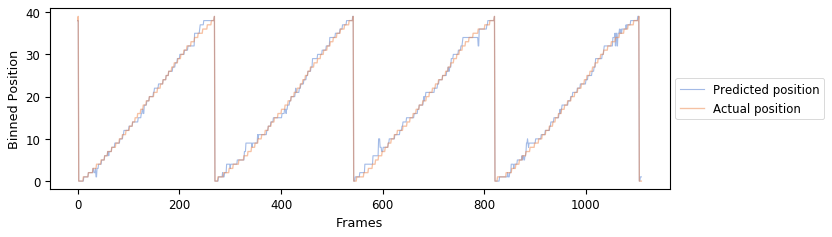

Training without cell 168
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 51.89%


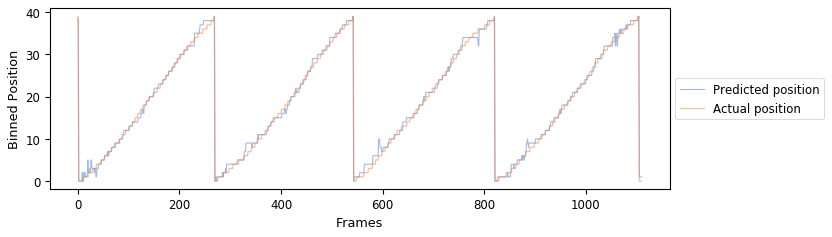

Training without cell 169
1110/1110 [==============================] - 0s 11us/step

Accuracy of test set:: 53.15%


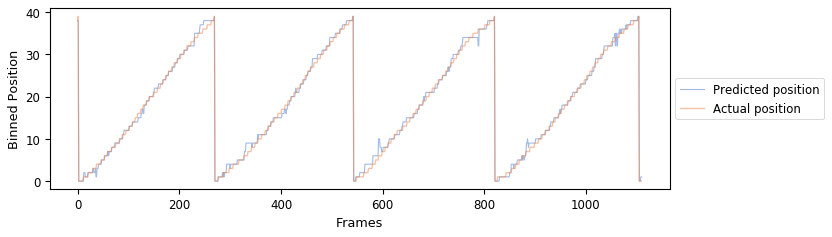

Training without cell 170
1110/1110 [==============================] - 0s 16us/step

Accuracy of test set:: 53.24%


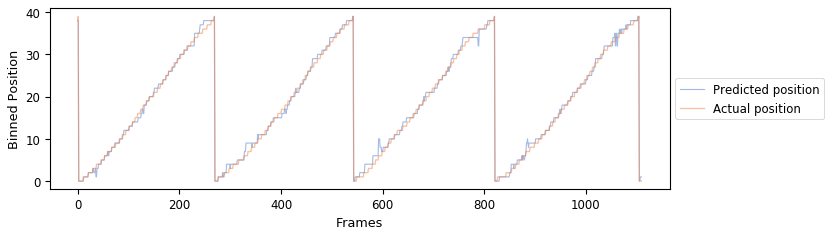

Training without cell 171
1110/1110 [==============================] - 0s 16us/step

Accuracy of test set:: 52.88%


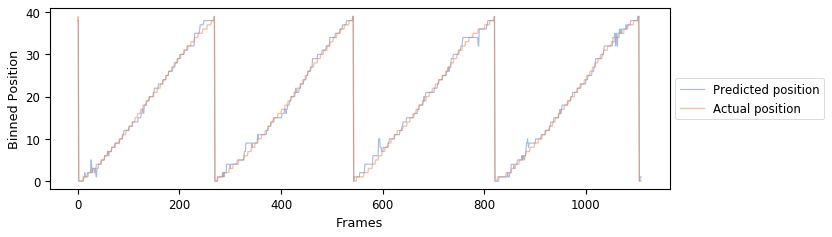

Training without cell 172
1110/1110 [==============================] - 0s 24us/step

Accuracy of test set:: 53.06%


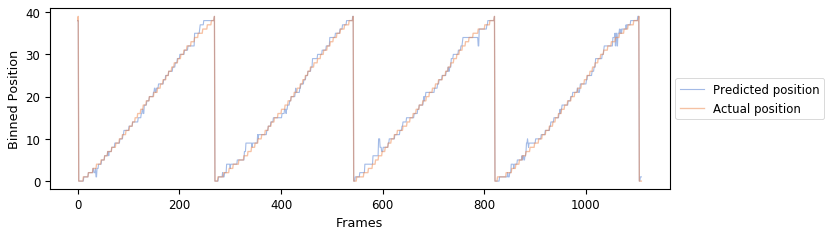

Training without cell 173
1110/1110 [==============================] - 0s 16us/step

Accuracy of test set:: 53.33%


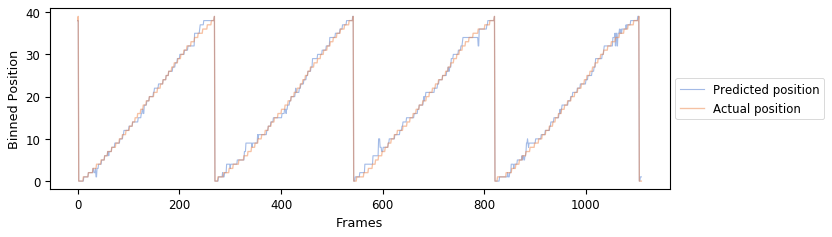

Training without cell 174
1110/1110 [==============================] - 0s 14us/step

Accuracy of test set:: 53.33%


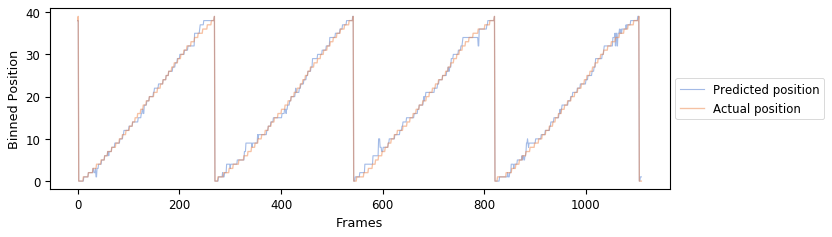

Training without cell 175
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 53.33%


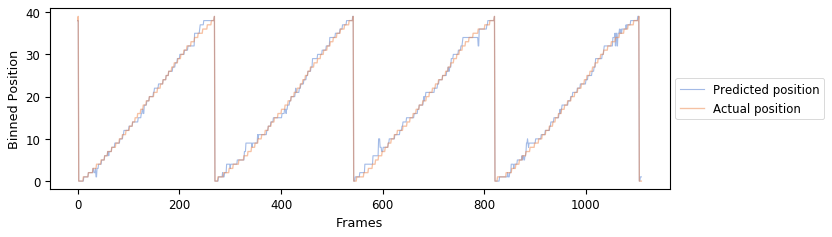

Training without cell 176
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 53.33%


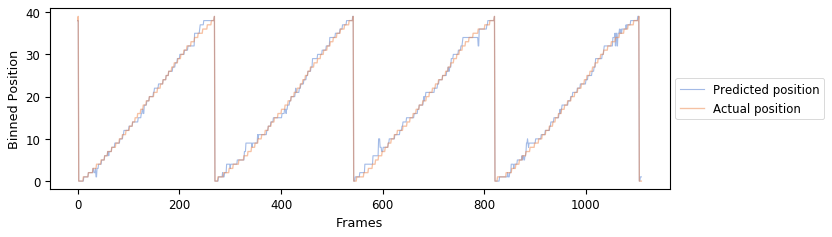

Training without cell 177
1110/1110 [==============================] - 0s 15us/step

Accuracy of test set:: 53.33%


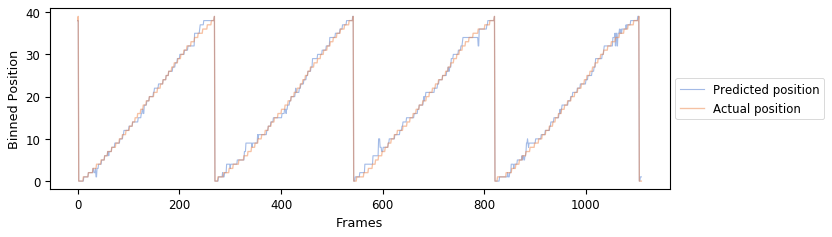

Training without cell 178
1110/1110 [==============================] - 0s 17us/step

Accuracy of test set:: 53.33%


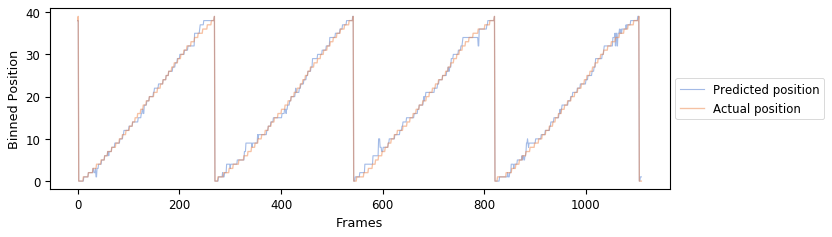

Training without cell 179
1110/1110 [==============================] - 0s 13us/step

Accuracy of test set:: 53.33%


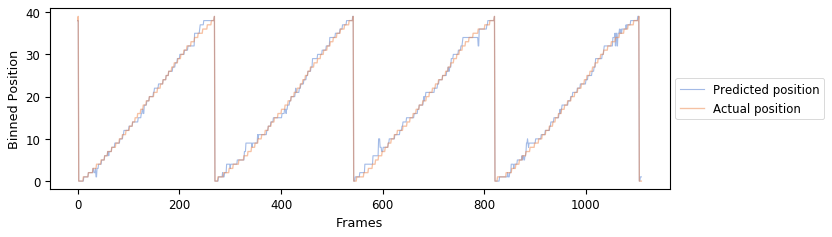

Training without cell 180
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 53.33%


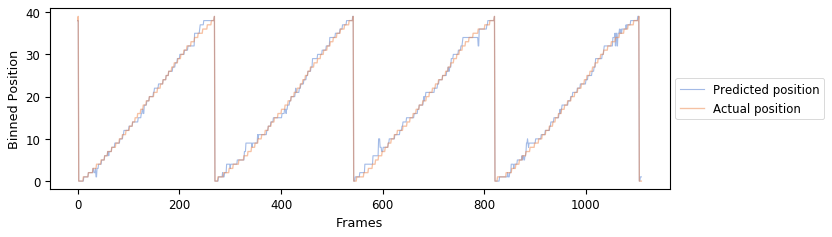

Training without cell 181
1110/1110 [==============================] - 0s 19us/step

Accuracy of test set:: 53.33%


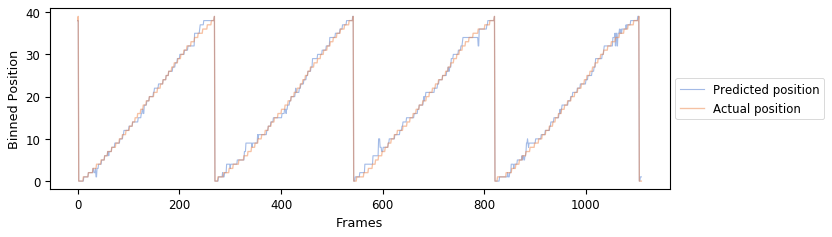

Training without cell 182
1110/1110 [==============================] - 0s 13us/step

Accuracy of test set:: 53.51%


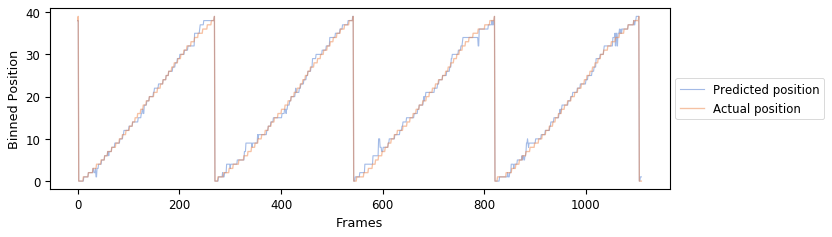

Training without cell 183
1110/1110 [==============================] - 0s 12us/step

Accuracy of test set:: 53.51%


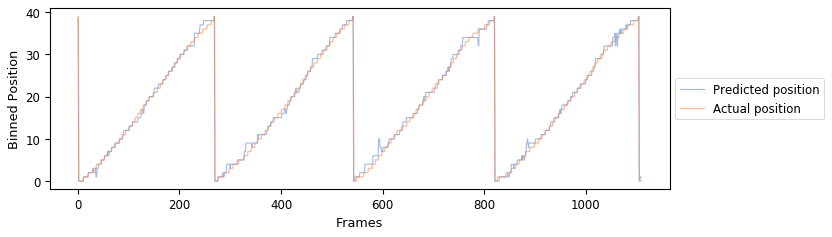

Training without cell 184
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 53.33%


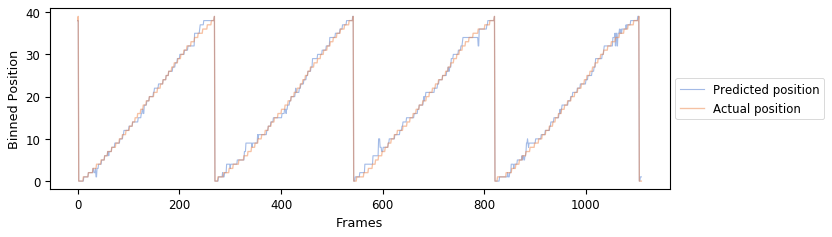

Training without cell 185
1110/1110 [==============================] - 0s 8us/step

Accuracy of test set:: 53.33%


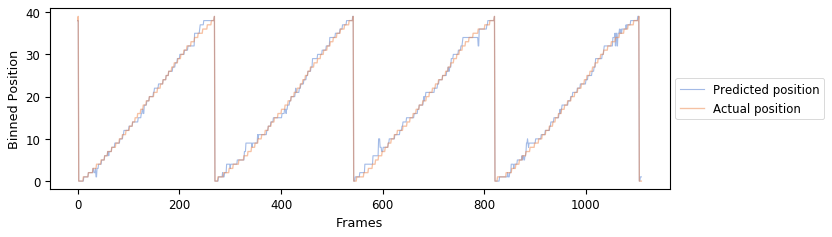

Training without cell 186
1110/1110 [==============================] - 0s 13us/step

Accuracy of test set:: 53.15%


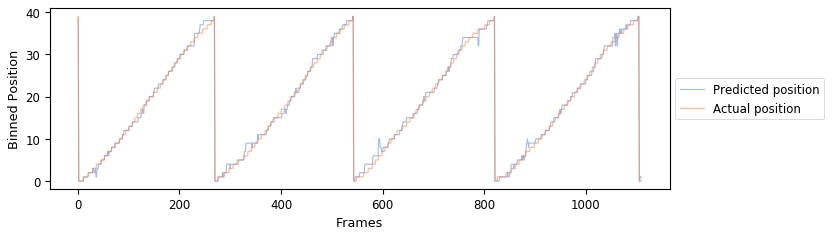

Training without cell 187
1110/1110 [==============================] - 0s 14us/step

Accuracy of test set:: 53.33%


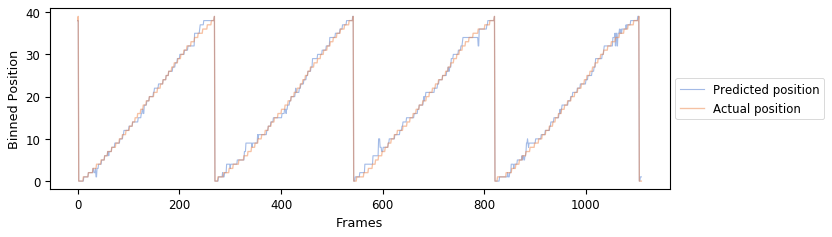

Training without cell 188
1110/1110 [==============================] - 0s 8us/step

Accuracy of test set:: 53.33%


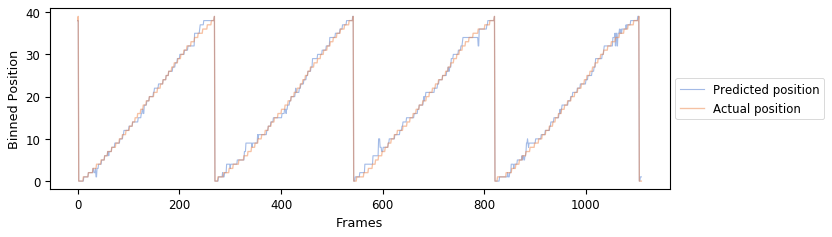

Training without cell 189
1110/1110 [==============================] - 0s 14us/step

Accuracy of test set:: 53.33%


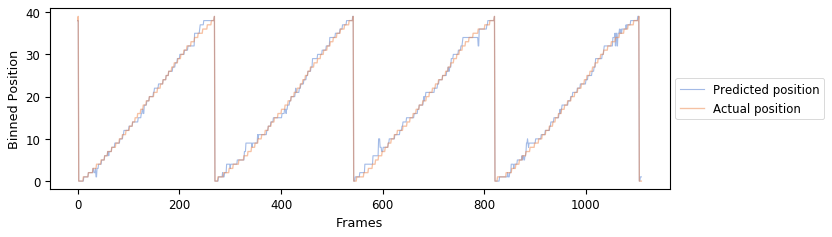

Training without cell 190
1110/1110 [==============================] - 0s 15us/step

Accuracy of test set:: 53.33%


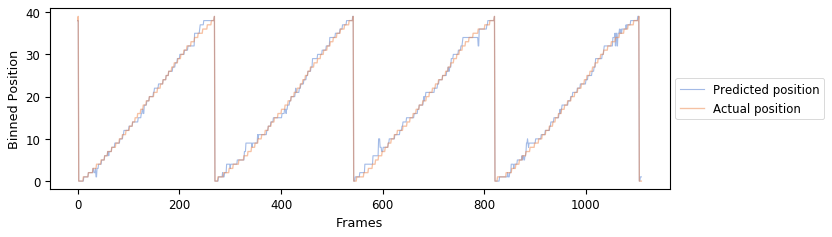

Training without cell 191
1110/1110 [==============================] - 0s 15us/step

Accuracy of test set:: 53.33%


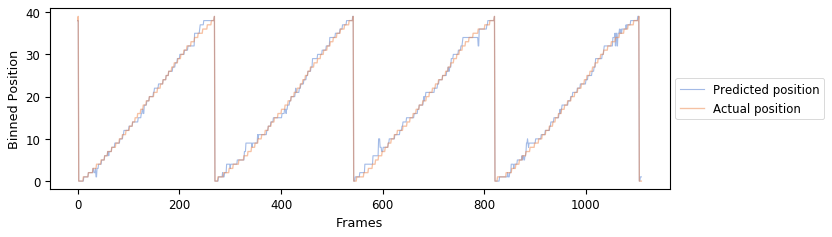

Training without cell 192
1110/1110 [==============================] - 0s 11us/step

Accuracy of test set:: 53.33%


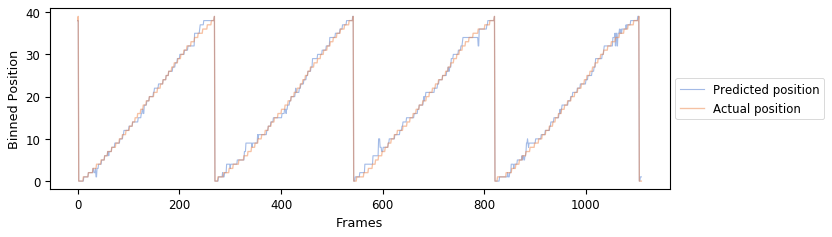

Training without cell 193
1110/1110 [==============================] - 0s 11us/step

Accuracy of test set:: 53.33%


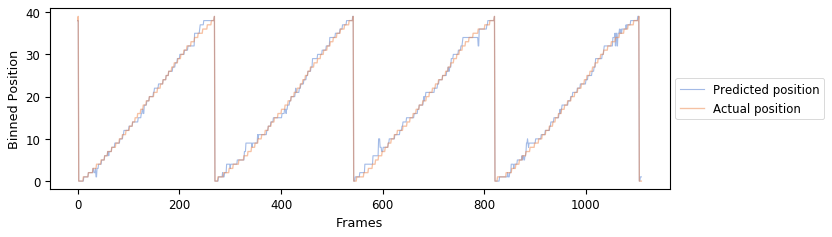

Training without cell 194
1110/1110 [==============================] - 0s 16us/step

Accuracy of test set:: 53.33%


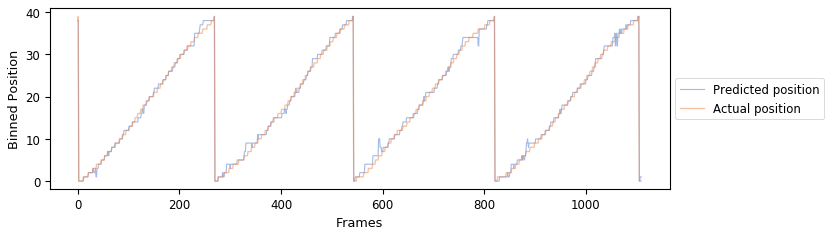

Training without cell 195
1110/1110 [==============================] - 0s 11us/step

Accuracy of test set:: 53.42%


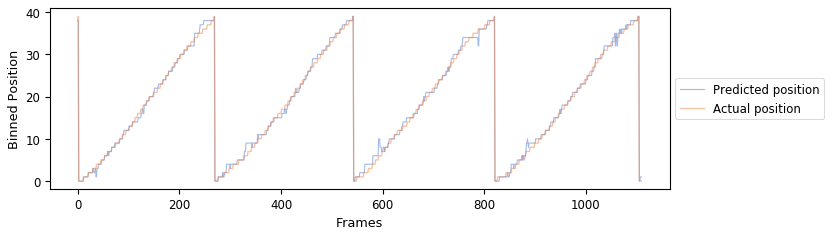

Training without cell 196
1110/1110 [==============================] - 0s 11us/step

Accuracy of test set:: 53.33%


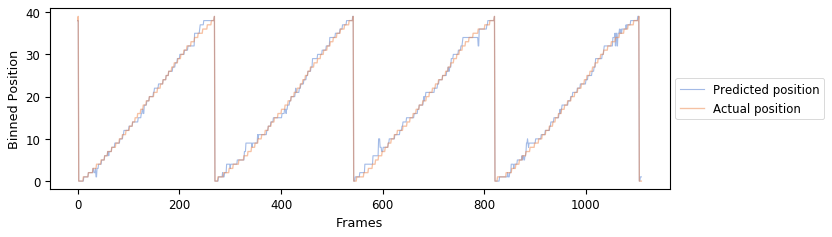

Training without cell 197
1110/1110 [==============================] - 0s 9us/step

Accuracy of test set:: 53.33%


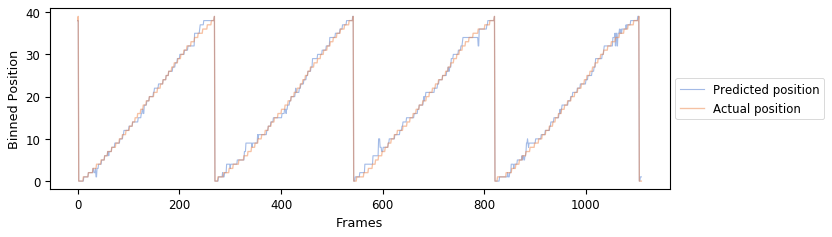

Training without cell 198
1110/1110 [==============================] - 0s 12us/step

Accuracy of test set:: 53.33%


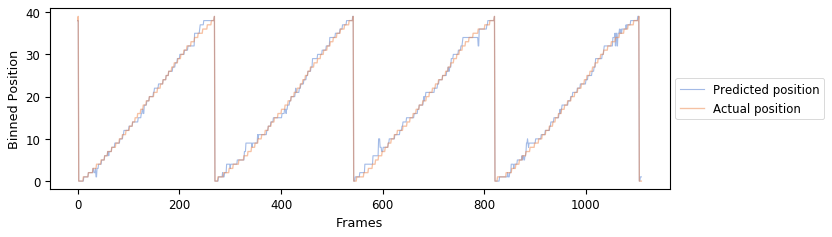

Training without cell 199
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 53.78%


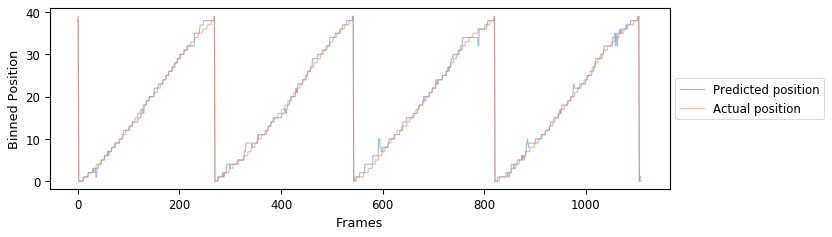

Training without cell 200
1110/1110 [==============================] - 0s 16us/step

Accuracy of test set:: 53.33%


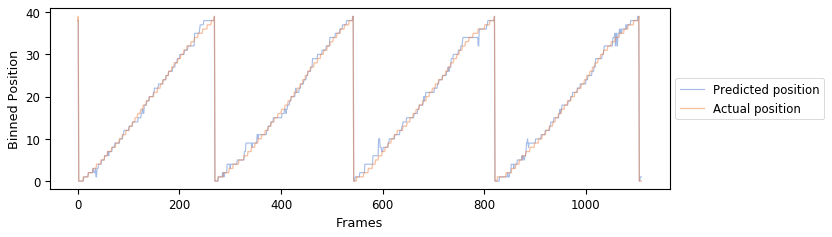

Training without cell 201
1110/1110 [==============================] - 0s 8us/step

Accuracy of test set:: 52.61%


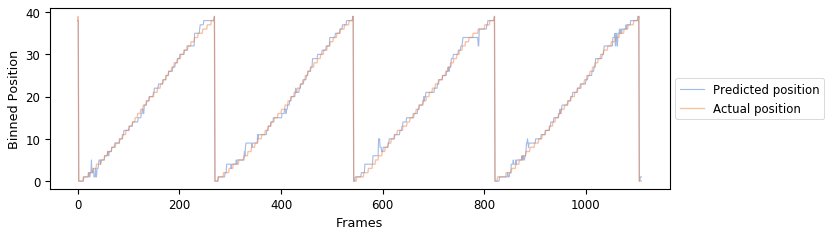

Training without cell 202
1110/1110 [==============================] - 0s 15us/step

Accuracy of test set:: 53.60%


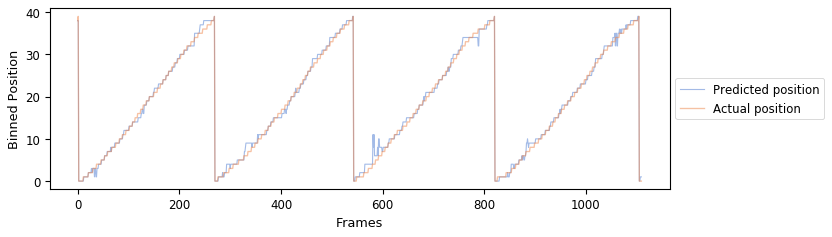

Training without cell 203
1110/1110 [==============================] - 0s 16us/step

Accuracy of test set:: 53.06%


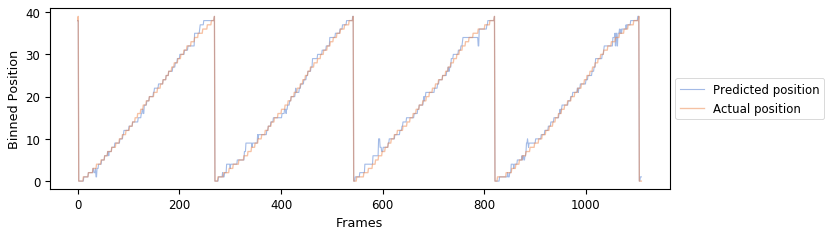

Training without cell 204
1110/1110 [==============================] - 0s 9us/step

Accuracy of test set:: 53.33%


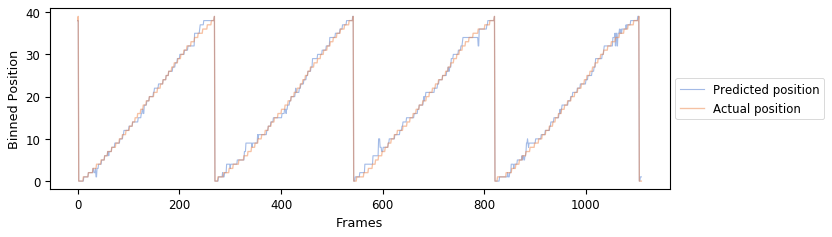

Training without cell 205
1110/1110 [==============================] - 0s 12us/step

Accuracy of test set:: 52.61%


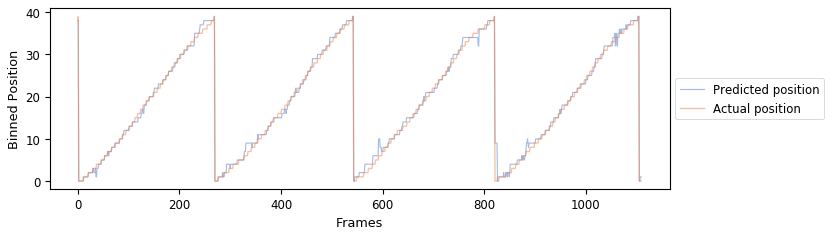

Training without cell 206
1110/1110 [==============================] - 0s 12us/step

Accuracy of test set:: 53.42%


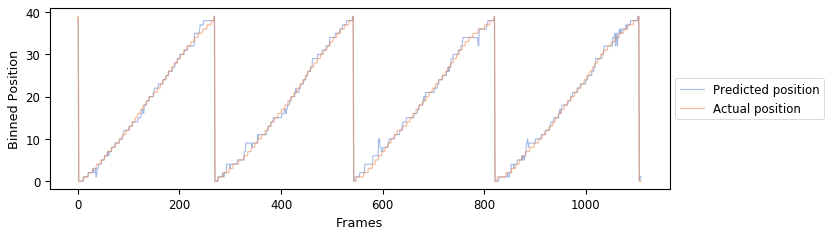

Training without cell 207
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 53.42%


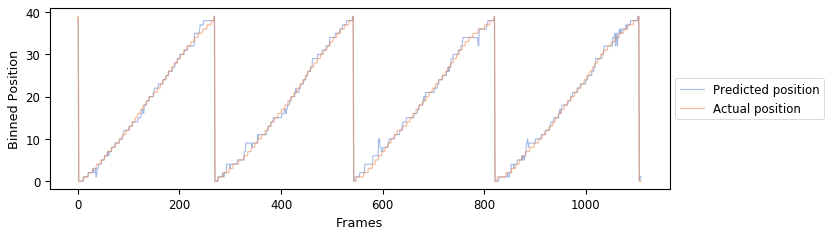

Training without cell 208
1110/1110 [==============================] - 0s 30us/step

Accuracy of test set:: 53.33%


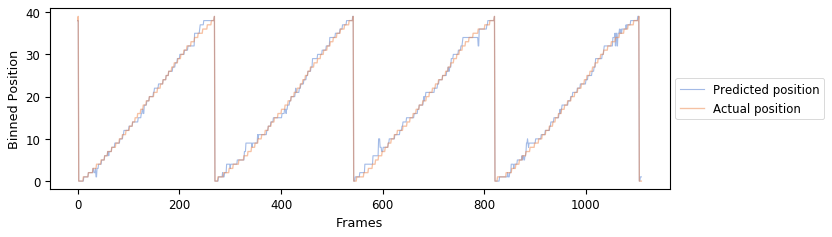

Training without cell 209
1110/1110 [==============================] - 0s 12us/step

Accuracy of test set:: 53.60%


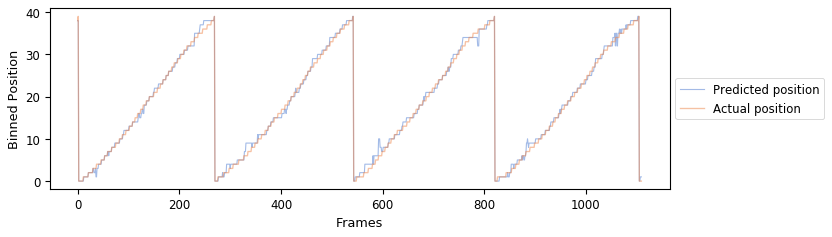

Training without cell 210
1110/1110 [==============================] - 0s 14us/step

Accuracy of test set:: 52.07%


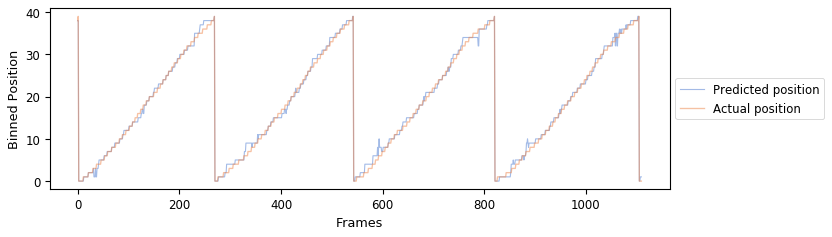

Training without cell 211
1110/1110 [==============================] - 0s 8us/step

Accuracy of test set:: 53.33%


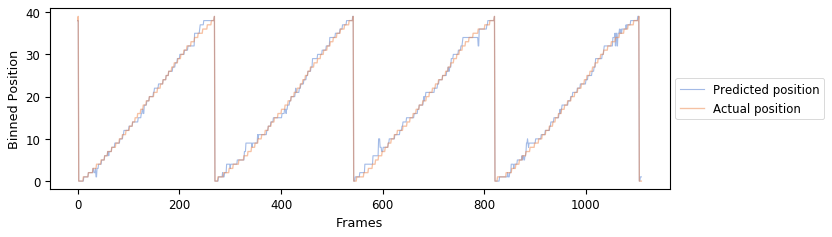

Training without cell 212
1110/1110 [==============================] - 0s 9us/step

Accuracy of test set:: 53.42%


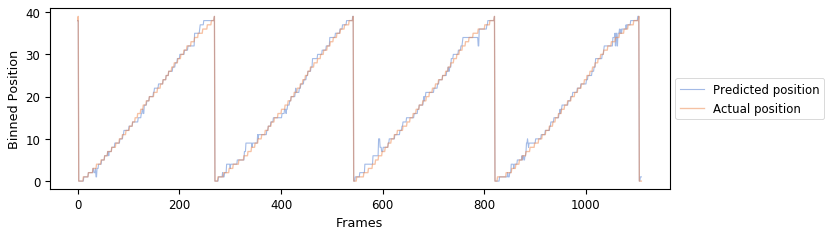

Training without cell 213
1110/1110 [==============================] - 0s 9us/step

Accuracy of test set:: 52.52%


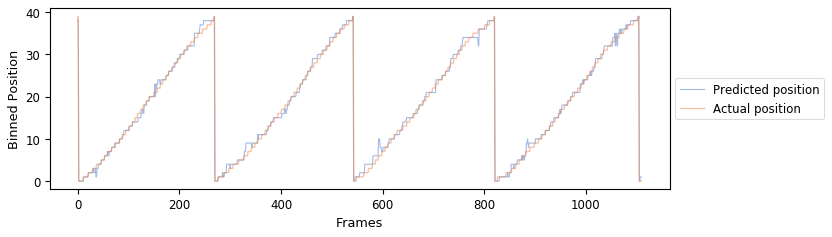

Training without cell 214
1110/1110 [==============================] - 0s 19us/step

Accuracy of test set:: 53.24%


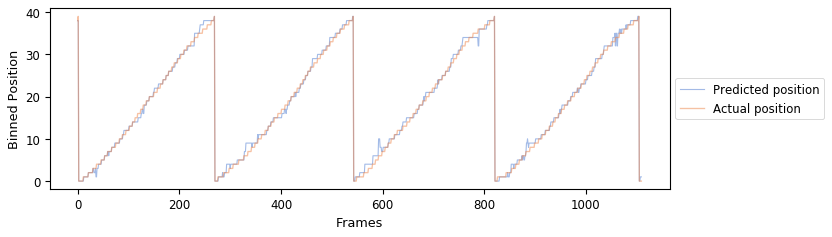

Training without cell 215
1110/1110 [==============================] - 0s 7us/step

Accuracy of test set:: 53.33%


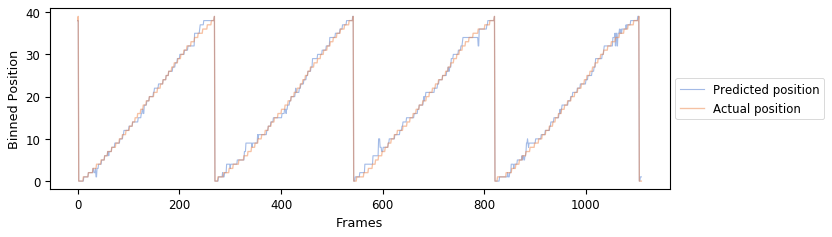

Training without cell 216
1110/1110 [==============================] - 0s 8us/step

Accuracy of test set:: 53.87%


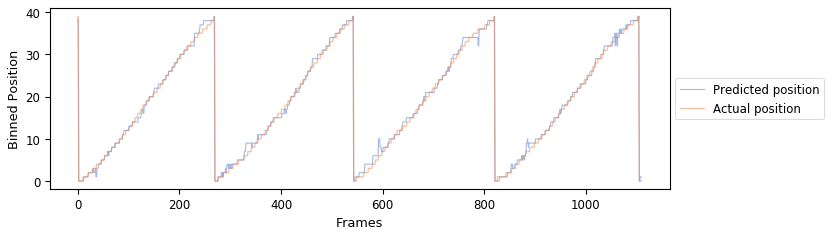

Training without cell 217
1110/1110 [==============================] - 0s 17us/step

Accuracy of test set:: 53.33%


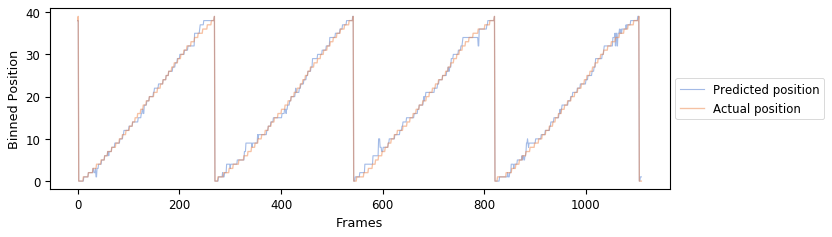

Training without cell 218
1110/1110 [==============================] - 0s 9us/step

Accuracy of test set:: 52.52%


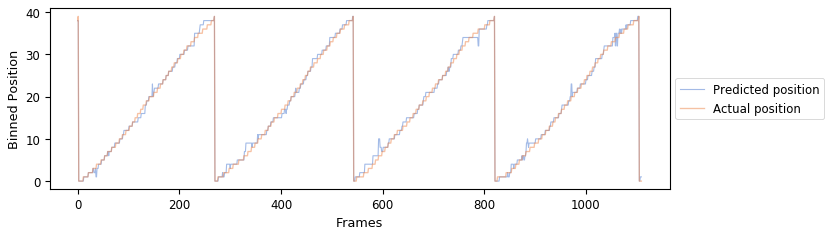

Training without cell 219
1110/1110 [==============================] - 0s 17us/step

Accuracy of test set:: 53.33%


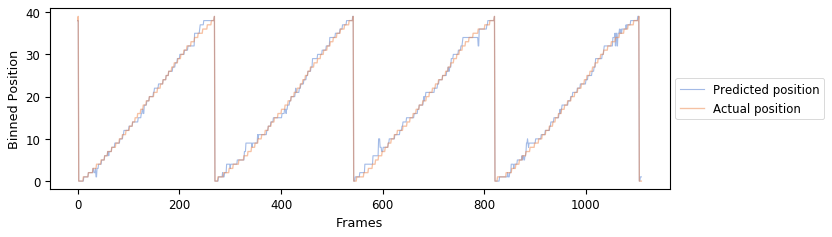

Training without cell 220
1110/1110 [==============================] - 0s 12us/step

Accuracy of test set:: 53.33%


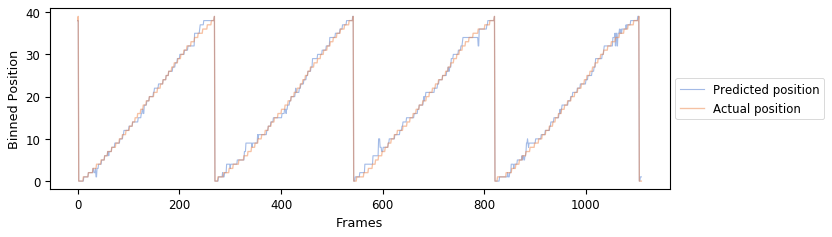

Training without cell 221
1110/1110 [==============================] - 0s 16us/step

Accuracy of test set:: 53.33%


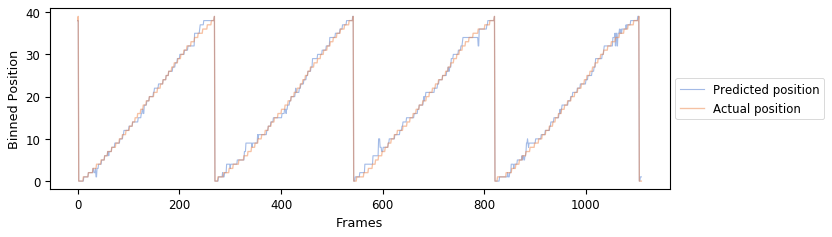

Training without cell 222
1110/1110 [==============================] - 0s 15us/step

Accuracy of test set:: 53.78%


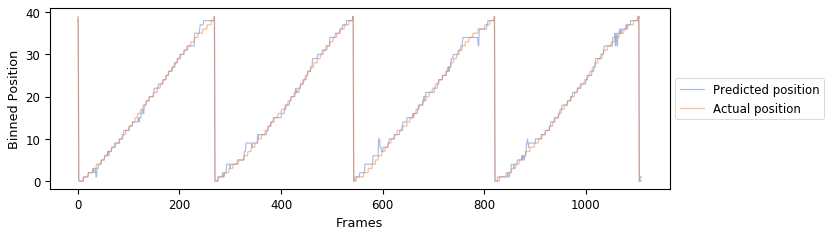

Training without cell 223
1110/1110 [==============================] - 0s 9us/step

Accuracy of test set:: 53.06%


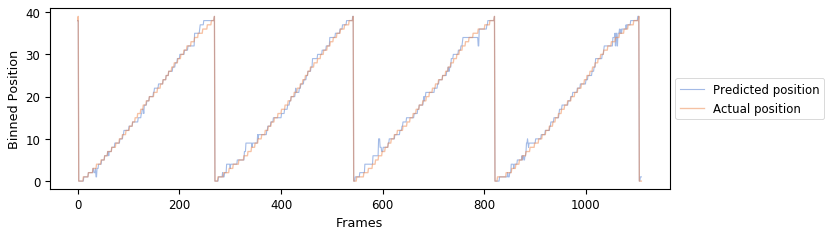

Training without cell 224
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 53.33%


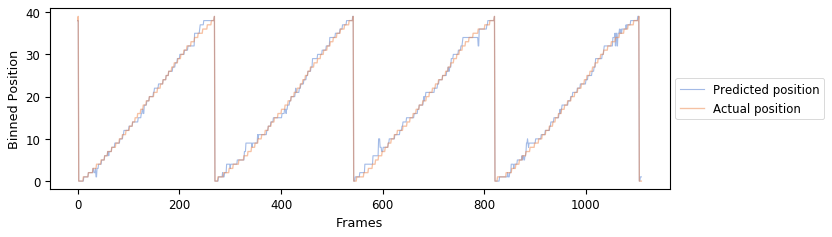

Training without cell 225
1110/1110 [==============================] - 0s 27us/step

Accuracy of test set:: 53.33%


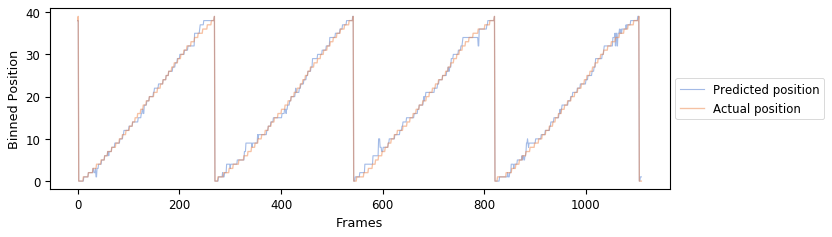

Training without cell 226
1110/1110 [==============================] - 0s 9us/step

Accuracy of test set:: 54.32%


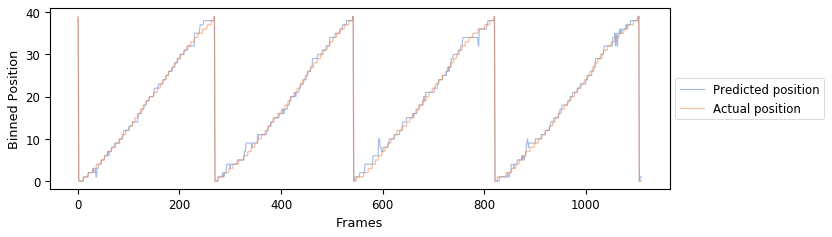

Training without cell 227
1110/1110 [==============================] - 0s 12us/step

Accuracy of test set:: 53.33%


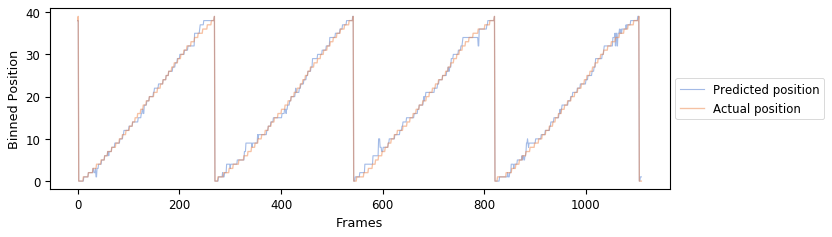

Training without cell 228
1110/1110 [==============================] - 0s 11us/step

Accuracy of test set:: 53.42%


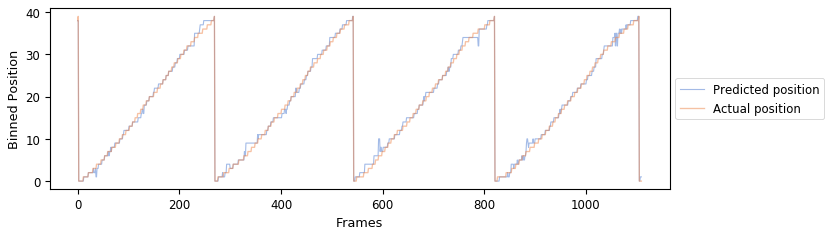

Training without cell 229
1110/1110 [==============================] - 0s 11us/step

Accuracy of test set:: 53.42%


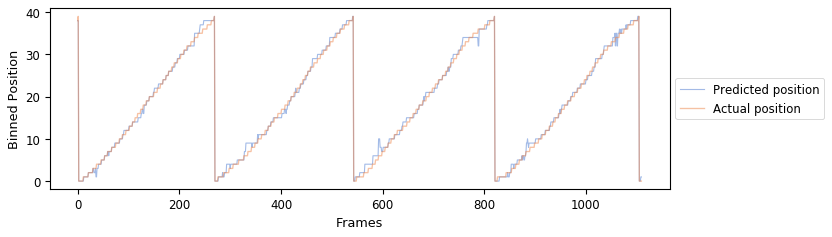

Training without cell 230
1110/1110 [==============================] - 0s 11us/step

Accuracy of test set:: 53.33%


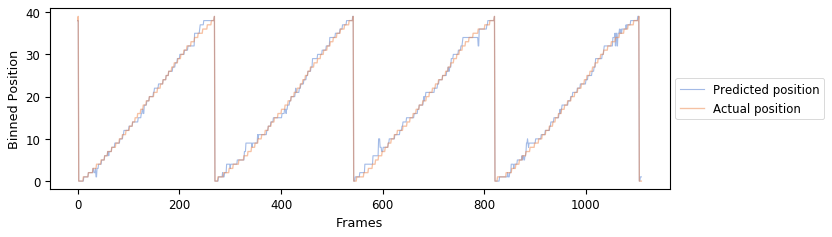

Training without cell 231
1110/1110 [==============================] - 0s 9us/step

Accuracy of test set:: 53.33%


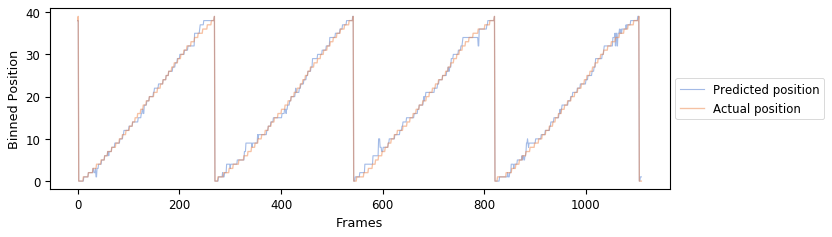

Training without cell 232
1110/1110 [==============================] - 0s 23us/step

Accuracy of test set:: 53.33%


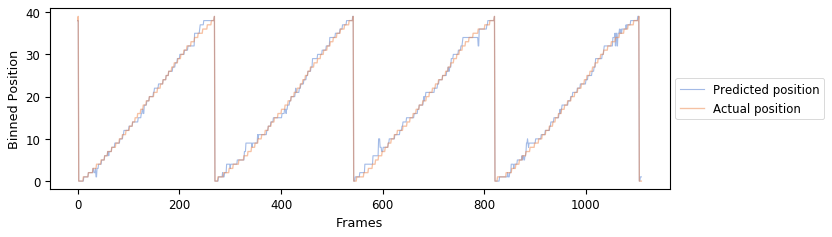

Training without cell 233
1110/1110 [==============================] - 0s 13us/step

Accuracy of test set:: 53.33%


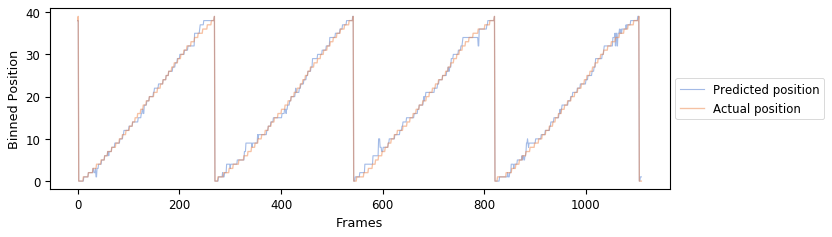

Training without cell 234
1110/1110 [==============================] - 0s 14us/step

Accuracy of test set:: 53.33%


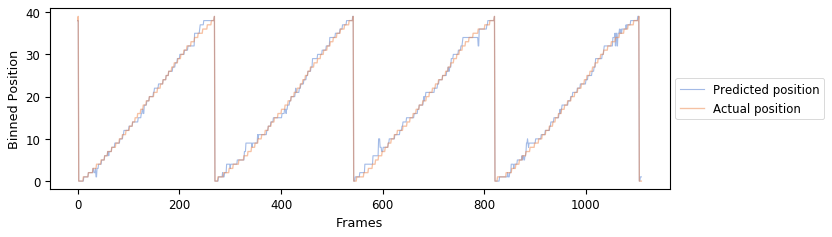

Training without cell 235
1110/1110 [==============================] - 0s 8us/step

Accuracy of test set:: 53.33%


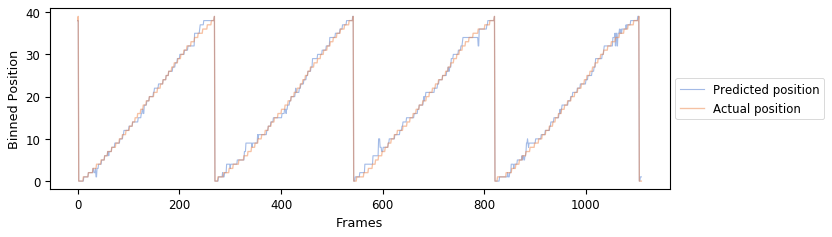

Training without cell 236
1110/1110 [==============================] - 0s 8us/step

Accuracy of test set:: 53.15%


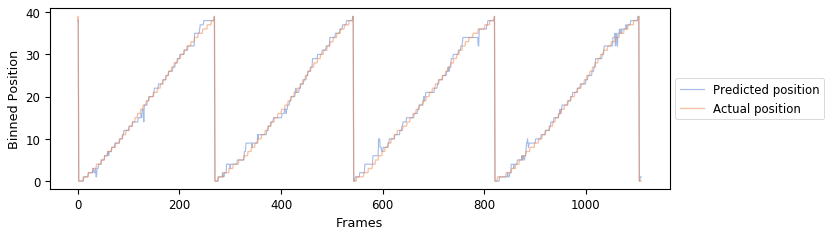

Training without cell 237
1110/1110 [==============================] - 0s 32us/step

Accuracy of test set:: 53.42%


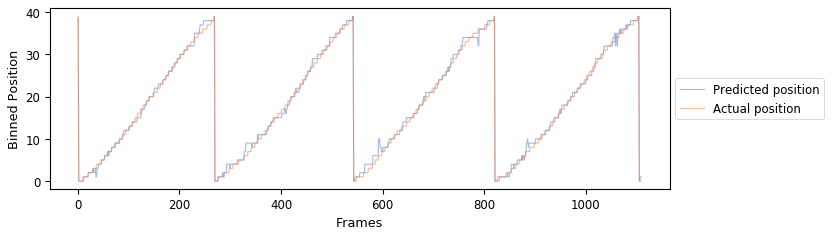

Training without cell 238
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 53.33%


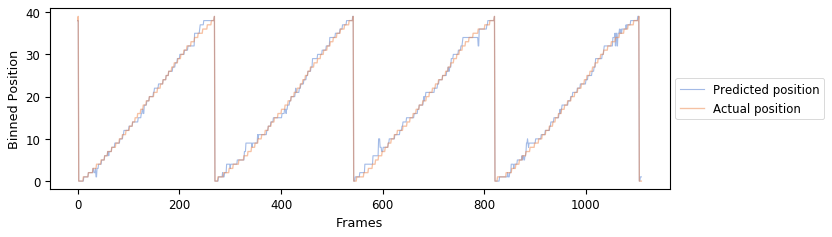

Training without cell 239
1110/1110 [==============================] - 0s 20us/step

Accuracy of test set:: 53.33%


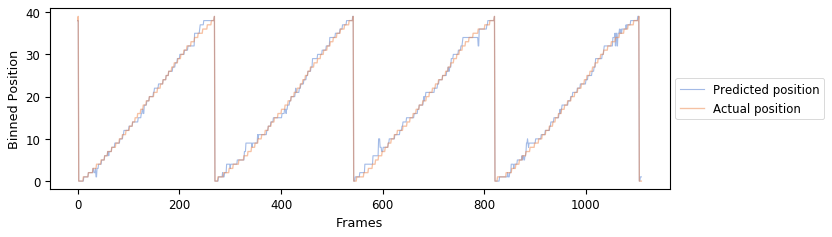

Training without cell 240
1110/1110 [==============================] - 0s 9us/step

Accuracy of test set:: 53.69%


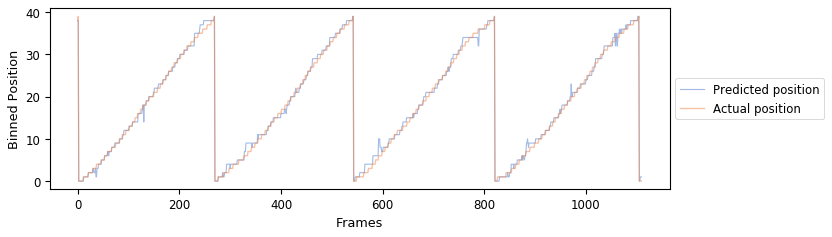

Training without cell 241
1110/1110 [==============================] - 0s 9us/step

Accuracy of test set:: 52.70%


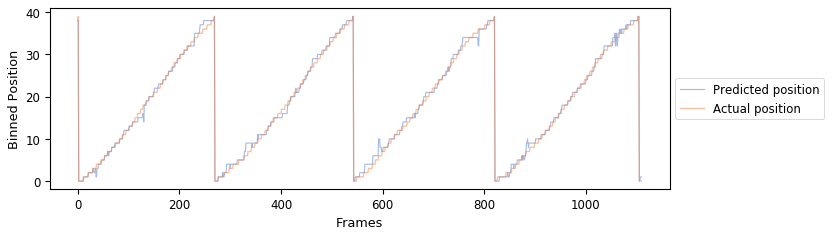

Training without cell 242
1110/1110 [==============================] - 0s 12us/step

Accuracy of test set:: 53.33%


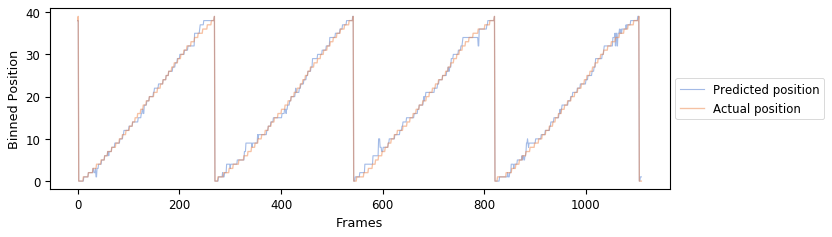

Training without cell 243
1110/1110 [==============================] - 0s 13us/step

Accuracy of test set:: 53.33%


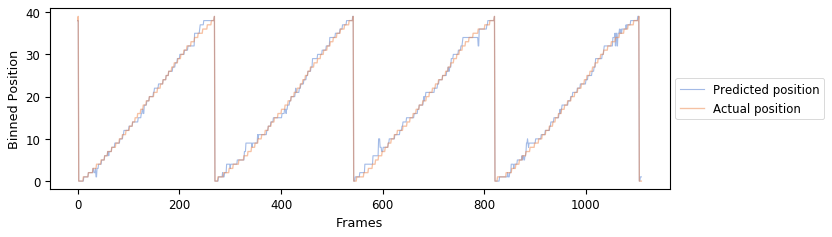

Training without cell 244
1110/1110 [==============================] - 0s 11us/step

Accuracy of test set:: 53.42%


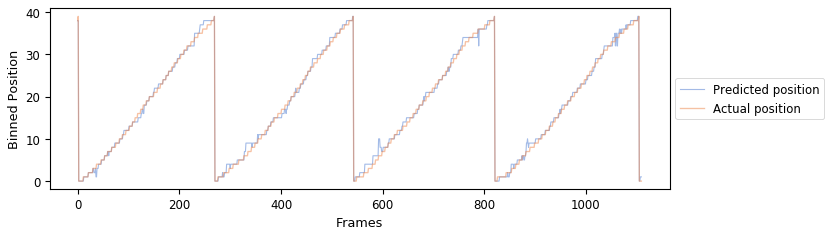

Training without cell 245
1110/1110 [==============================] - 0s 15us/step

Accuracy of test set:: 53.33%


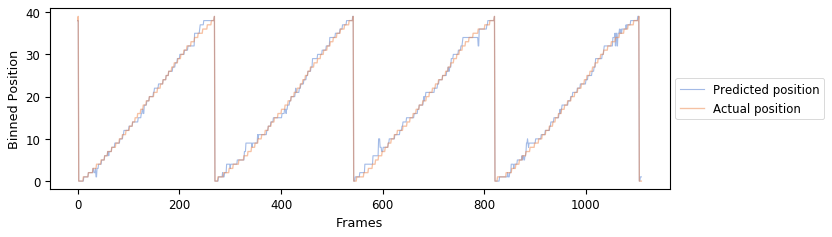

Training without cell 246
1110/1110 [==============================] - 0s 13us/step

Accuracy of test set:: 53.33%


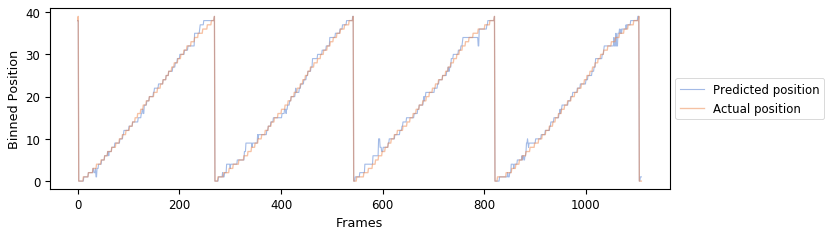

Training without cell 247
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 53.33%


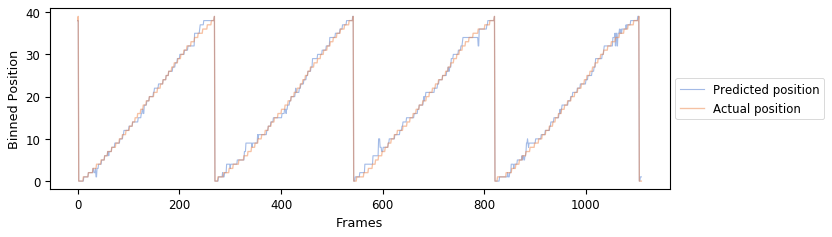

Training without cell 248
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 53.33%


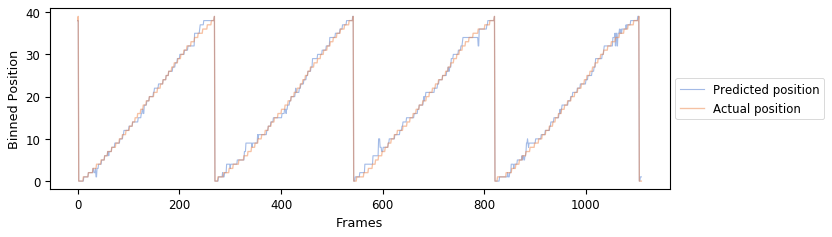

Training without cell 249
1110/1110 [==============================] - 0s 9us/step

Accuracy of test set:: 53.33%


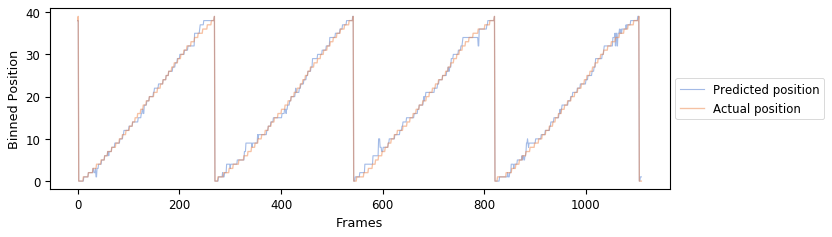

Training without cell 250
1110/1110 [==============================] - 0s 9us/step

Accuracy of test set:: 53.33%


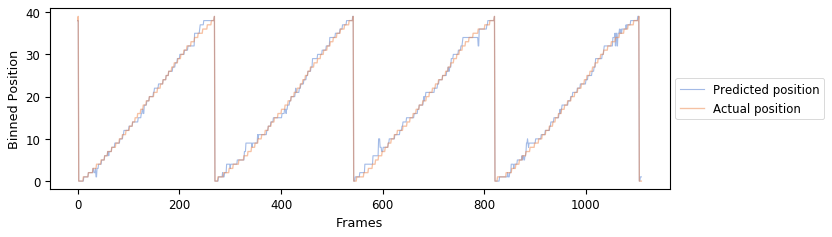

Training without cell 251
1110/1110 [==============================] - 0s 14us/step

Accuracy of test set:: 53.33%


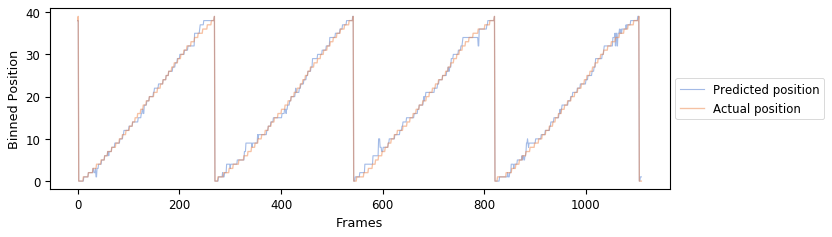

Training without cell 252
1110/1110 [==============================] - 0s 9us/step

Accuracy of test set:: 53.33%


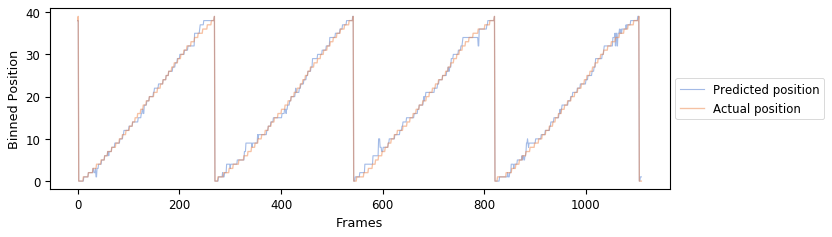

Training without cell 253
1110/1110 [==============================] - 0s 12us/step

Accuracy of test set:: 53.33%


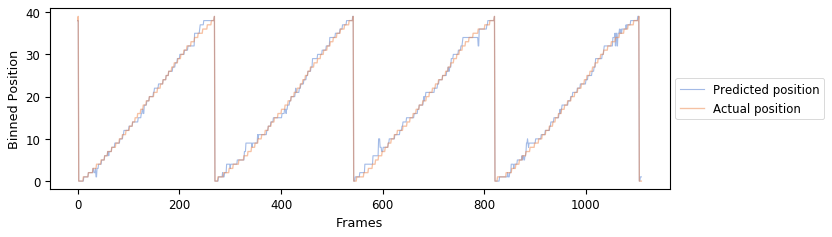

Training without cell 254
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 53.33%


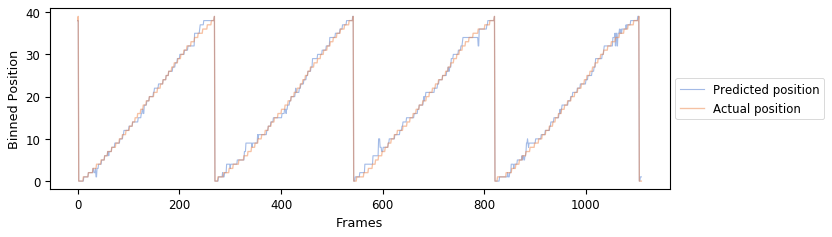

Training without cell 255
1110/1110 [==============================] - 0s 9us/step

Accuracy of test set:: 53.42%


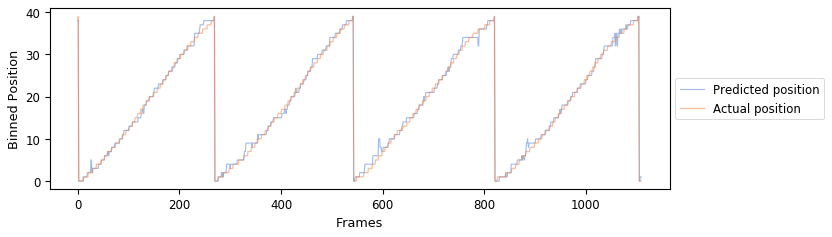

Training without cell 256
1110/1110 [==============================] - 0s 9us/step

Accuracy of test set:: 53.33%


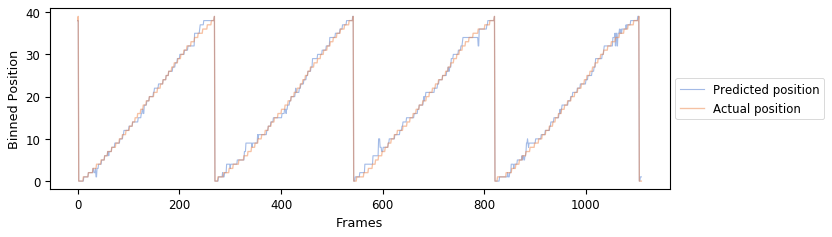

Training without cell 257
1110/1110 [==============================] - 0s 23us/step

Accuracy of test set:: 52.79%


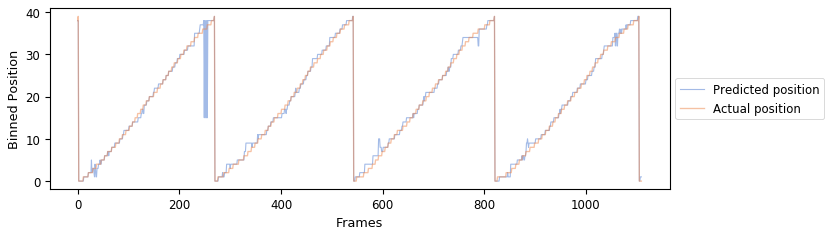

Training without cell 258
1110/1110 [==============================] - 0s 8us/step

Accuracy of test set:: 53.33%


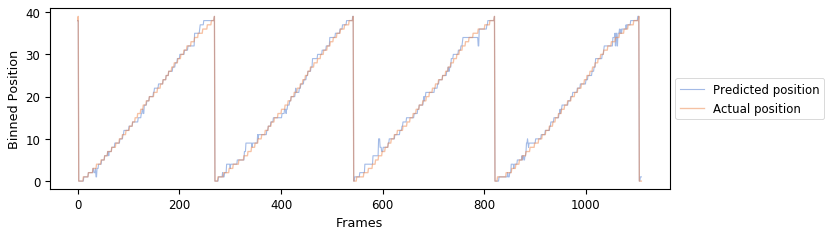

Training without cell 259
1110/1110 [==============================] - 0s 11us/step

Accuracy of test set:: 52.79%


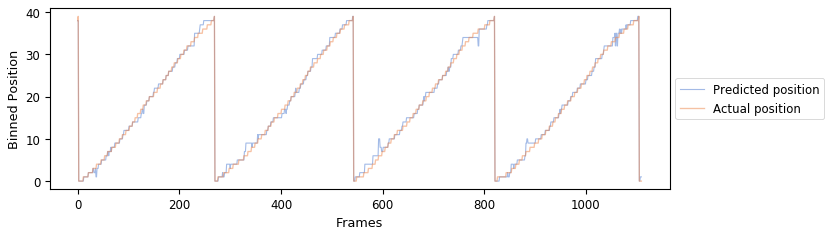

Training without cell 260
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 51.71%


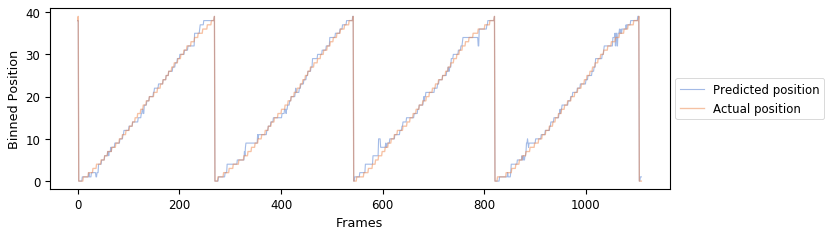

Training without cell 261
1110/1110 [==============================] - 0s 23us/step

Accuracy of test set:: 53.33%


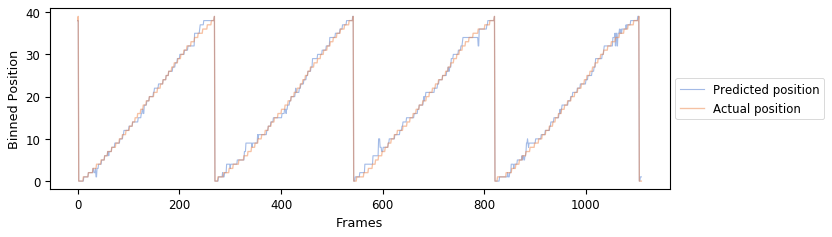

Training without cell 262
1110/1110 [==============================] - 0s 12us/step

Accuracy of test set:: 52.97%


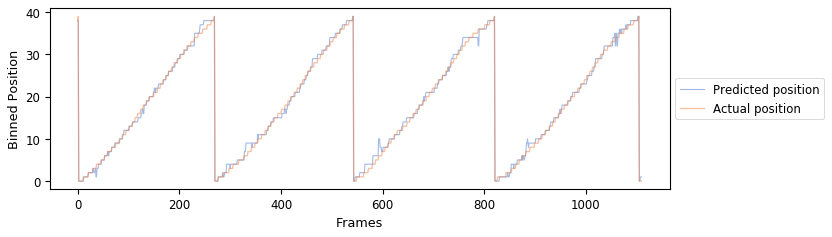

Training without cell 263
1110/1110 [==============================] - 0s 14us/step

Accuracy of test set:: 53.33%


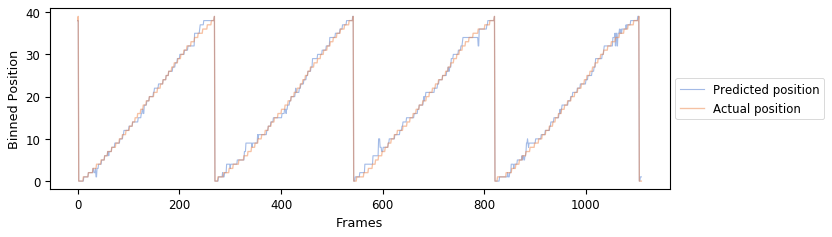

Training without cell 264
1110/1110 [==============================] - 0s 8us/step

Accuracy of test set:: 53.51%


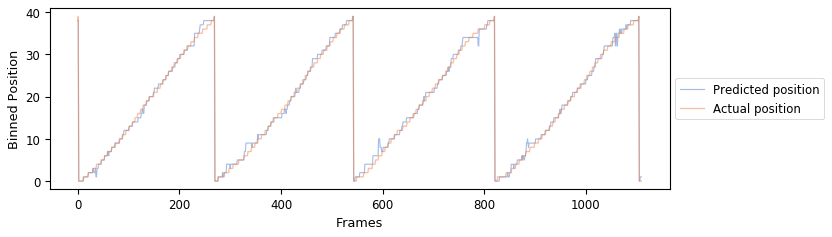

Training without cell 265
1110/1110 [==============================] - 0s 11us/step

Accuracy of test set:: 53.06%


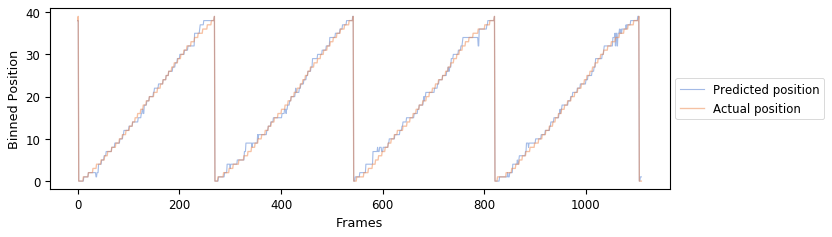

Training without cell 266
1110/1110 [==============================] - 0s 9us/step

Accuracy of test set:: 53.42%


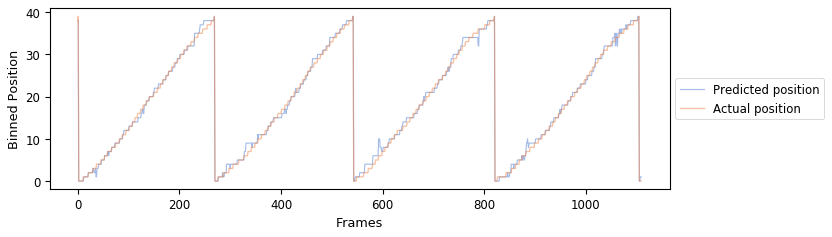

Training without cell 267
1110/1110 [==============================] - 0s 17us/step

Accuracy of test set:: 53.33%


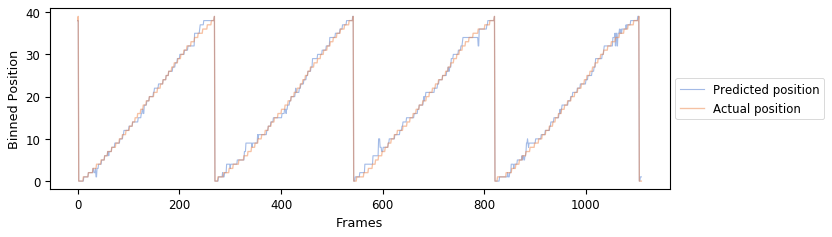

Training without cell 268
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 53.33%


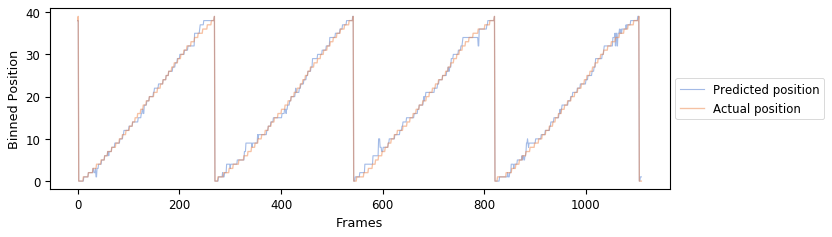

Training without cell 269
1110/1110 [==============================] - 0s 27us/step

Accuracy of test set:: 53.42%


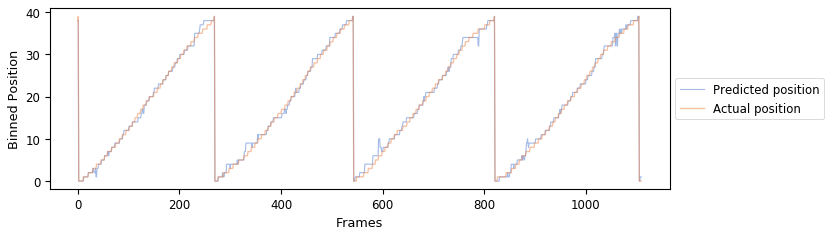

Training without cell 270
1110/1110 [==============================] - 0s 8us/step

Accuracy of test set:: 53.06%


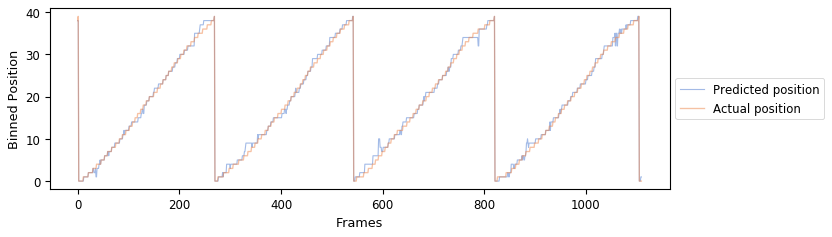

Training without cell 271
1110/1110 [==============================] - 0s 13us/step

Accuracy of test set:: 52.70%


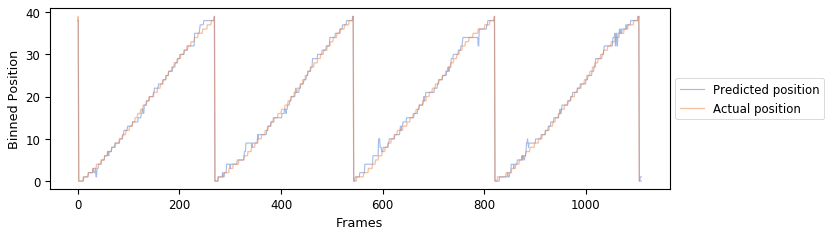

Training without cell 272
1110/1110 [==============================] - 0s 17us/step

Accuracy of test set:: 53.33%


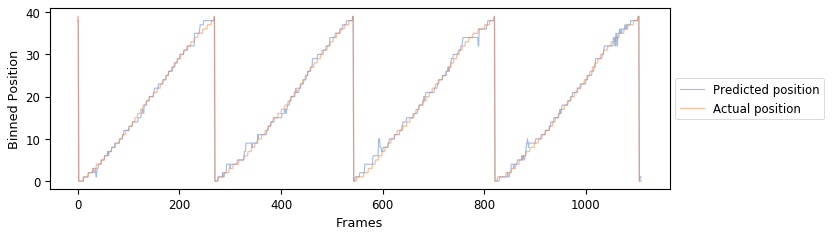

Training without cell 273
1110/1110 [==============================] - 0s 12us/step

Accuracy of test set:: 53.33%


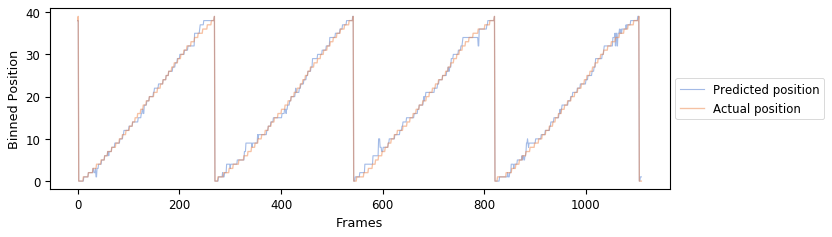

Training without cell 274
1110/1110 [==============================] - 0s 13us/step

Accuracy of test set:: 53.33%


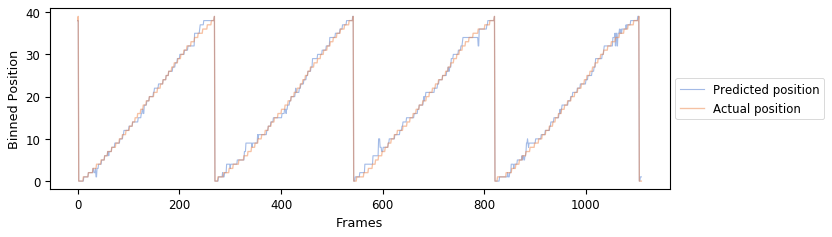

Training without cell 275
1110/1110 [==============================] - 0s 16us/step

Accuracy of test set:: 53.33%


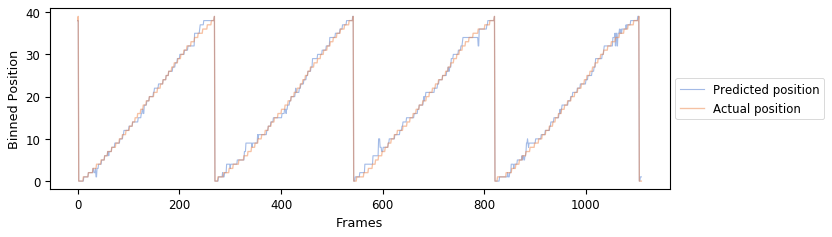

Training without cell 276
1110/1110 [==============================] - 0s 22us/step

Accuracy of test set:: 52.79%


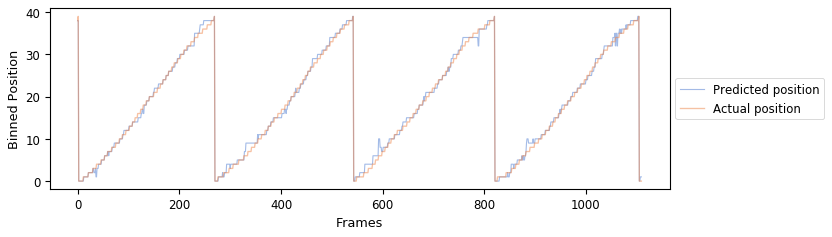

Training without cell 277
1110/1110 [==============================] - 0s 20us/step

Accuracy of test set:: 53.33%


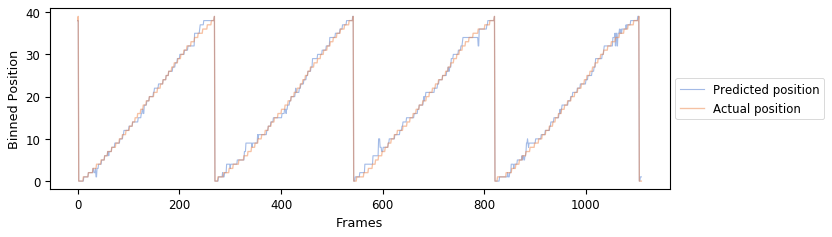

Training without cell 278
1110/1110 [==============================] - 0s 21us/step

Accuracy of test set:: 52.43%


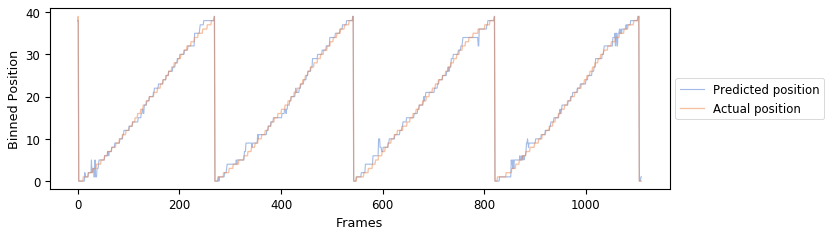

Training without cell 279
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 53.33%


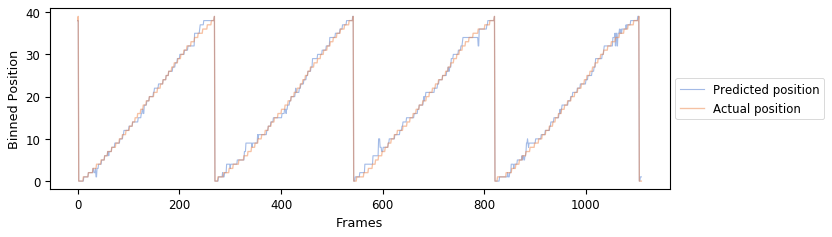

Training without cell 280
1110/1110 [==============================] - 0s 19us/step

Accuracy of test set:: 53.33%


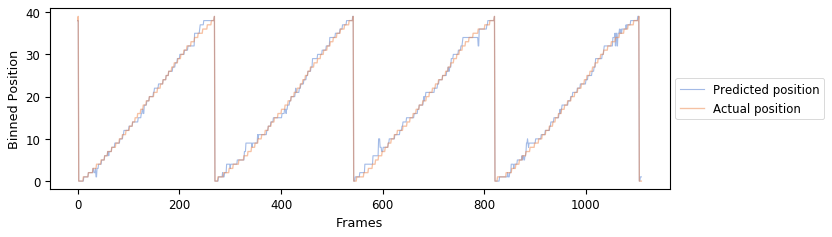

Training without cell 281
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 53.33%


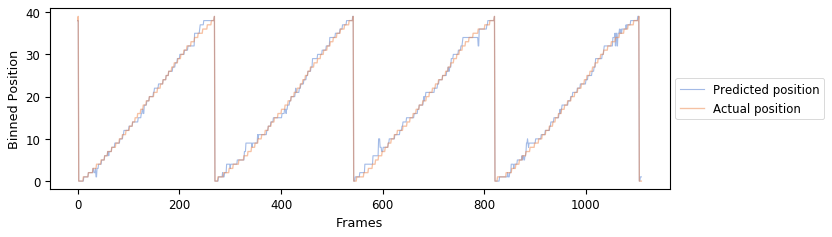

Training without cell 282
1110/1110 [==============================] - 0s 13us/step

Accuracy of test set:: 55.05%


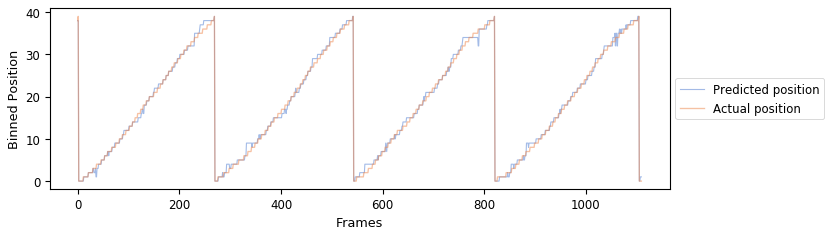

Training without cell 283
1110/1110 [==============================] - 0s 9us/step

Accuracy of test set:: 52.52%


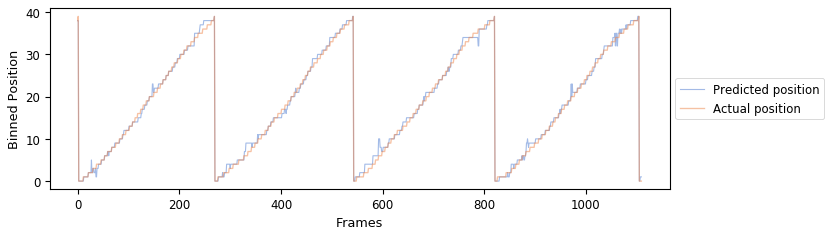

Training without cell 284
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 53.33%


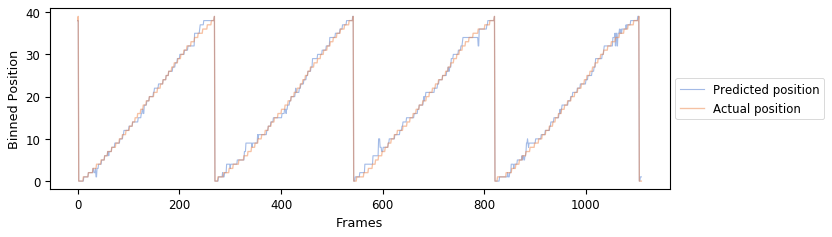

Training without cell 285
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 53.42%


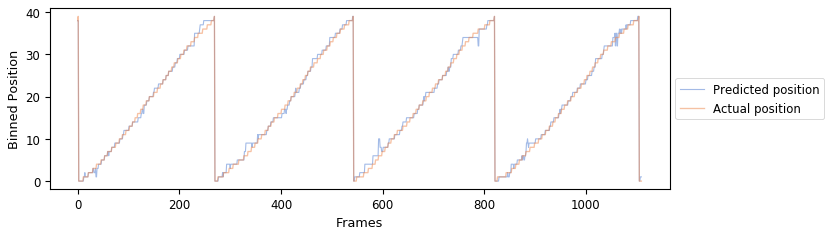

Training without cell 286
1110/1110 [==============================] - 0s 11us/step

Accuracy of test set:: 52.70%


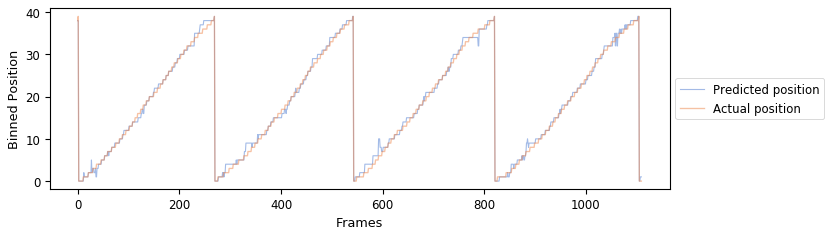

Training without cell 287
1110/1110 [==============================] - 0s 11us/step

Accuracy of test set:: 53.51%


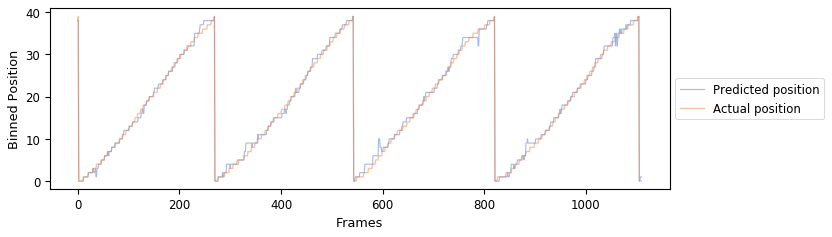

Training without cell 288
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 53.33%


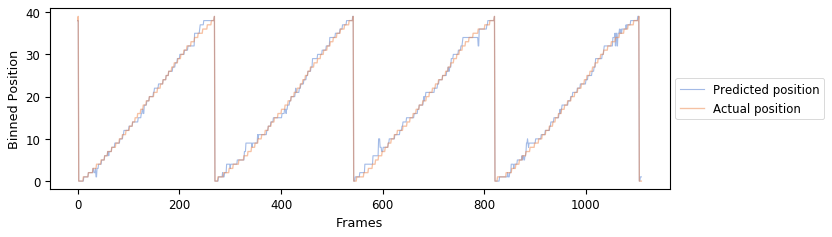

Training without cell 289
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 54.14%


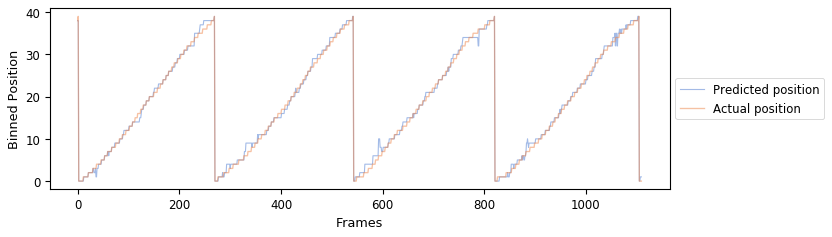

Training without cell 290
1110/1110 [==============================] - 0s 9us/step

Accuracy of test set:: 53.15%


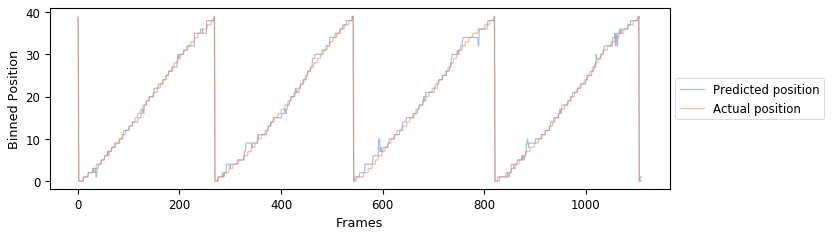

Training without cell 291
1110/1110 [==============================] - 0s 14us/step

Accuracy of test set:: 53.69%


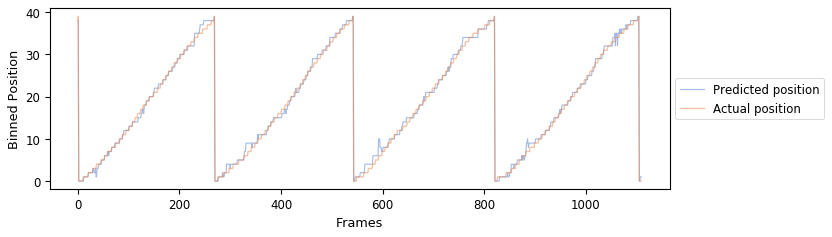

Training without cell 292
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 53.24%


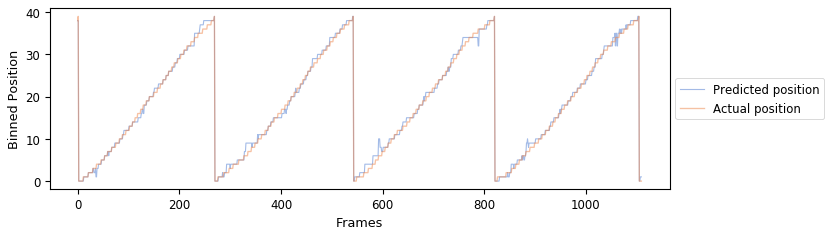

Training without cell 293
1110/1110 [==============================] - 0s 9us/step

Accuracy of test set:: 52.79%


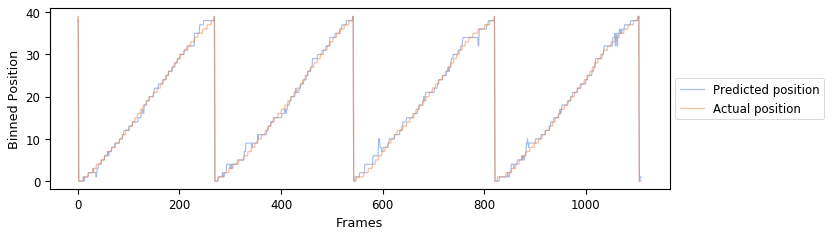

Training without cell 294
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 51.98%


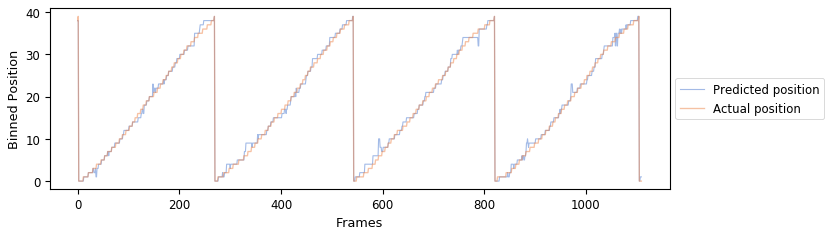

Training without cell 295
1110/1110 [==============================] - 0s 13us/step

Accuracy of test set:: 53.33%


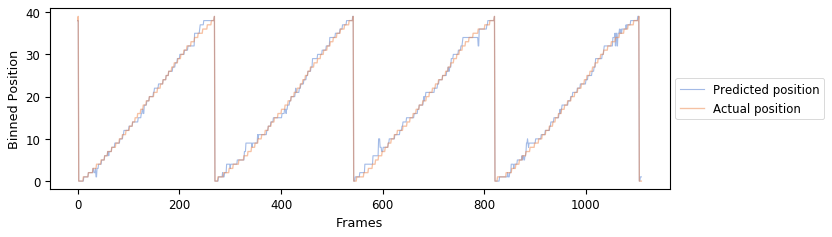

Training without cell 296
1110/1110 [==============================] - 0s 9us/step

Accuracy of test set:: 53.51%


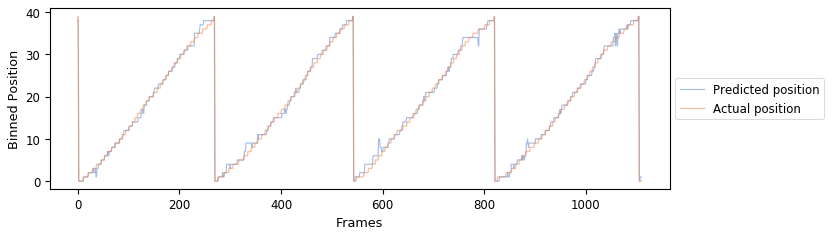

Training without cell 297
1110/1110 [==============================] - 0s 12us/step

Accuracy of test set:: 52.79%


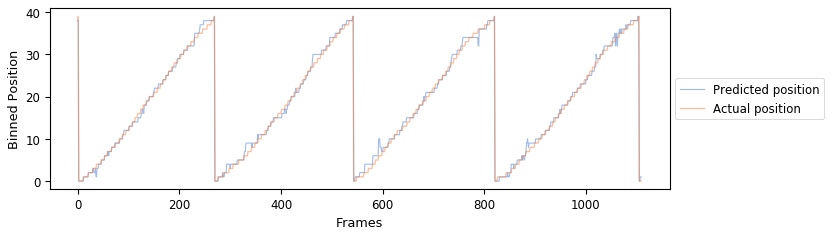

Training without cell 298
1110/1110 [==============================] - 0s 11us/step

Accuracy of test set:: 53.51%


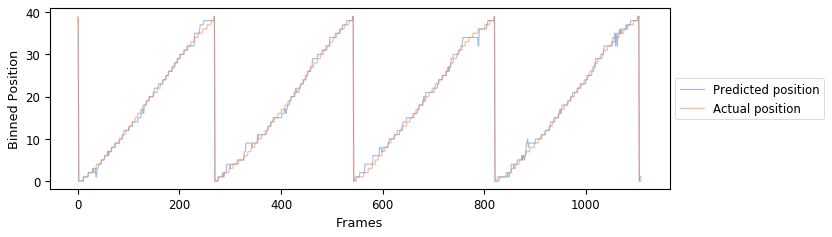

Training without cell 299
1110/1110 [==============================] - 0s 21us/step

Accuracy of test set:: 53.15%


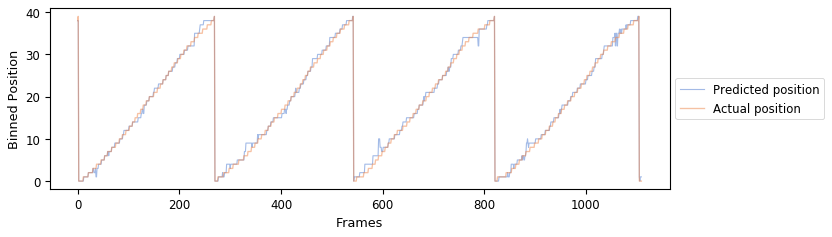

Training without cell 300
1110/1110 [==============================] - 0s 7us/step

Accuracy of test set:: 52.61%


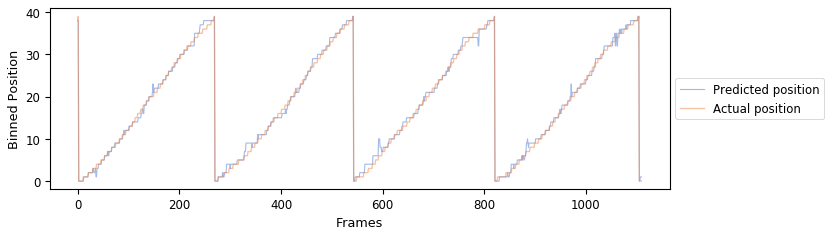

Training without cell 301
1110/1110 [==============================] - 0s 9us/step

Accuracy of test set:: 53.15%


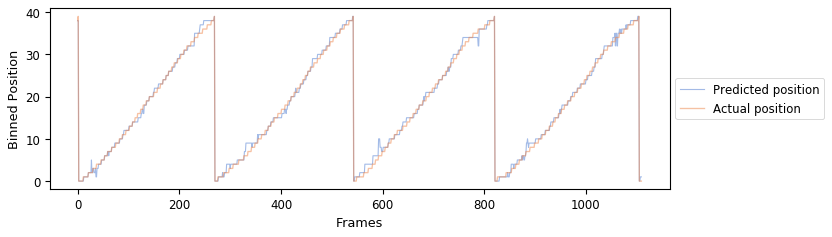

Training without cell 302
1110/1110 [==============================] - 0s 11us/step

Accuracy of test set:: 52.97%


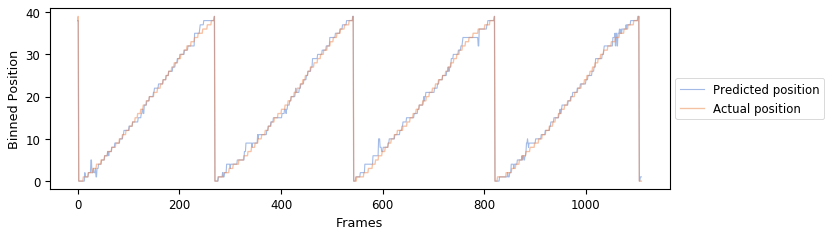

Training without cell 303
1110/1110 [==============================] - 0s 15us/step

Accuracy of test set:: 52.88%


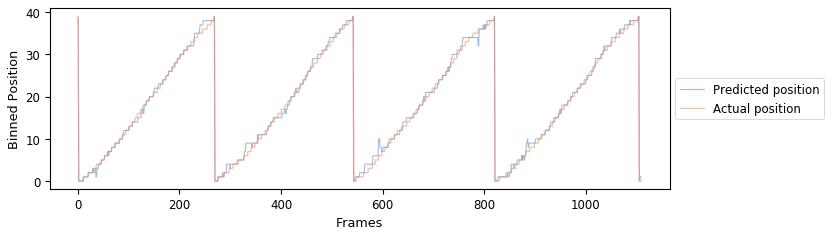

Training without cell 304
1110/1110 [==============================] - 0s 13us/step

Accuracy of test set:: 53.33%


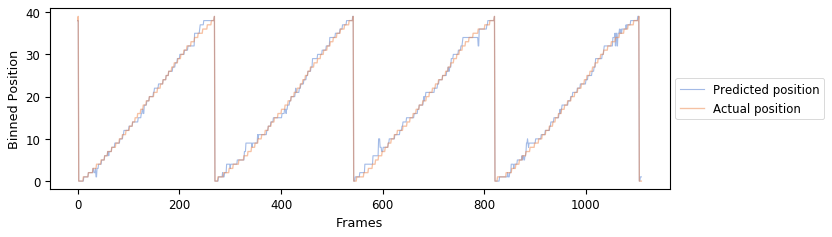

Training without cell 305
1110/1110 [==============================] - 0s 11us/step

Accuracy of test set:: 53.33%


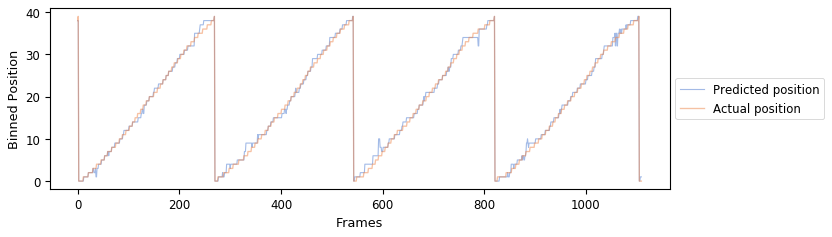

Training without cell 306
1110/1110 [==============================] - 0s 11us/step

Accuracy of test set:: 53.33%


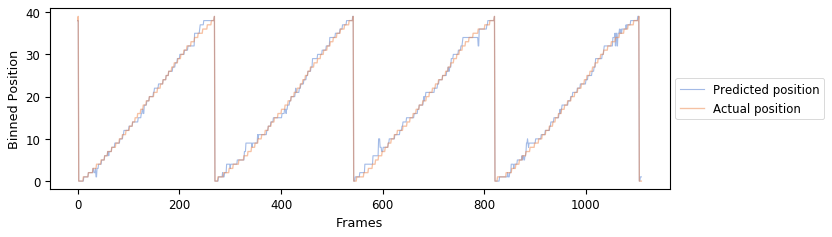

Training without cell 307
1110/1110 [==============================] - 0s 12us/step

Accuracy of test set:: 53.33%


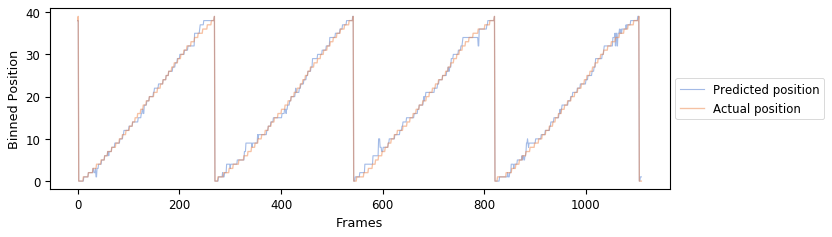

Training without cell 308
1110/1110 [==============================] - 0s 11us/step

Accuracy of test set:: 53.51%


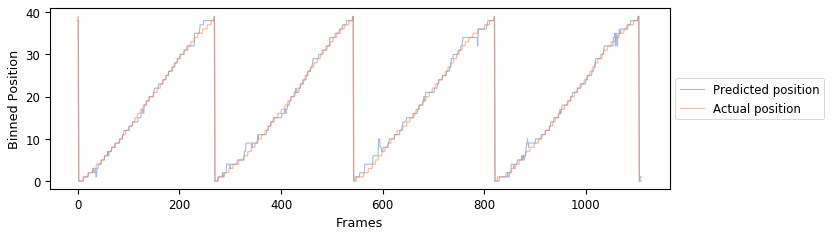

Training without cell 309
1110/1110 [==============================] - 0s 12us/step

Accuracy of test set:: 53.33%


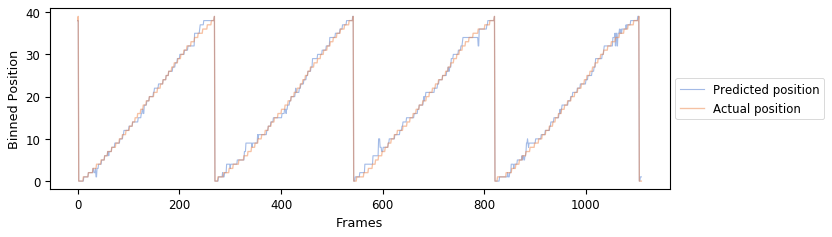

Training without cell 310
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 53.42%


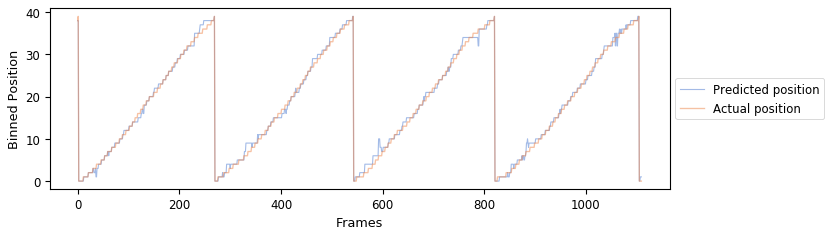

Training without cell 311
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 53.33%


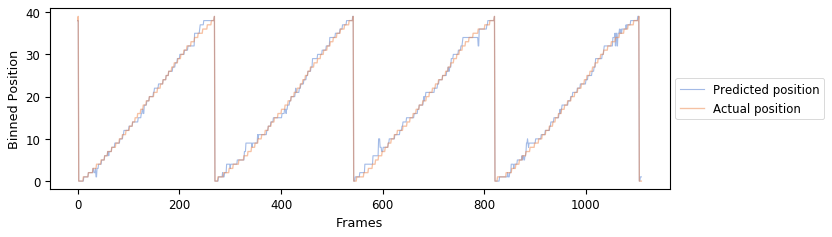

Training without cell 312
1110/1110 [==============================] - 0s 11us/step

Accuracy of test set:: 53.24%


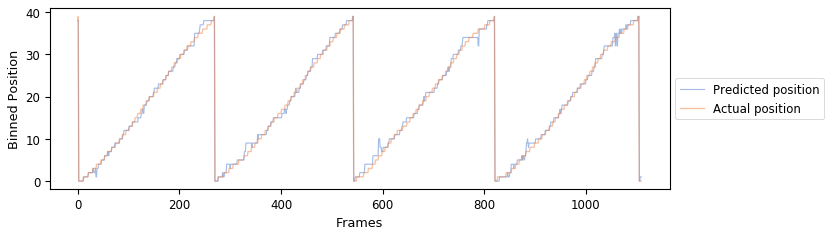

Training without cell 313
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 52.16%


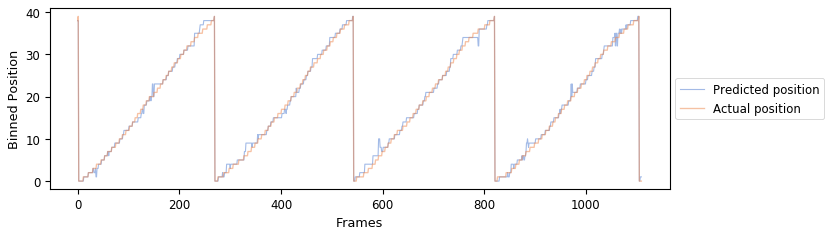

Training without cell 314
1110/1110 [==============================] - 0s 16us/step

Accuracy of test set:: 53.42%


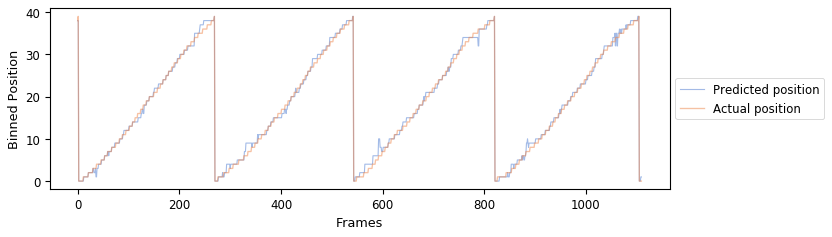

Training without cell 315
1110/1110 [==============================] - 0s 19us/step

Accuracy of test set:: 53.24%


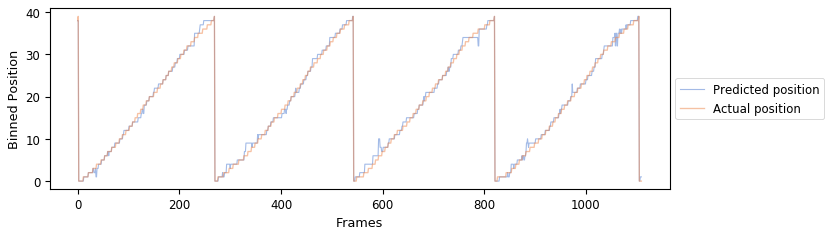

In [44]:
R2_withoutcell = np.zeros((np.size(X, 1)))
rho_withoutcell = np.zeros((np.size(X, 1)))
for c in np.arange(np.size(X, 1)):
    print(f'Training without cell %d' %c)
    X_leaveout = copy(X_lo_test)
    X_leaveout[:, c] = 0
    score, prediction = n.validate_model(densennmodel, X_leaveout, y_lo_test, plot_figure=1)
    R2_withoutcell[c] = m.get_R2(np.argmax(y_lo_test, 1), prediction)
    rho_withoutcell[c] = m.get_rho(np.argmax(y_lo_test, 1), prediction)

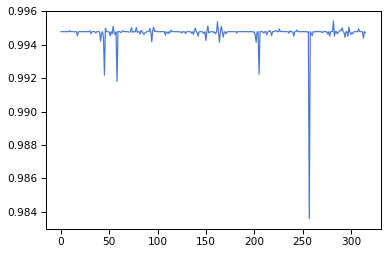

In [45]:
plt.plot(R2_withoutcell)

In [46]:
# Save ground truth
np.savez(os.path.join(SaveResults, 'leaveonecellout.npz'), R2=R2_withoutcell, rho=rho_withoutcell)

#### Error rate with just place cells

In [47]:
X_pfs = X[:, A.sig_PFs_cellnum_dict['Task1']]
X_pf_train, X_pf_test, y_pf_train, y_pf_test = train_test_split(X_pfs, y_cat, test_size=0.10, random_state=None, shuffle=False)
print(np.shape(X_pf_train), np.shape(X_pf_test), np.shape(y_pf_train), np.shape(y_pf_test))

(9990, 92) (1110, 92) (9990, 40) (1110, 40)


Fitting Model
9990/9990 [==============================] - 1s 54us/step

Accuracy of training set: 81.06%
1110/1110 [==============================] - 0s 17us/step

Accuracy of test set:: 49.82%


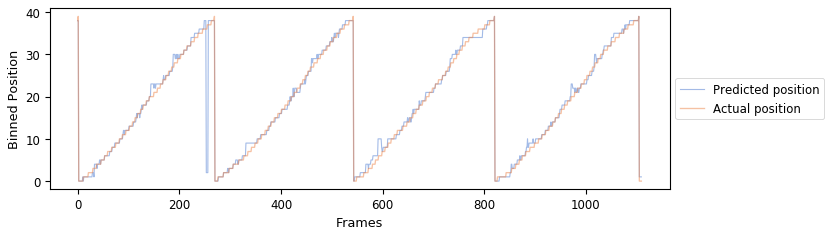

R2: 0.96
rho: 0.98


In [48]:
densennmodel = n.fit_model(X_pf_train, y_pf_train)
score, prediction = n.validate_model(densennmodel, X_pf_test, y_pf_test, plot_figure=1)
R2 = m.get_R2(np.argmax(y_pf_test, 1), prediction)
rho = m.get_rho(np.argmax(y_pf_test, 1), prediction)
print(f'R2: %.2f' %R2)
print(f'rho: %.2f' %rho)

In [49]:
# serialize model to JSON
model_json = densennmodel.to_json()
with open(os.path.join(SaveResults, "Modelwithplacecells.json"), "w") as json_file:
    json_file.write(model_json)
# serialize weights to HDF5
densennmodel.save_weights(os.path.join(SaveResults, "Modelwithplacecells.h5"))

In [50]:
# Save ground truth
np.savez(os.path.join(SaveResults, 'Modelwithplacecellsparams.npz'), 
         X_train=X_pf_train, X_test=X_pf_test, y_train=y_pf_train, y_test=y_pf_test,
        placecells=X_pfs, dropout = dropout, epochs = epochs, units = units, batch_size = batch_size, R2=R2, rho=rho)

#### Leave one place cell out

In [51]:
X_pfs = X[:, A.sig_PFs_cellnum_dict['Task1']]
X_pf_train, X_pf_test, y_pf_train, y_pf_test = train_test_split(X_pfs, y_cat, test_size=0.10, random_state=None, shuffle=False)

In [52]:
densennmodel = n.fit_model(X_pf_train, y_pf_train)

Fitting Model
9990/9990 [==============================] - 1s 57us/step

Accuracy of training set: 81.26%


Testing without cell 0
1110/1110 [==============================] - 0s 5us/step

Accuracy of test set:: 47.75%


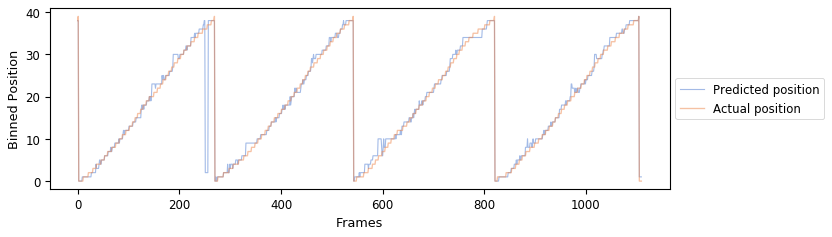

Testing without cell 1
1110/1110 [==============================] - 0s 15us/step

Accuracy of test set:: 48.29%


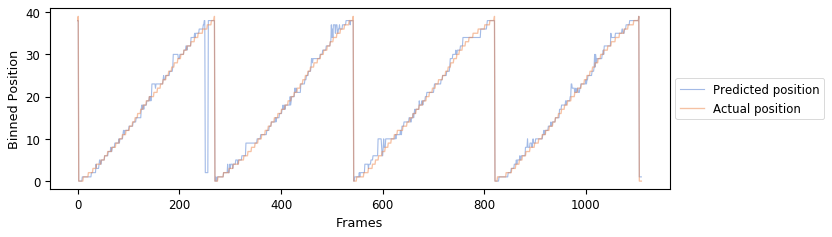

Testing without cell 2
1110/1110 [==============================] - 0s 9us/step

Accuracy of test set:: 48.02%


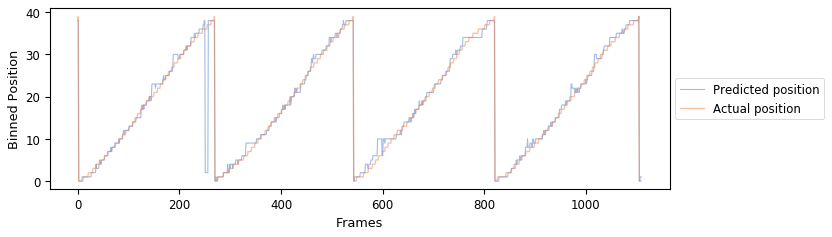

Testing without cell 3
1110/1110 [==============================] - 0s 18us/step

Accuracy of test set:: 46.94%


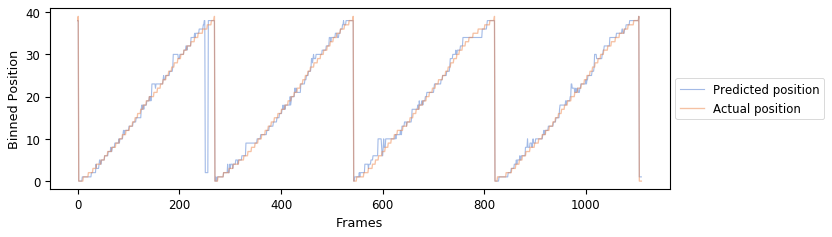

Testing without cell 4
1110/1110 [==============================] - 0s 11us/step

Accuracy of test set:: 48.11%


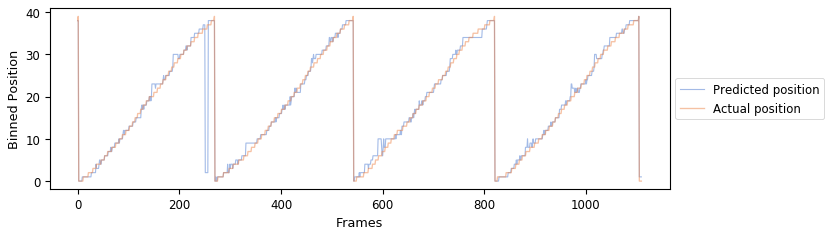

Testing without cell 5
1110/1110 [==============================] - 0s 15us/step

Accuracy of test set:: 47.57%


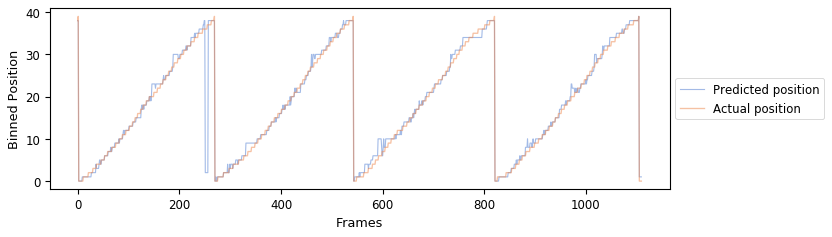

Testing without cell 6
1110/1110 [==============================] - 0s 9us/step

Accuracy of test set:: 47.12%


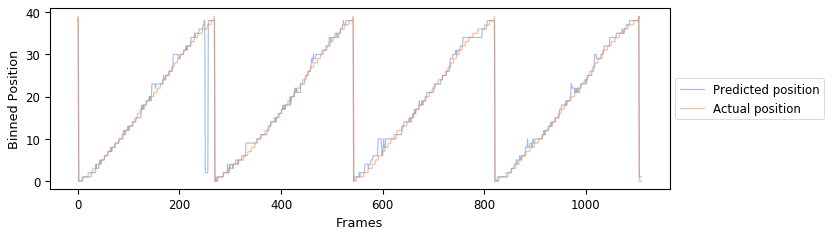

Testing without cell 7
1110/1110 [==============================] - 0s 12us/step

Accuracy of test set:: 46.31%


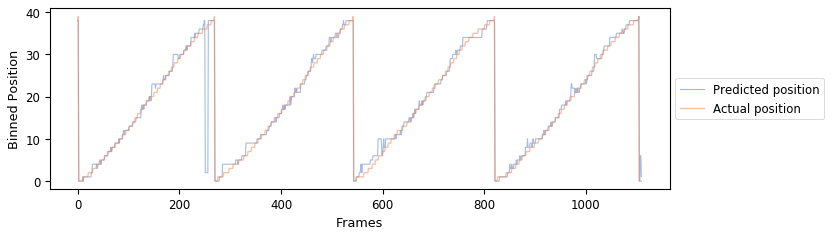

Testing without cell 8
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 48.11%


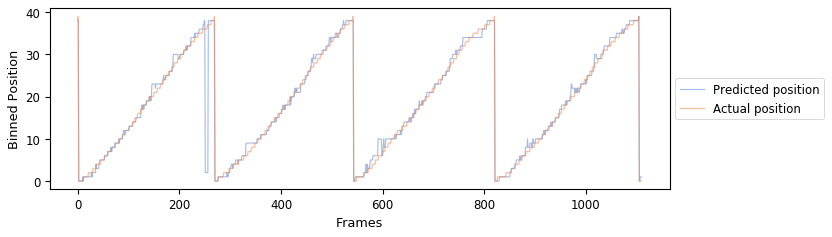

Testing without cell 9
1110/1110 [==============================] - 0s 14us/step

Accuracy of test set:: 48.38%


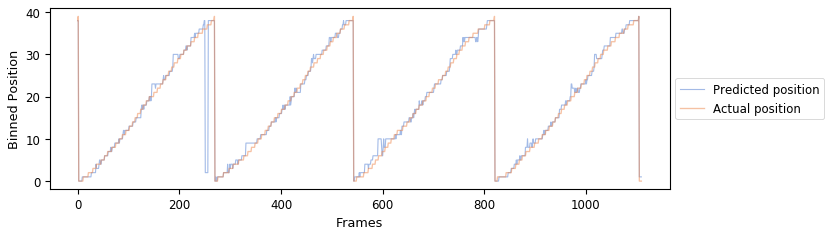

Testing without cell 10
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 47.30%


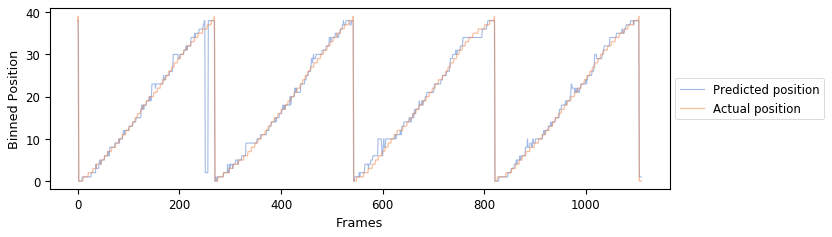

Testing without cell 11
1110/1110 [==============================] - 0s 23us/step

Accuracy of test set:: 47.66%


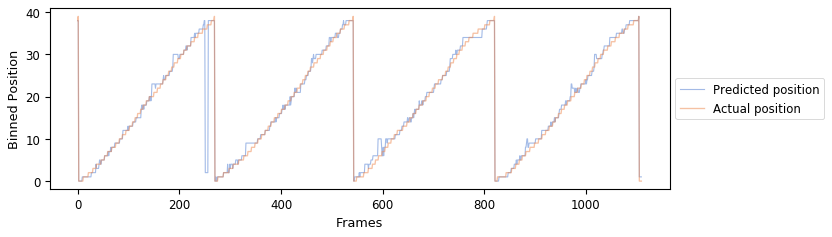

Testing without cell 12
1110/1110 [==============================] - 0s 11us/step

Accuracy of test set:: 48.02%


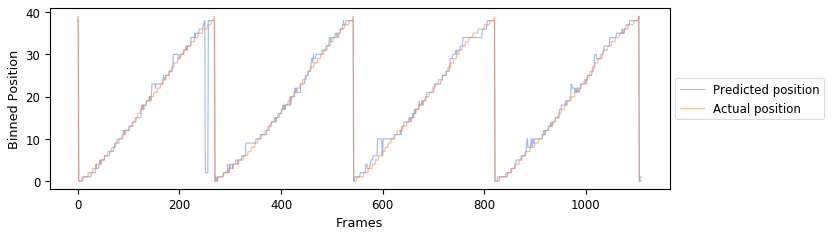

Testing without cell 13
1110/1110 [==============================] - 0s 8us/step

Accuracy of test set:: 48.11%


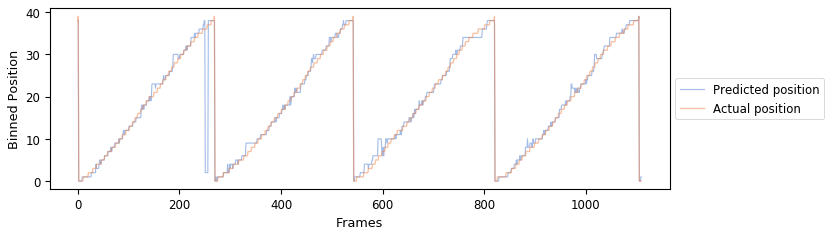

Testing without cell 14
1110/1110 [==============================] - 0s 14us/step

Accuracy of test set:: 47.66%


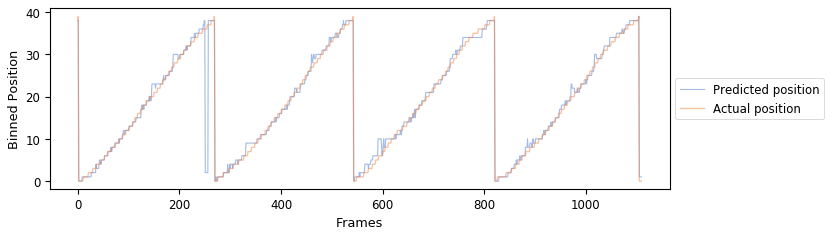

Testing without cell 15
1110/1110 [==============================] - 0s 13us/step

Accuracy of test set:: 47.84%


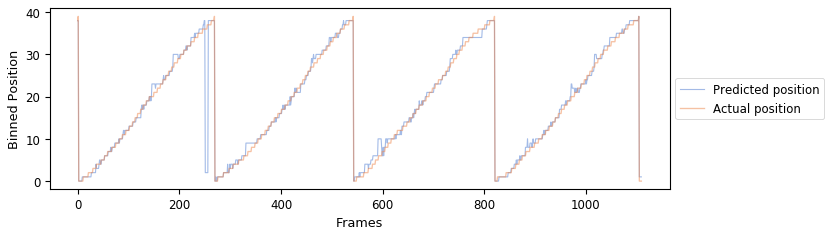

Testing without cell 16
1110/1110 [==============================] - 0s 15us/step

Accuracy of test set:: 48.02%


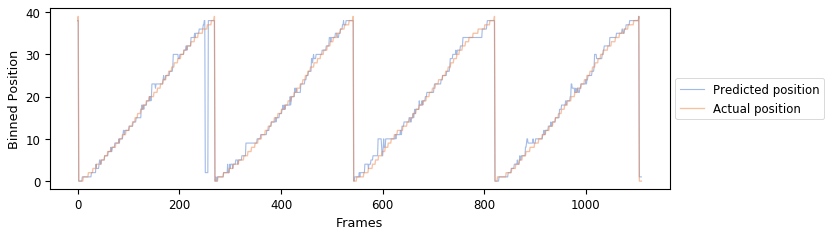

Testing without cell 17
1110/1110 [==============================] - 0s 17us/step

Accuracy of test set:: 47.84%


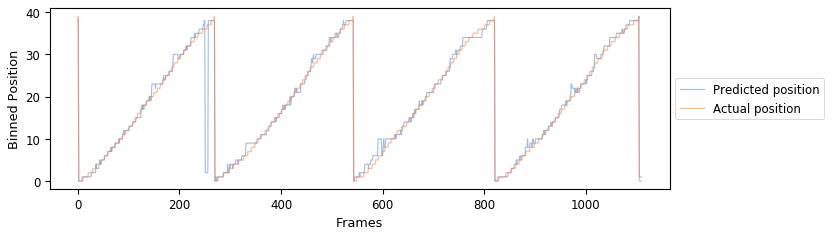

Testing without cell 18
1110/1110 [==============================] - 0s 17us/step

Accuracy of test set:: 47.75%


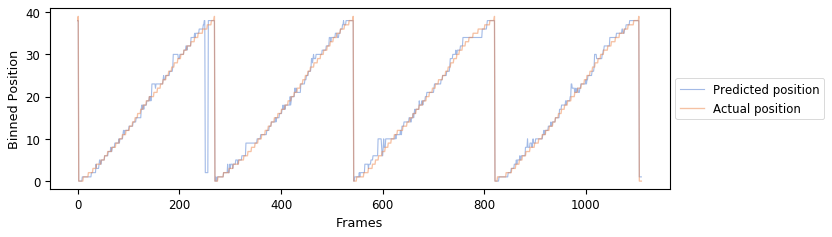

Testing without cell 19
1110/1110 [==============================] - 0s 17us/step

Accuracy of test set:: 46.13%


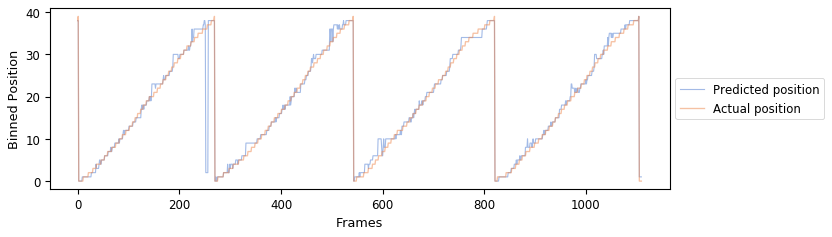

Testing without cell 20
1110/1110 [==============================] - 0s 20us/step

Accuracy of test set:: 48.11%


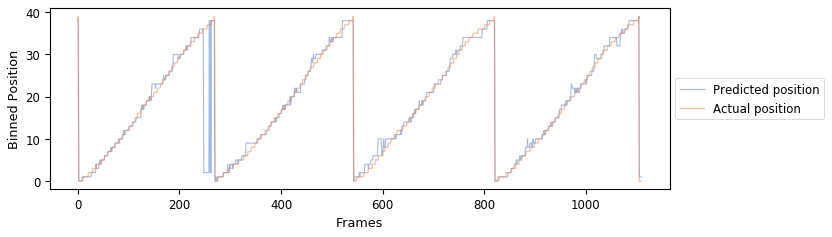

Testing without cell 21
1110/1110 [==============================] - 0s 8us/step

Accuracy of test set:: 47.84%


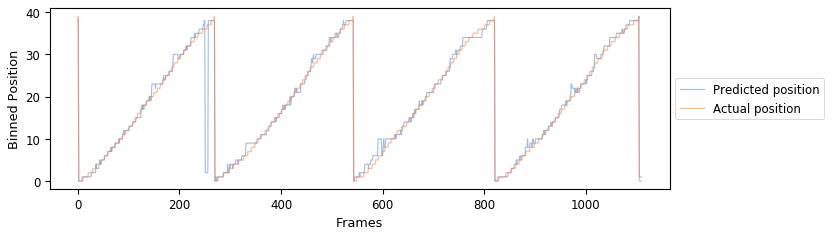

Testing without cell 22
1110/1110 [==============================] - 0s 12us/step

Accuracy of test set:: 47.48%


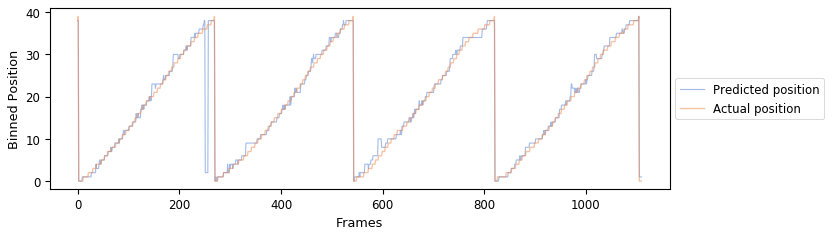

Testing without cell 23
1110/1110 [==============================] - 0s 7us/step

Accuracy of test set:: 46.76%


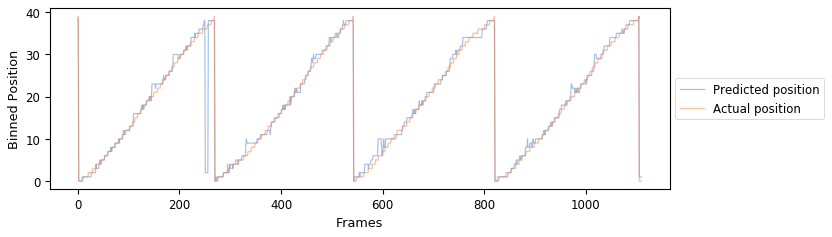

Testing without cell 24
1110/1110 [==============================] - 0s 7us/step

Accuracy of test set:: 47.48%


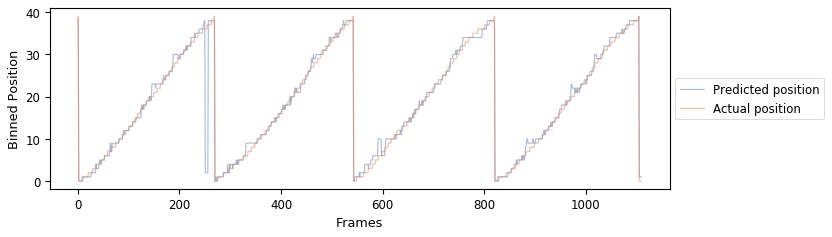

Testing without cell 25
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 46.85%


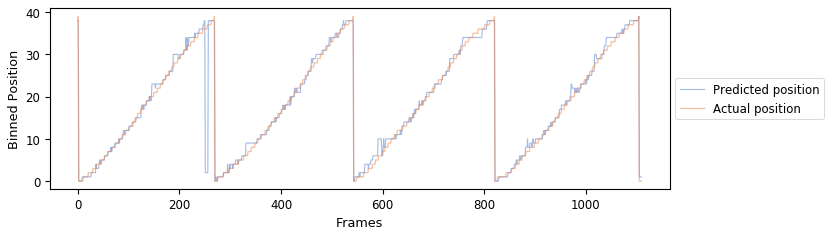

Testing without cell 26
1110/1110 [==============================] - 0s 13us/step

Accuracy of test set:: 45.32%


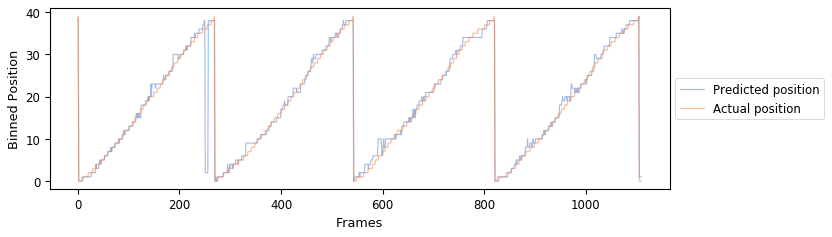

Testing without cell 27
1110/1110 [==============================] - 0s 11us/step

Accuracy of test set:: 47.30%


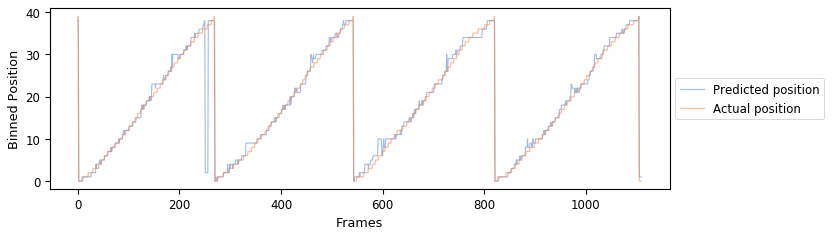

Testing without cell 28
1110/1110 [==============================] - 0s 12us/step

Accuracy of test set:: 48.56%


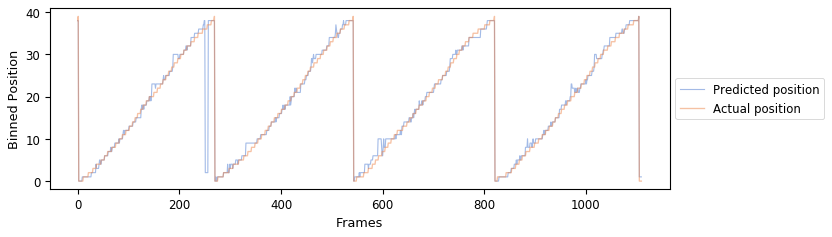

Testing without cell 29
1110/1110 [==============================] - 0s 6us/step

Accuracy of test set:: 47.12%


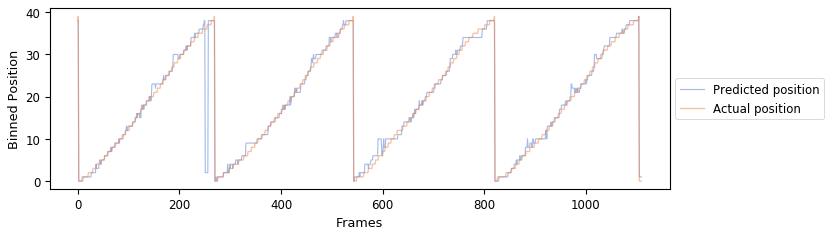

Testing without cell 30
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 47.84%


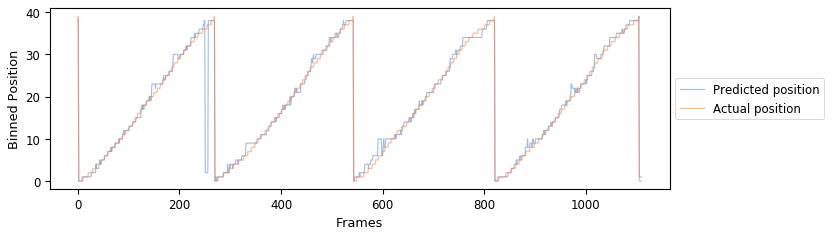

Testing without cell 31
1110/1110 [==============================] - 0s 12us/step

Accuracy of test set:: 47.39%


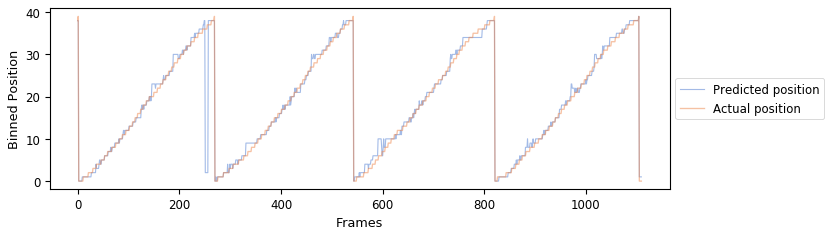

Testing without cell 32
1110/1110 [==============================] - 0s 12us/step

Accuracy of test set:: 47.21%


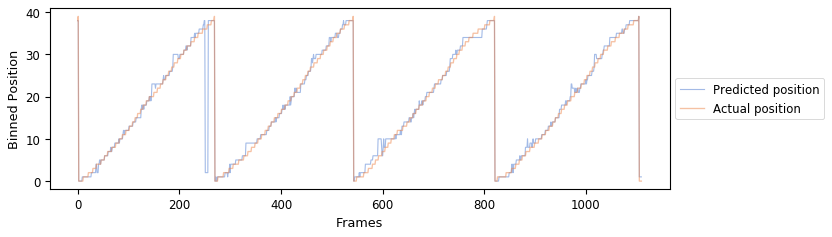

Testing without cell 33
1110/1110 [==============================] - 0s 9us/step

Accuracy of test set:: 47.21%


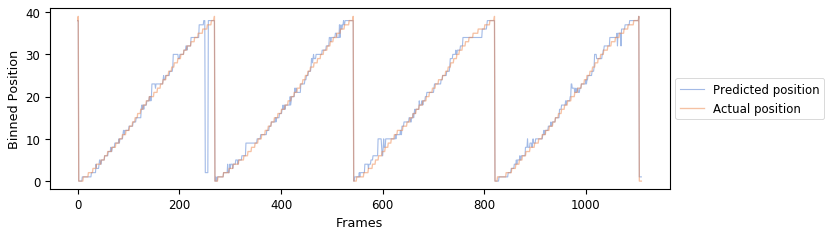

Testing without cell 34
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 45.68%


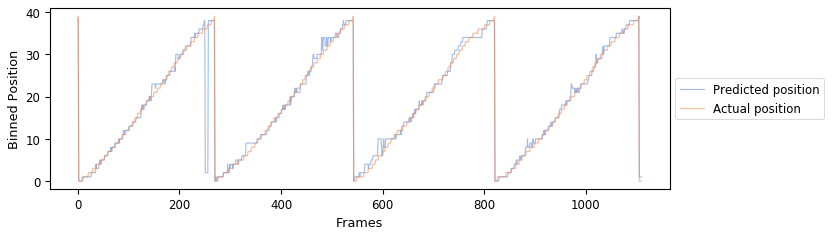

Testing without cell 35
1110/1110 [==============================] - 0s 17us/step

Accuracy of test set:: 47.57%


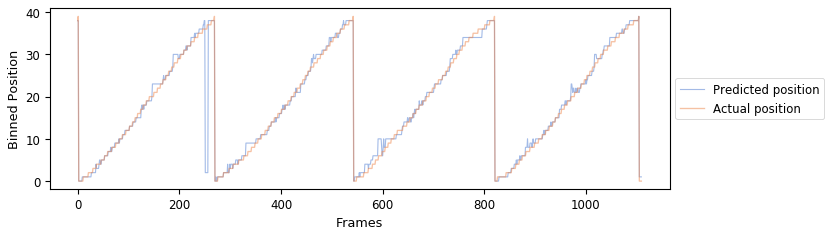

Testing without cell 36
1110/1110 [==============================] - 0s 17us/step

Accuracy of test set:: 47.75%


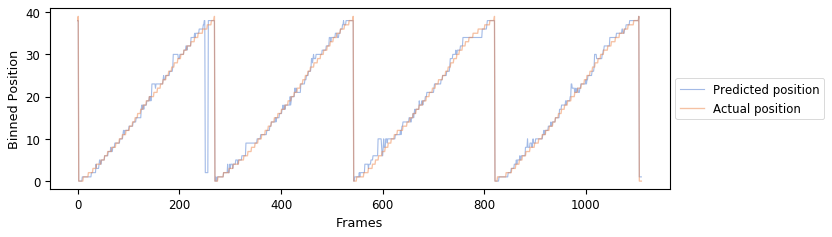

Testing without cell 37
1110/1110 [==============================] - 0s 19us/step

Accuracy of test set:: 47.21%


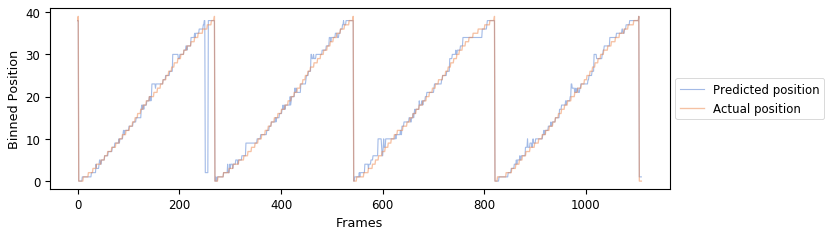

Testing without cell 38
1110/1110 [==============================] - 0s 17us/step

Accuracy of test set:: 47.03%


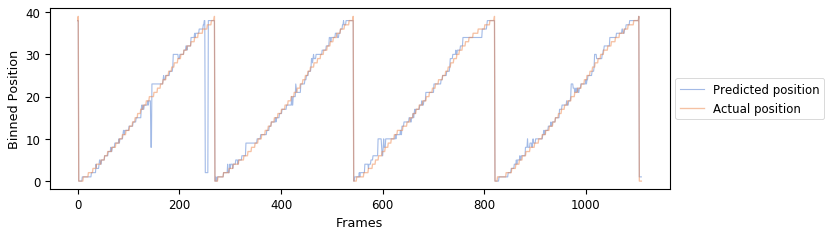

Testing without cell 39
1110/1110 [==============================] - 0s 19us/step

Accuracy of test set:: 45.59%


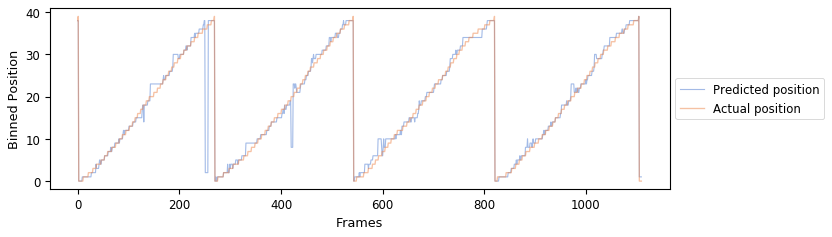

Testing without cell 40
1110/1110 [==============================] - 0s 9us/step

Accuracy of test set:: 49.82%


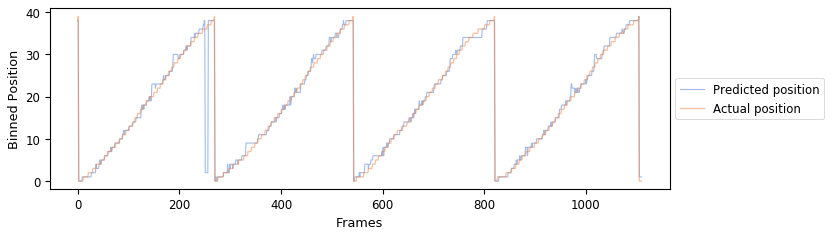

Testing without cell 41
1110/1110 [==============================] - 0s 18us/step

Accuracy of test set:: 47.57%


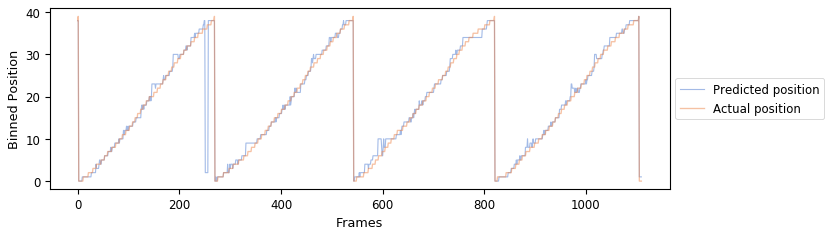

Testing without cell 42
1110/1110 [==============================] - 0s 14us/step

Accuracy of test set:: 47.30%


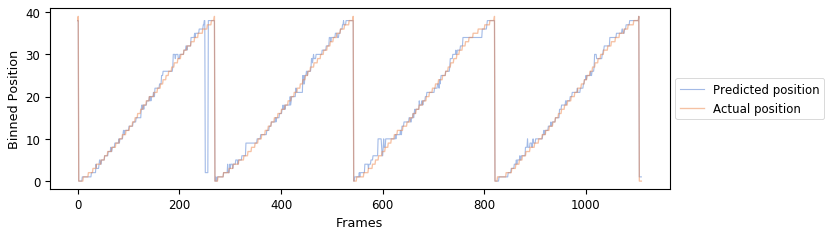

Testing without cell 43
1110/1110 [==============================] - 0s 9us/step

Accuracy of test set:: 47.39%


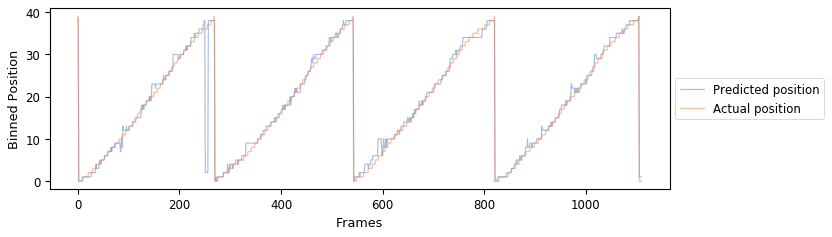

Testing without cell 44
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 49.37%


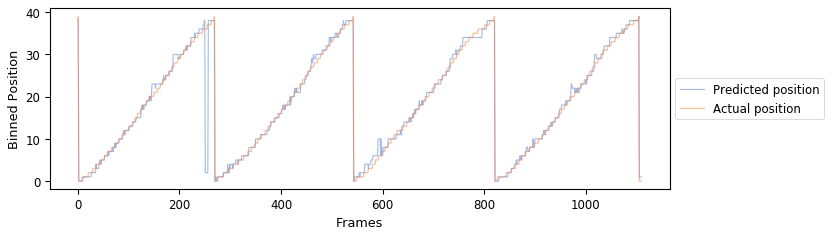

Testing without cell 45
1110/1110 [==============================] - 0s 9us/step

Accuracy of test set:: 45.14%


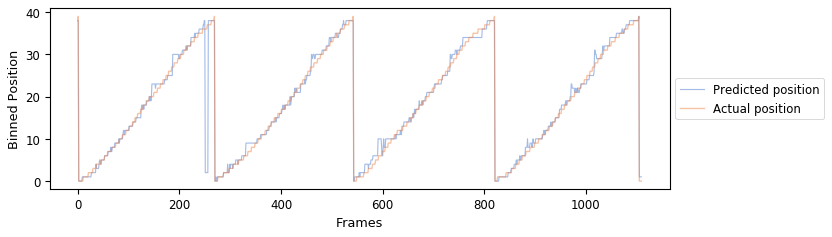

Testing without cell 46
1110/1110 [==============================] - 0s 13us/step

Accuracy of test set:: 47.84%


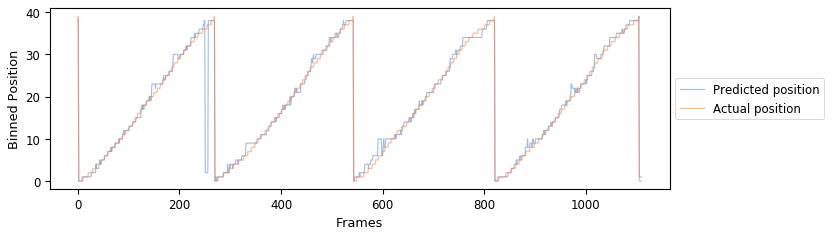

Testing without cell 47
1110/1110 [==============================] - 0s 11us/step

Accuracy of test set:: 46.40%


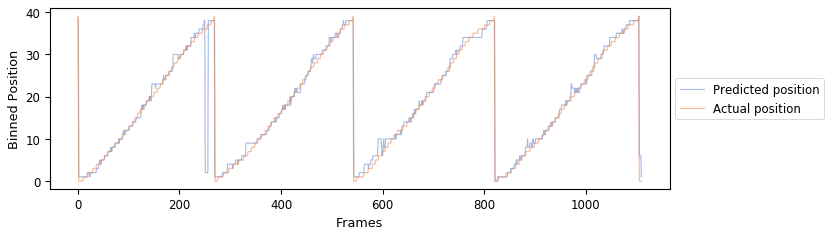

Testing without cell 48
1110/1110 [==============================] - 0s 9us/step

Accuracy of test set:: 48.02%


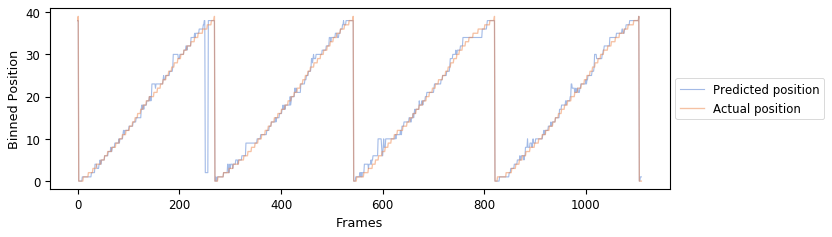

Testing without cell 49
1110/1110 [==============================] - 0s 11us/step

Accuracy of test set:: 46.85%


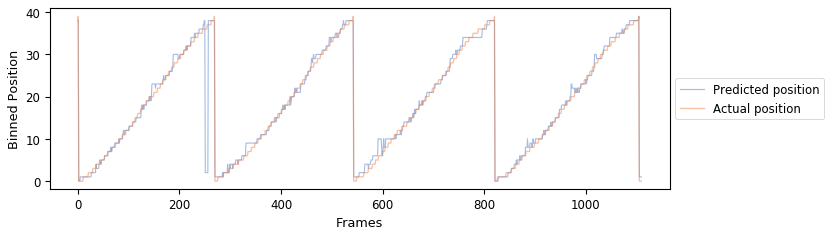

Testing without cell 50
1110/1110 [==============================] - 0s 8us/step

Accuracy of test set:: 46.40%


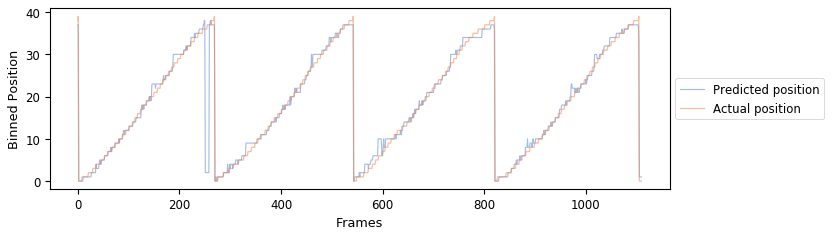

Testing without cell 51
1110/1110 [==============================] - 0s 14us/step

Accuracy of test set:: 47.84%


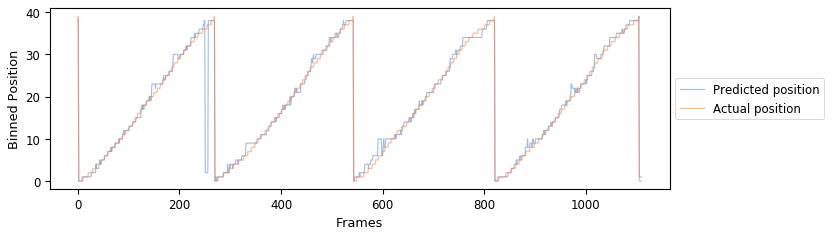

Testing without cell 52
1110/1110 [==============================] - 0s 8us/step

Accuracy of test set:: 47.84%


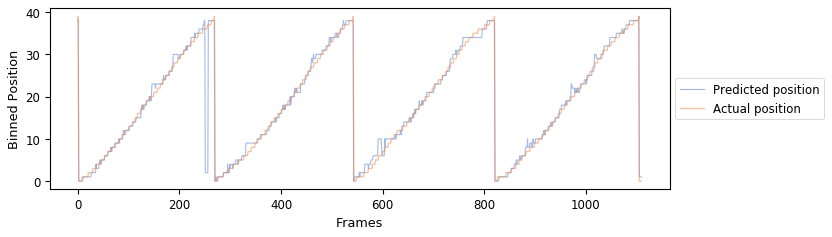

Testing without cell 53
1110/1110 [==============================] - 0s 9us/step

Accuracy of test set:: 47.93%


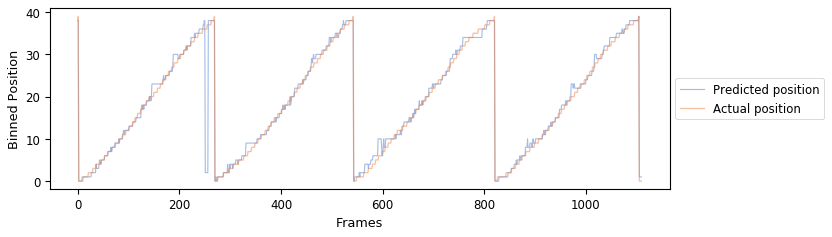

Testing without cell 54
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 47.75%


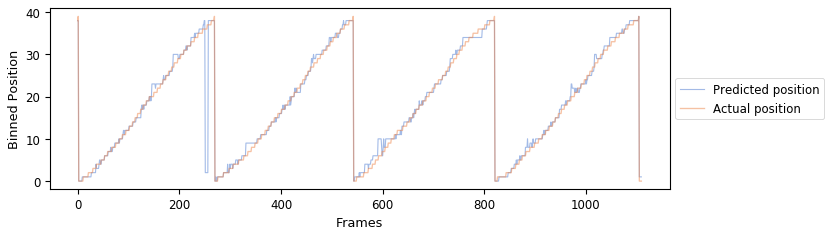

Testing without cell 55
1110/1110 [==============================] - 0s 12us/step

Accuracy of test set:: 48.02%


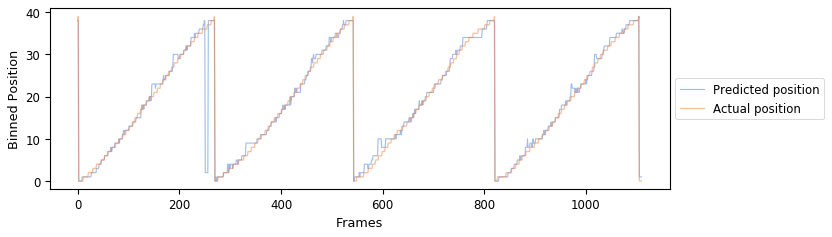

Testing without cell 56
1110/1110 [==============================] - 0s 8us/step

Accuracy of test set:: 46.67%


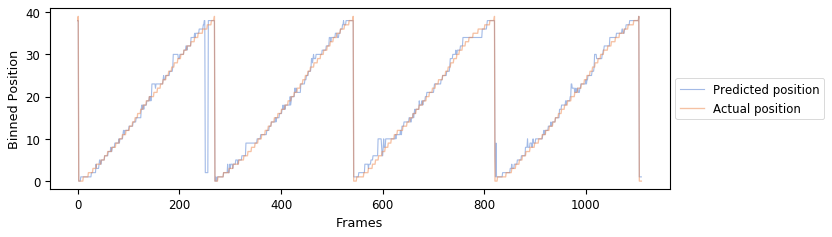

Testing without cell 57
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 46.85%


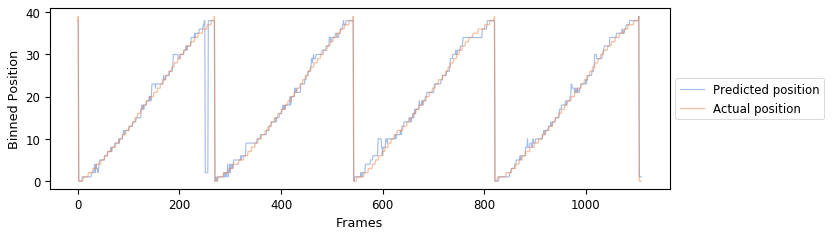

Testing without cell 58
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 48.38%


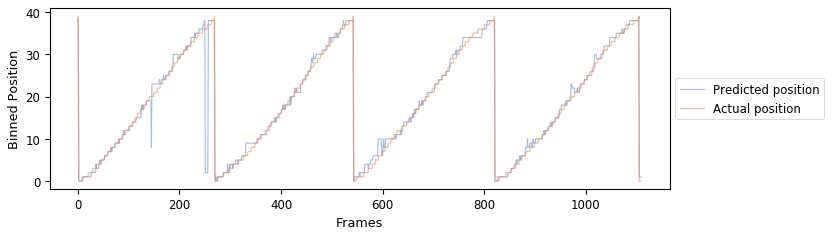

Testing without cell 59
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 46.58%


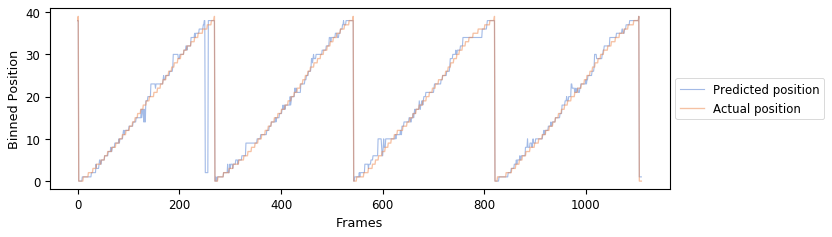

Testing without cell 60
1110/1110 [==============================] - 0s 11us/step

Accuracy of test set:: 46.49%


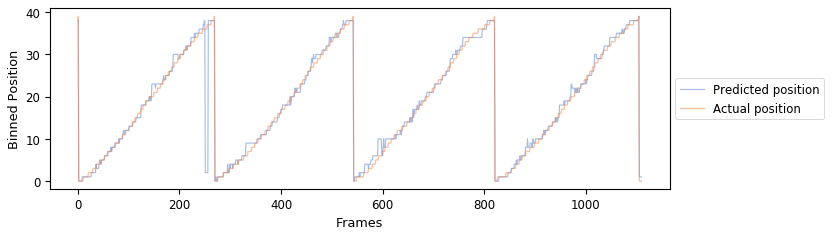

Testing without cell 61
1110/1110 [==============================] - 0s 14us/step

Accuracy of test set:: 47.75%


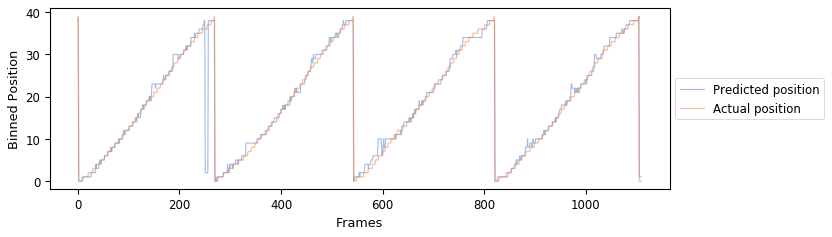

Testing without cell 62
1110/1110 [==============================] - 0s 13us/step

Accuracy of test set:: 47.75%


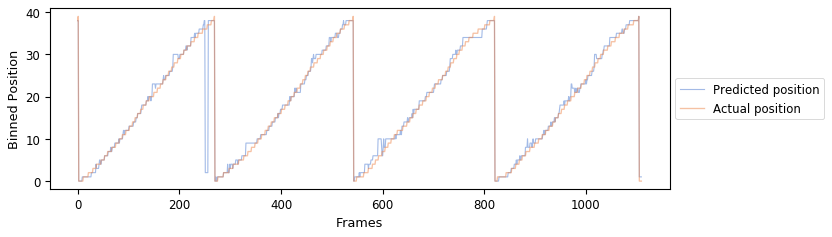

Testing without cell 63
1110/1110 [==============================] - 0s 18us/step

Accuracy of test set:: 47.39%


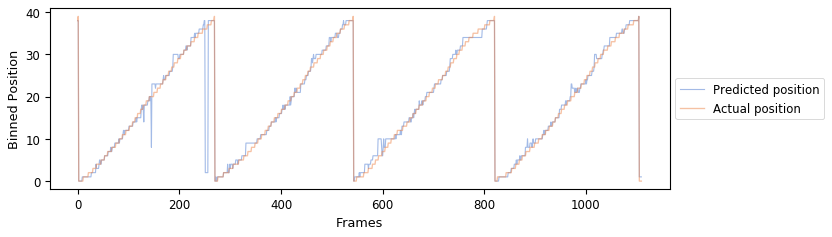

Testing without cell 64
1110/1110 [==============================] - 0s 17us/step

Accuracy of test set:: 47.93%


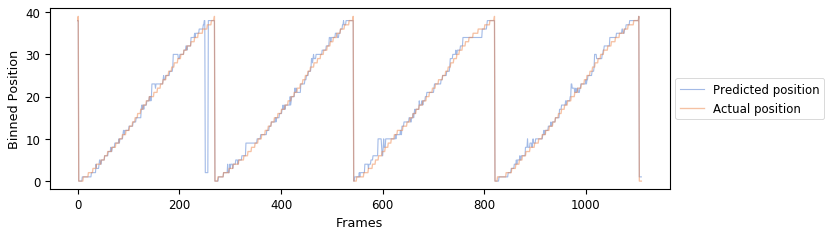

Testing without cell 65
1110/1110 [==============================] - 0s 14us/step

Accuracy of test set:: 47.93%


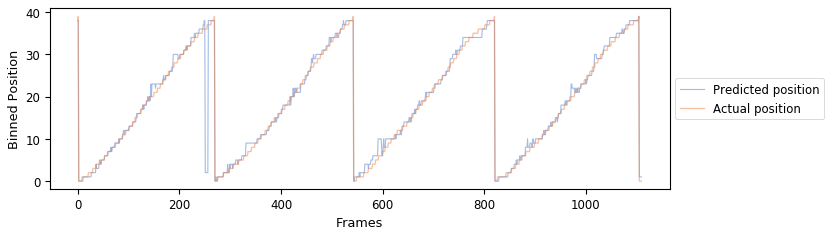

Testing without cell 66
1110/1110 [==============================] - 0s 16us/step

Accuracy of test set:: 46.85%


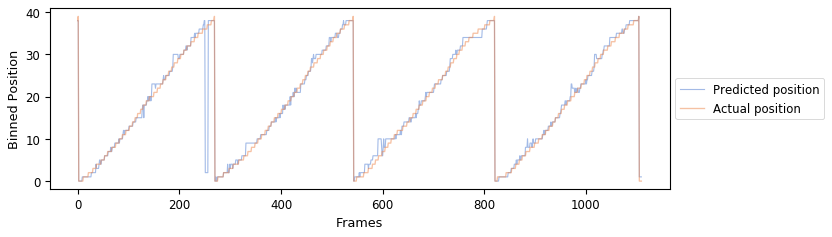

Testing without cell 67
1110/1110 [==============================] - 0s 17us/step

Accuracy of test set:: 47.75%


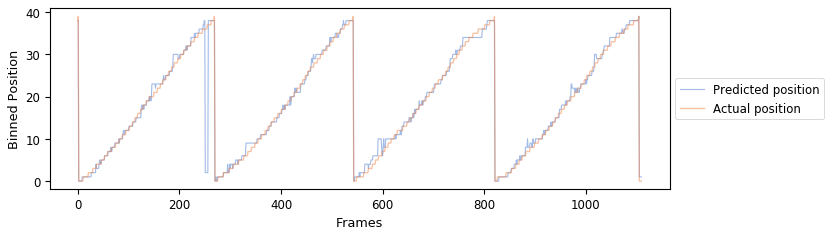

Testing without cell 68
1110/1110 [==============================] - 0s 16us/step

Accuracy of test set:: 48.47%


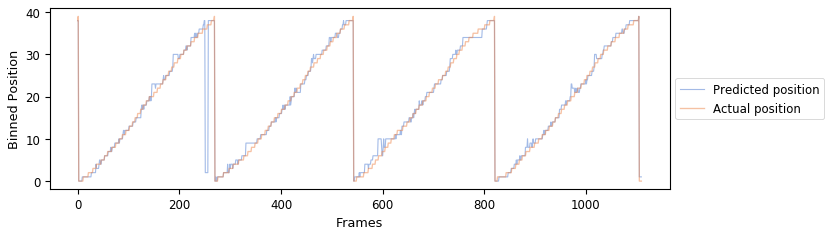

Testing without cell 69
1110/1110 [==============================] - 0s 18us/step

Accuracy of test set:: 48.29%


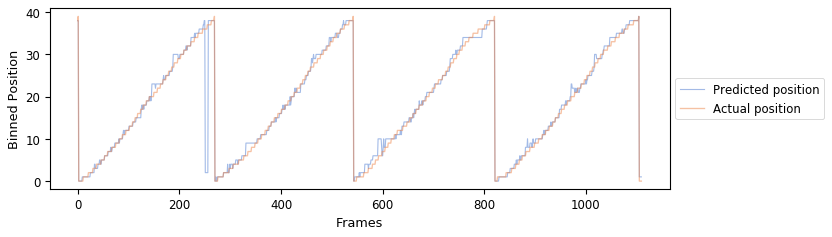

Testing without cell 70
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 48.74%


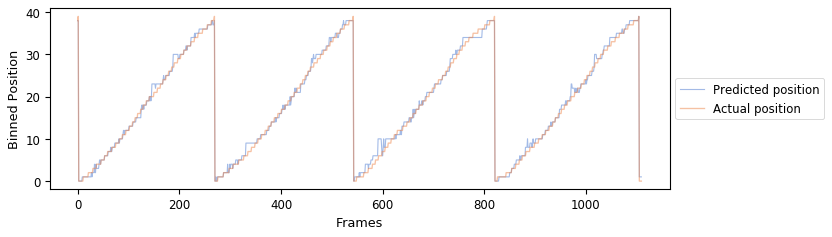

Testing without cell 71
1110/1110 [==============================] - 0s 11us/step

Accuracy of test set:: 47.66%


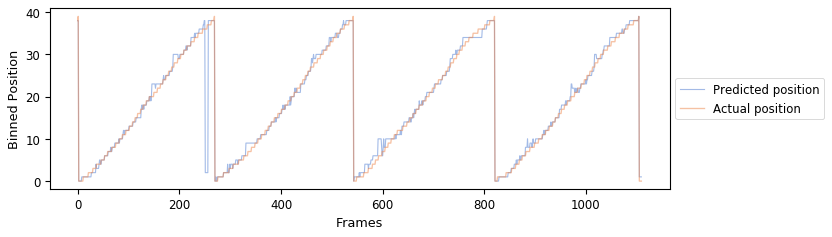

Testing without cell 72
1110/1110 [==============================] - 0s 12us/step

Accuracy of test set:: 47.39%


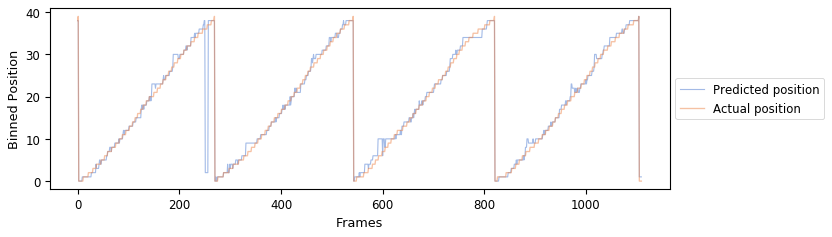

Testing without cell 73
1110/1110 [==============================] - 0s 11us/step

Accuracy of test set:: 47.66%


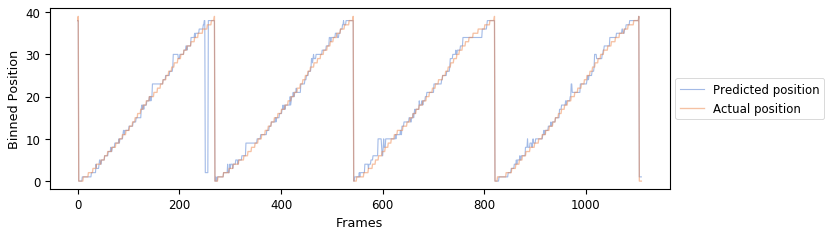

Testing without cell 74
1110/1110 [==============================] - 0s 12us/step

Accuracy of test set:: 48.20%


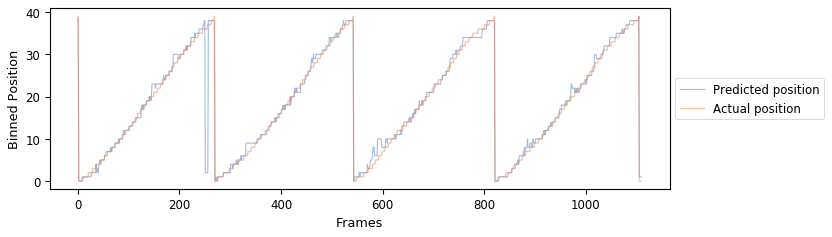

Testing without cell 75
1110/1110 [==============================] - 0s 16us/step

Accuracy of test set:: 47.84%


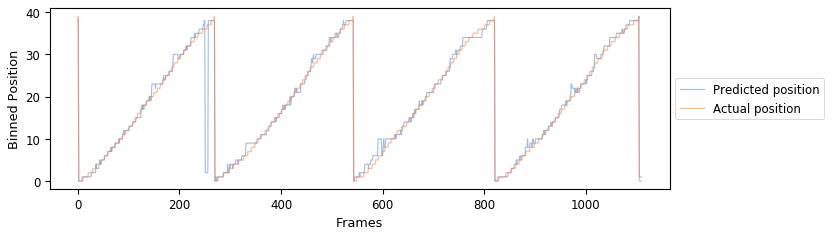

Testing without cell 76
1110/1110 [==============================] - 0s 9us/step

Accuracy of test set:: 47.93%


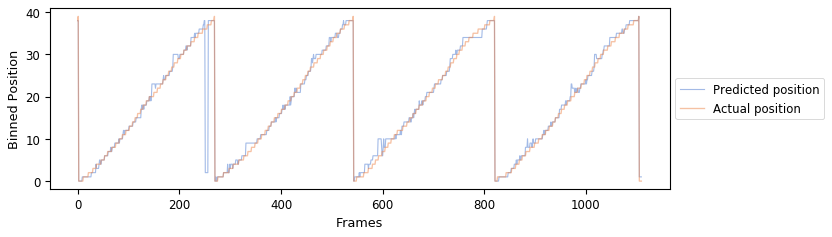

Testing without cell 77
1110/1110 [==============================] - 0s 11us/step

Accuracy of test set:: 47.21%


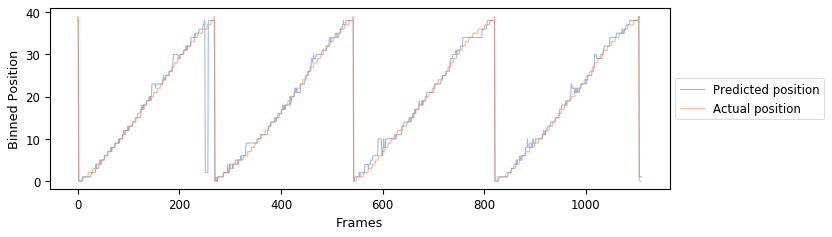

Testing without cell 78
1110/1110 [==============================] - 0s 8us/step

Accuracy of test set:: 47.39%


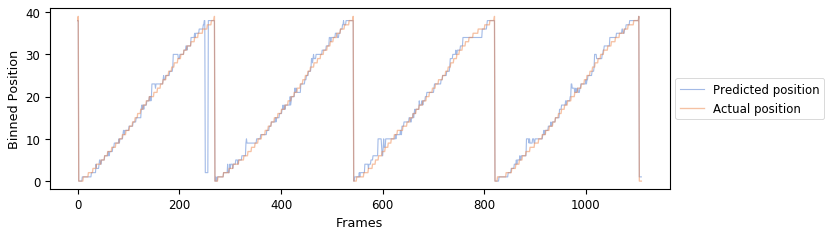

Testing without cell 79
1110/1110 [==============================] - 0s 21us/step

Accuracy of test set:: 45.59%


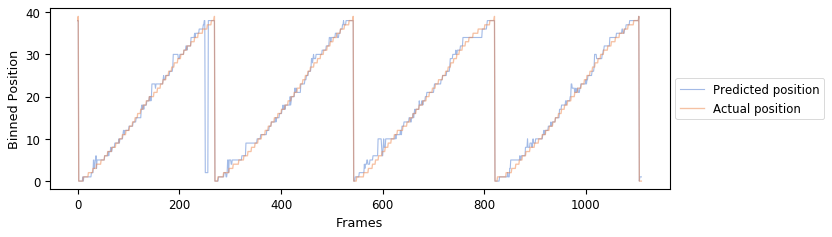

Testing without cell 80
1110/1110 [==============================] - 0s 7us/step

Accuracy of test set:: 47.84%


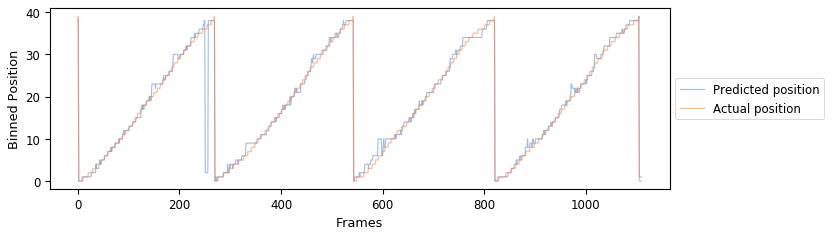

Testing without cell 81
1110/1110 [==============================] - 0s 17us/step

Accuracy of test set:: 48.56%


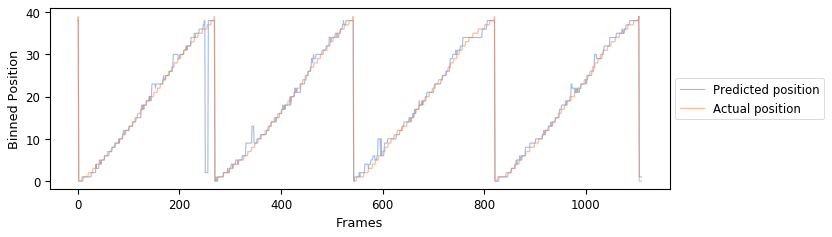

Testing without cell 82
1110/1110 [==============================] - 0s 8us/step

Accuracy of test set:: 46.94%


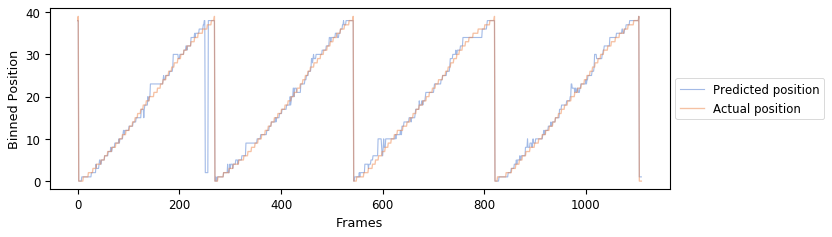

Testing without cell 83
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 47.66%


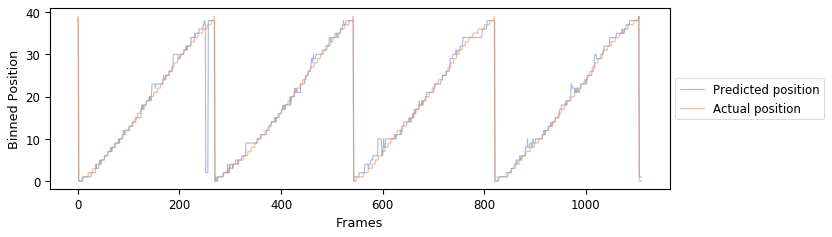

Testing without cell 84
1110/1110 [==============================] - 0s 10us/step

Accuracy of test set:: 47.21%


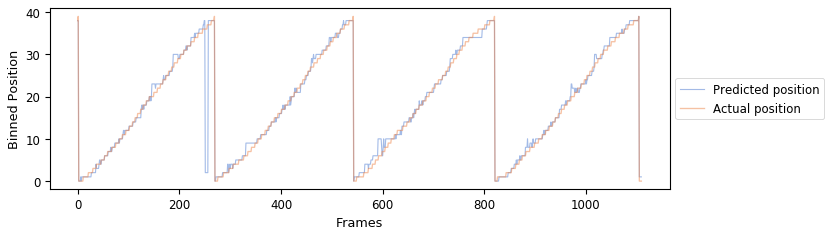

Testing without cell 85
1110/1110 [==============================] - 0s 25us/step

Accuracy of test set:: 47.39%


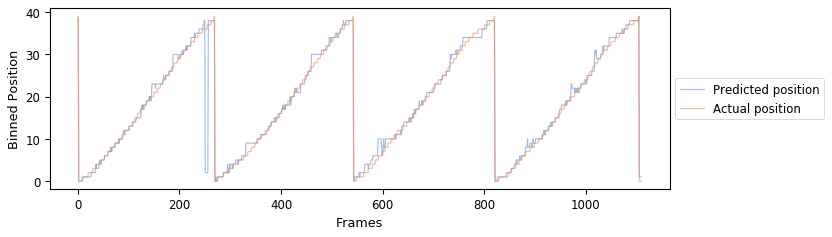

Testing without cell 86
1110/1110 [==============================] - 0s 14us/step

Accuracy of test set:: 47.66%


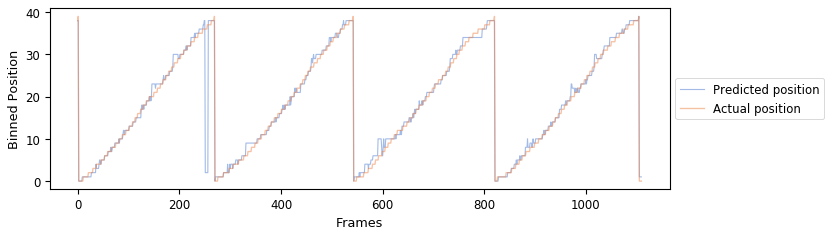

Testing without cell 87
1110/1110 [==============================] - 0s 22us/step

Accuracy of test set:: 46.40%


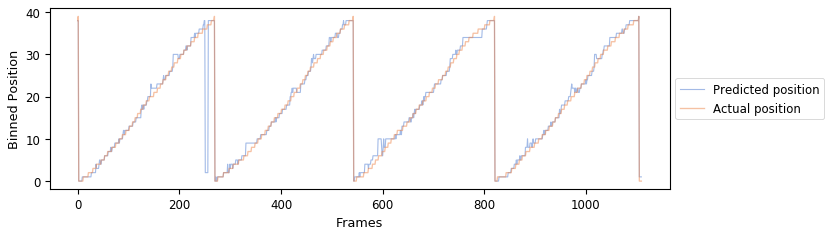

Testing without cell 88
1110/1110 [==============================] - 0s 7us/step

Accuracy of test set:: 47.75%


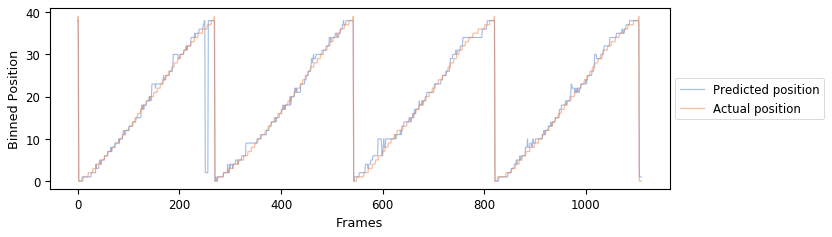

Testing without cell 89
1110/1110 [==============================] - 0s 13us/step

Accuracy of test set:: 45.68%


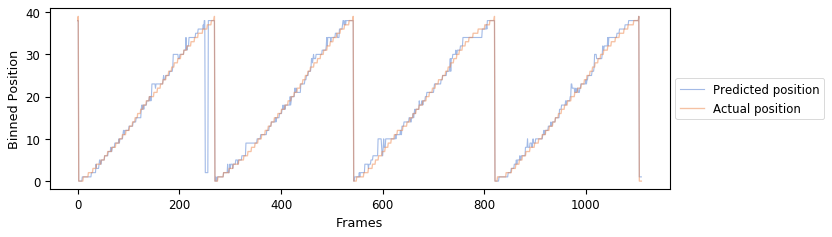

Testing without cell 90
1110/1110 [==============================] - 0s 9us/step

Accuracy of test set:: 48.02%


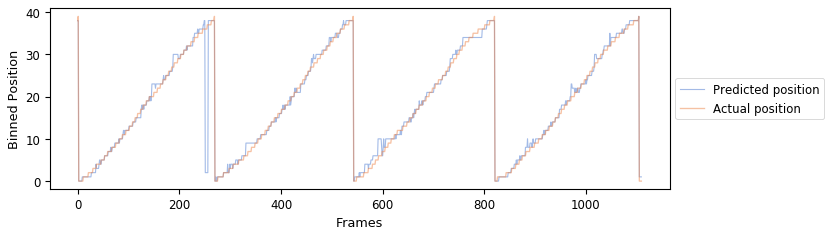

Testing without cell 91
1110/1110 [==============================] - 0s 12us/step

Accuracy of test set:: 47.39%


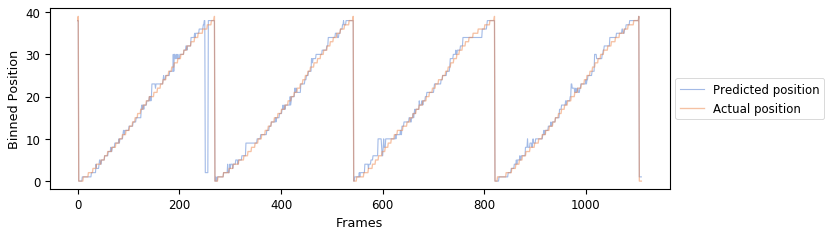

In [53]:
R2_withoutpf = np.zeros((np.size(X_pfs, 1)))
rho_withoutpf = np.zeros((np.size(X_pfs, 1)))
for c in np.arange(np.size(X_pfs, 1)):
    print(f'Testing without cell %d' %c)
    X_lo_test = copy(X_pf_test)
    X_lo_test[:, c] = 0    
    score, prediction = n.validate_model(densennmodel, X_lo_test, y_pf_test, plot_figure=1)
    # Print mean correlation and mean R2
    R2_withoutpf[c] = m.get_R2(np.argmax(y_pf_test, 1), prediction)
    rho_withoutpf[c] = m.get_rho(np.argmax(y_pf_test, 1), prediction)

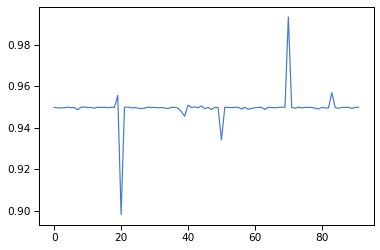

In [54]:
plt.plot(R2_withoutpf)

In [55]:
# Save ground truth
np.savez(os.path.join(SaveResults, 'leaveoneplacecellout.npz'), R2=R2_withoutpf, rho=rho_withoutpf)

#### Error rate with number of place cells

In [56]:
from sklearn.utils.random import sample_without_replacement

In [57]:
X_pfs = X[:, A.sig_PFs_cellnum_dict['Task1']]
numpfs = np.size(X_pfs, 1)
n = SDNN(dropout=dropout, epochs=epochs, hiddenlayer=1, units=units, batch_size=batch_size, verbose=0)

In [58]:
number_of_samples = [np.int(numpfs*0.1), np.int(numpfs*0.2), np.int(numpfs*0.5), np.int(numpfs*0.8), numpfs] 
iterations = 10

In [59]:
R2_numcells_dict = {str(k):[] for k in number_of_samples}
rho_numcells_dict = {str(k):[] for k in number_of_samples}
for ns in number_of_samples:
    print(f'Fitting on %d neurons' %ns)
    for i in np.arange(iterations):
        cells = sample_without_replacement(numpfs, ns)
        X_resample = X_pfs[:, cells]
        X_rs_train, X_rs_test, y_rs_train, y_rs_test = train_test_split(X_resample, y_cat, test_size=0.10, random_state=None, shuffle=False)
        densennmodel = n.fit_model(X_rs_train, y_rs_train)
        score, prediction = n.validate_model(densennmodel, X_rs_test, y_rs_test, plot_figure=0)
        R2_numcells_dict[str(ns)].append(m.get_R2(np.argmax(y_rs_test, 1), prediction))
        rho_numcells_dict[str(ns)].append(m.get_rho(np.argmax(y_rs_test, 1), prediction))

Fitting on 9 neurons
Fitting Model
9990/9990 [==============================] - 1s 95us/step

Accuracy of training set: 24.72%
1110/1110 [==============================] - 0s 8us/step

Accuracy of test set:: 15.41%
Fitting Model
9990/9990 [==============================] - 1s 108us/step

Accuracy of training set: 27.57%
1110/1110 [==============================] - 0s 5us/step

Accuracy of test set:: 13.06%
Fitting Model
9990/9990 [==============================] - 1s 60us/step

Accuracy of training set: 27.94%
1110/1110 [==============================] - 0s 7us/step

Accuracy of test set:: 16.58%
Fitting Model
9990/9990 [==============================] - 1s 62us/step

Accuracy of training set: 25.33%
1110/1110 [==============================] - 0s 8us/step

Accuracy of test set:: 17.30%
Fitting Model
9990/9990 [==============================] - 1s 62us/step

Accuracy of training set: 23.89%
1110/1110 [==============================] - 0s 7us/step

Accuracy of test set:: 23.33%
Fitting 

1110/1110 [==============================] - 0s 8us/step

Accuracy of test set:: 49.10%
Fitting Model
9990/9990 [==============================] - 1s 113us/step

Accuracy of training set: 80.87%
1110/1110 [==============================] - 0s 13us/step

Accuracy of test set:: 47.84%
Fitting Model
9990/9990 [==============================] - 1s 113us/step

Accuracy of training set: 81.46%
1110/1110 [==============================] - 0s 15us/step

Accuracy of test set:: 49.19%
Fitting Model
9990/9990 [==============================] - 1s 116us/step

Accuracy of training set: 80.76%
1110/1110 [==============================] - 0s 11us/step

Accuracy of test set:: 48.29%
Fitting Model
9990/9990 [==============================] - 1s 117us/step

Accuracy of training set: 81.40%
1110/1110 [==============================] - 0s 9us/step

Accuracy of test set:: 50.99%
Fitting Model
9990/9990 [==============================] - 2s 227us/step

Accuracy of training set: 81.34%
1110/1110 [===========

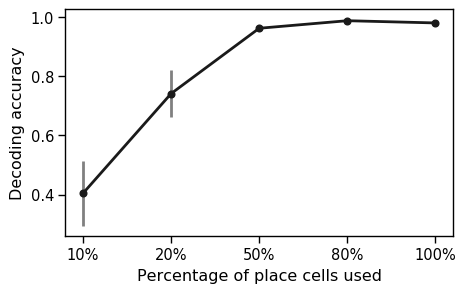

In [60]:
mean_R2 = []
sem_R2 = []
for  key, item in R2_numcells_dict.items():
    mean_R2.append(np.mean(item))
    sem_R2.append(scipy.stats.sem(item))
plt.figure(figsize=(5, 3), dpi=100)
plt.errorbar(np.arange(np.size(number_of_samples)), mean_R2, yerr=sem_R2, color='k', fmt='o-', ecolor='gray', capthick=5, linewidth=2)
plt.xticks(np.arange(np.size(number_of_samples)), ['10%', '20%', '50%', '80%', '100%'])
plt.xlabel('Percentage of place cells used')
plt.ylabel('Decoding accuracy');

In [61]:
np.savez(os.path.join(SaveResults, 'removecellsandfit.npz'), R2=R2_numcells_dict, rho=rho_numcells_dict, 
         numsamples=number_of_samples, itertions=iterations)